# `UTFVI` TensorFlow Decision Forests

In [1]:
ano = '2020'
md = '6'
folder = 'UHIn2m - speed + quad + RH + NDVI'
feat = ['windspeed','windquad','RH', 'NDVI']
t_index = 1

In [2]:
import tensorflow_decision_forests as tf
from tensorflow_decision_forests.tensorflow.core import Task

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score, r2_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, accuracy_score, roc_auc_score, roc_curve

# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

import pandas as pd
from collections import defaultdict

import statsmodels.api as sm
import shap

import dtreeviz
import numpy as np
import matplotlib.pyplot as plt

import warnings

# Settings the warnings to be ignored
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina' # Make visualizations look good
#%config InlineBackend.figure_format = 'svg'
%matplotlib inline

random_state = 42 # get reproducible trees

2024-02-08 10:52:20.479411: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-08 10:52:20.520726: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-08 10:52:20.521421: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-08 10:52:21.291001: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Load Sample Data

In [3]:
# df = pd.read_csv('../era5_hourly_estacoes_cuiaba_'+ano+'_01-mensal.csv')
# df = df[(df['UHIp2m']!='nenhum') & (df['UHIp2m']!='fraco') & (df['UHIp2m']!='medio')]

df = pd.read_csv('../era5_modis_daily_estacoes_cuiaba_'+ano+'_01-mensal.csv')
df = df[(df['UHIp2m']!='nenhum') & (df['UHIp2m']!='fraco') & (df['UHIp2m']!='medio')]

In [4]:
df = df[df['UHIp2m']!='nenhum']

In [5]:
df[['Temp2m_mean', 'Temp2m', 'UHIp2m', 'UHIn2m','UTFVI2m','skinTemp_mean', 'skinTemp', 'UHIp', 'UHIn','UTFVI','NDVI']]

,Temp2m_mean,Temp2m,UHIp2m,UHIn2m,UTFVI2m,skinTemp_mean,skinTemp,UHIp,UHIn,UTFVI,NDVI
53,21.491849,21.713098,forte,3.0,0.010190,20.359242,20.588831,forte,3.0,0.011151,0.318940
60,31.937911,32.291772,forte,3.0,0.010958,38.159160,39.339502,extremo,5.0,0.030004,0.419299
109,22.977859,23.385400,muito_forte,4.0,0.017427,20.201169,20.416040,forte,3.0,0.010525,0.431238
110,22.328449,22.739038,muito_forte,4.0,0.018057,19.643007,19.848749,forte,3.0,0.010365,0.431238
135,28.060798,28.356409,forte,3.0,0.010425,26.679228,27.049921,forte,3.0,0.013704,0.388546
...,...,...,...,...,...,...,...,...,...,...,...
5263,19.244481,19.567712,muito_forte,4.0,0.016519,17.236241,17.533350,muito_forte,4.0,0.016945,0.191585
5264,19.156631,19.475854,muito_forte,4.0,0.016391,17.158612,17.460901,muito_forte,4.0,0.017312,0.191585
5272,31.721674,32.067957,forte,3.0,0.010798,37.171312,38.363794,extremo,5.0,0.031084,0.188724
5275,30.152834,30.508936,forte,3.0,0.011672,34.207945,34.979089,extremo,5.0,0.022046,0.188724


In [6]:
df[(df['UHIp2m']=='forte')]

,index,latitude,longitude,Day,Month,Year,hour,Temp2m,skinTemp,dewPoint,...,HTI,windpower,UHIp,UHIn,UHIp2m,UHIn2m,date,timestamp,local,NDVI
53,1106,-15.632077,-56.056664,12,8,2020,10,21.713098,20.588831,12.689081,...,69.059555,medio,forte,3.0,forte,3.0,2020-08-12,2020-08-12,COXIPO,0.318940
60,1208,-15.632077,-56.056664,13,11,2020,16,32.291772,39.339502,21.540308,...,522.727374,medio,extremo,5.0,forte,3.0,2020-11-13,2020-11-13,COXIPO,0.419299
135,3257,-15.632077,-56.056664,2,12,2020,3,28.356409,27.049921,17.585474,...,184.417832,medio,forte,3.0,forte,3.0,2020-12-02,2020-12-02,COXIPO,0.388546
136,3258,-15.632077,-56.056664,2,12,2020,4,27.900354,26.580011,17.323328,...,174.234217,medio,forte,3.0,forte,3.0,2020-12-02,2020-12-02,COXIPO,0.388546
137,3259,-15.632077,-56.056664,2,12,2020,5,27.938562,26.666650,16.879999,...,177.117599,medio,muito_forte,4.0,forte,3.0,2020-12-02,2020-12-02,COXIPO,0.388546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5242,103637,-15.562907,-56.048130,5,8,2020,9,20.377924,18.270959,8.646326,...,41.075676,medio,forte,3.0,forte,3.0,2020-08-05,2020-08-05,MORADA_SERRAII,0.194187
5260,103905,-15.562907,-56.048130,6,8,2020,11,19.850977,18.363733,9.727319,...,41.317040,medio,forte,3.0,forte,3.0,2020-08-06,2020-08-06,MORADA_SERRAII,0.191585
5272,104103,-15.562907,-56.048130,7,4,2020,17,32.067957,38.363794,20.570032,...,494.720131,medio,extremo,5.0,forte,3.0,2020-04-07,2020-04-07,MORADA_SERRAII,0.188724
5275,104107,-15.562907,-56.048130,7,4,2020,20,30.508936,34.979089,21.802942,...,374.272889,alto,extremo,5.0,forte,3.0,2020-04-07,2020-04-07,MORADA_SERRAII,0.188724


In [7]:
df = df[df['UHIp2m']!='nenhum']

In [8]:
# ano = '2020'
mesInicial = 1
mesFinal = 3
# datei = ano+'-'+str(mesInicial)+'-23'
datei = str(int(ano)-1)+'-12'+'-21'
datef = ano+'-'+str(mesFinal)+'-21'
print(datei,datef)

2019-12-21 2020-3-21


In [9]:
df=df.drop_duplicates()

# Convert the date to datetime64
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [10]:
df.loc[(df['Temp2m']>df['skinTemp']) & (df['hour']>=9) & (df['hour']<=15)][['date','hour','skinTemp','skinTemp_mean','UTFVI','UHIp','NDVI', 'Temp2m','Temp2m_mean','UTFVI2m','UHIp2m','local']]

,date,hour,skinTemp,skinTemp_mean,UTFVI,UHIp,NDVI,Temp2m,Temp2m_mean,UTFVI2m,UHIp2m,local
53,2020-08-12,10,20.588831,20.359242,0.011151,forte,0.318940,21.713098,21.491849,0.010190,forte,COXIPO
236,2020-05-27,10,11.930475,11.767410,0.013668,forte,0.405847,15.451898,14.966415,0.031419,extremo,COXIPO
245,2020-05-27,9,12.313318,12.153231,0.013001,forte,0.405847,15.872217,15.267507,0.038099,extremo,COXIPO
343,2020-10-31,9,24.745081,24.437640,0.012424,forte,0.340839,26.709375,26.440063,0.010083,forte,COXIPO
375,2020-11-04,9,19.042261,18.819441,0.011701,forte,0.396348,23.718530,23.446326,0.011476,forte,COXIPO
...,...,...,...,...,...,...,...,...,...,...,...,...
5239,2020-08-05,11,19.253809,19.031498,0.011546,forte,0.194187,20.990503,20.766201,0.010686,forte,MORADA_SERRAII
5242,2020-08-05,9,18.270959,18.046515,0.012284,forte,0.194187,20.377924,20.122688,0.012525,forte,MORADA_SERRAII
5259,2020-08-06,10,17.315210,17.019498,0.017078,muito_forte,0.191585,19.267419,18.973008,0.015280,muito_forte,MORADA_SERRAII
5260,2020-08-06,11,18.363733,18.122053,0.013161,forte,0.191585,19.850977,19.614674,0.011904,forte,MORADA_SERRAII


In [11]:
# df_dif = df.loc[(df['Temp2m']>df['skinTemp'])][['date','hour','skinTemp','skinTemp_mean','UTFVI','UHIp','Temp2m','Temp2m_mean','UTFVI2m','UHIp2m','local']]

In [12]:
# df_dif[['Temp2m','skinTemp','date']].plot(x='date', y=['Temp2m'], kind='scatter', rot=90, c=df_dif['date'].dt.month, colormap='tab20', sharex=False);

In [13]:
# df_dif[['Temp2m','skinTemp','date']].plot(x='date', y=['skinTemp'], kind='scatter', rot=90, c=df_dif['date'].dt.month, colormap='tab20', sharex=False);

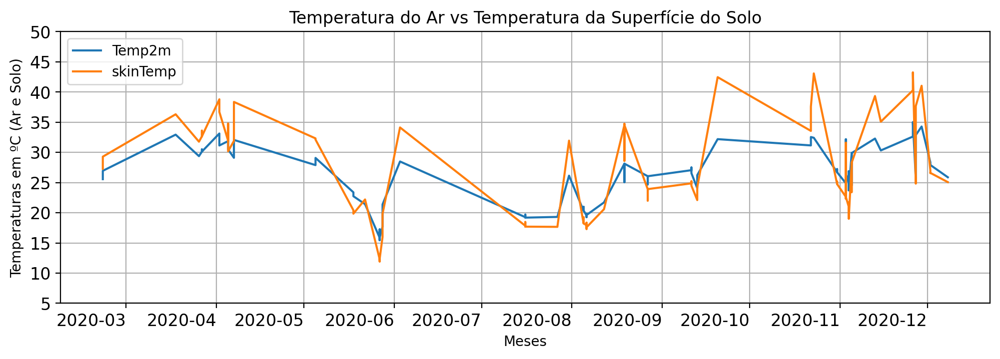

In [14]:
label = 'Meses'
res = df.plot(x='date', y=['Temp2m','skinTemp'], kind='line', rot=0, grid=True, ylim=(5, 50),
        title='Temperatura do Ar vs Temperatura da Superfície do Solo', xlabel=label, ylabel='Temperaturas em ºC (Ar e Solo)', fontsize=12, figsize=(12,4)).get_figure()

res.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Temp do Ar vs Temp do Solo-NDVI-"+ano+".png")

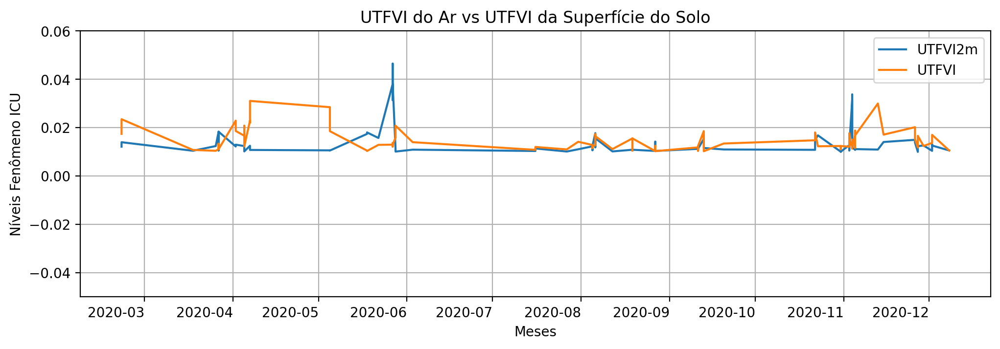

In [15]:
# df.plot(x='date', y=['UTFVI2m','UTFVI'], kind='line', rot=0, grid=True, title='UTFVI do Ar vs UTFVI da Superfície do Solo', xlabel=label,ylabel='Níveis Fenômeno ICU',fontsize=10, figsize=(12,4));
res = df.plot(x='date', y=['UTFVI2m','UTFVI'], kind='line',grid=True, ylim=(-0.05, 0.06), rot=0, title='UTFVI do Ar vs UTFVI da Superfície do Solo', xlabel=label,ylabel='Níveis Fenômeno ICU',fontsize=10, figsize=(12,4)).get_figure()

# Save figure
res.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UTFVI do Ar vs UTFVI-NDVI-"+ano+".png")

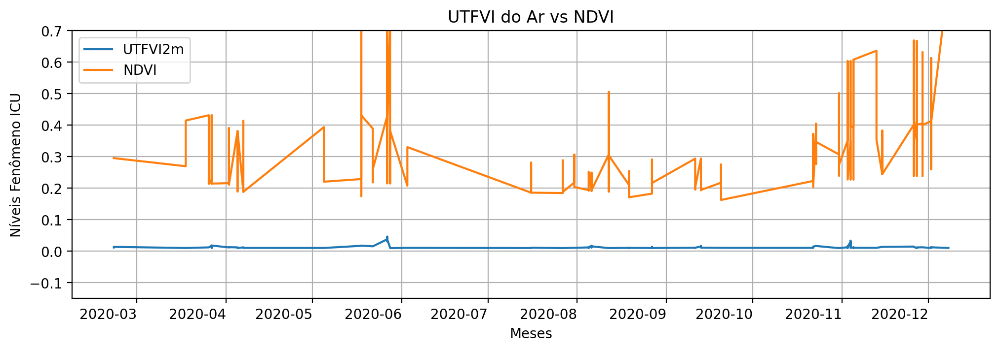

In [16]:
# df.plot(x='date', y=['UTFVI2m','UTFVI'], kind='line', rot=0, grid=True, title='UTFVI do Ar vs UTFVI da Superfície do Solo', xlabel=label,ylabel='Níveis Fenômeno ICU',fontsize=10, figsize=(12,4));
res = df.plot(x='date', y=['UTFVI2m','NDVI'], kind='line',grid=True, ylim=(-0.15, .7), rot=0, title='UTFVI do Ar vs NDVI', xlabel=label,ylabel='Níveis Fenômeno ICU',fontsize=10, figsize=(12,4)).get_figure()

# Save figure
res.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UTFVI do Ar vs NDVI-"+ano+".png")

In [17]:
df_UTFVI = df.loc[(df['UTFVI2m']>df['UTFVI'])][['date','hour','skinTemp','skinTemp_mean','UTFVI','UHIp','Temp2m','Temp2m_mean','UTFVI2m','UHIp2m','local']]
df_UTFVI

,date,hour,skinTemp,skinTemp_mean,UTFVI,UHIp,Temp2m,Temp2m_mean,UTFVI2m,UHIp2m,local
109,2020-05-18,5,20.416040,20.201169,0.010525,forte,23.385400,22.977859,0.017427,muito_forte,COXIPO
110,2020-05-18,6,19.848749,19.643007,0.010365,forte,22.739038,22.328449,0.018057,muito_forte,COXIPO
156,2020-10-23,16,43.083490,42.552531,0.012324,forte,32.421411,31.875558,0.016836,muito_forte,COXIPO
236,2020-05-27,10,11.930475,11.767410,0.013668,forte,15.451898,14.966415,0.031419,extremo,COXIPO
243,2020-05-27,7,13.069696,12.910849,0.012154,forte,17.250726,16.455774,0.046082,extremo,COXIPO
...,...,...,...,...,...,...,...,...,...,...,...
5102,2020-08-27,10,22.006799,21.732188,0.012478,forte,24.687402,24.335999,0.014234,forte,MORADA_SERRAII
5103,2020-08-27,11,23.916406,23.670001,0.010303,forte,26.055475,25.784941,0.010383,forte,MORADA_SERRAII
5241,2020-08-05,8,18.289606,18.077845,0.011578,forte,20.411279,20.163999,0.012115,forte,MORADA_SERRAII
5242,2020-08-05,9,18.270959,18.046515,0.012284,forte,20.377924,20.122688,0.012525,forte,MORADA_SERRAII


In [18]:
def degToCompass(num):
    val=int((num/22.5)+.5)
    arr=["N","NNE","NE","ENE","L","ESE", "SE", "SSE","S","SSW","SW","WSW","O","WNW","NW","NNW"]
    print(arr[(val % 16)])

In [19]:
df["windspeed"] = df["windspeed"] * 3.6

In [20]:
df['UHIn2m'],df['UHIp2m']

(53      3.0
 60      3.0
 109     4.0
 110     4.0
 135     3.0
        ... 
 5263    4.0
 5264    4.0
 5272    3.0
 5275    3.0
 5276    3.0
 Name: UHIn2m, Length: 451, dtype: float64,
 53            forte
 60            forte
 109     muito_forte
 110     muito_forte
 135           forte
            ...     
 5263    muito_forte
 5264    muito_forte
 5272          forte
 5275          forte
 5276          forte
 Name: UHIp2m, Length: 451, dtype: object)

In [21]:
df['UHIn2m'].value_counts()

3.0    314
4.0     77
5.0     60
Name: UHIn2m, dtype: int64

In [22]:
df['UHIp2m'].value_counts()

forte          314
muito_forte     77
extremo         60
Name: UHIp2m, dtype: int64

In [23]:
power = {
     'baixo':0,
     'medio':1, 
     'alto':2,
}

df['windpower'] = df['windpower'].map(power) # re-mapping

In [24]:
def degrees_to_cardinal(d):
    '''
    note: this is highly approximate...
    '''
    dirs = np.array(["N", "NNE", "NE", "ENE", "L", "ESE", "SE", "SSE",
                     "S", "SSW", "SW", "WSW", "O", "WNW", "NW", "NNW"], dtype='U')
    ix = np.round(d / (360. / len(dirs))).astype('i')
    return dirs[ix % 16]

In [25]:
df['winddir_stat_name'] = degrees_to_cardinal(df['winddir']) #o "-1" é para evitar erro de acesso indevido à uma posição inexistente do array
df['winddir_stat'] = degrees_to_cardinal(df['winddir']) #o "-1" é para evitar erro de acesso indevido à uma posição inexistente do array
print(df[['winddir_stat','winddir']])
df["winddir_stat"] = df.winddir_stat.astype("category").cat.codes

     winddir_stat     winddir
53              N    5.807925
60              N    1.080625
109             L   98.242957
110             L   89.001406
135           NNE   13.884147
...           ...         ...
5263           NE   45.137485
5264           NE   43.697055
5272           SW  214.172841
5275          SSW  212.776848
5276          SSW  209.732773

[451 rows x 2 columns]


In [26]:
del df['date']
del df['longitude']
del df['latitude']
# del df['UHIp']
# del df['skinTemp']
# del df['Temp2m']
# del df['dewPoint']
# del df['total_precipitation']
del df['Day']
del df['Month']
del df['THI']
del df['UHI']
del df['HTI']
del df['Year']
del df['winddir']
del df['winddir_stat']
# del df['RH']
# del df['speed_x']
# del df['speed_y']
# del df['Cidade']
# del df['Região']
# del df['UF']
# del df['total_evaporation']
# del df['windpower']
del df['timestamp']
del df['local']
# del df['UHIp2m']
del df['winddir_stat_name']
del df['skinTemp_mean']
del df['Temp2m_mean']
# del df['surface_pressure']
# del df['UHIn2m']
# del df['UTFVI2m']
del df['hour']

In [27]:
df['windquad'].value_counts()

1.0    124
2.0    116
8.0     56
5.0     55
3.0     44
4.0     33
6.0     15
7.0      8
Name: windquad, dtype: int64

In [28]:
quad = {
    1:'Primeiro',
    2:'Segundo', 
    3:'Terceiro',
    4:'Quarto',
    5:'Quinto',
    6:'Sexto',
    7:'Sétimo',
    8:'Oitavo'
}

df['windquad_cat'] = df['windquad'].map(quad) # re-mapping


In [29]:
# df[['Temp2m','RH','windspeed','windquad','UHIp2m','UTFVI2m','windquad_cat','NDVI']].to_csv('../random_forest/era5_modis_2m_'+ano+'.csv')

In [30]:
# quad = {
#     1:0,
#     2:1, 
#     3:2,
#     4:3,
#     5:4,
#     6:5,
#     7:6,
#     8:7
# }

# df['windquad'] = df['windquad'].map(quad) # re-mapping

In [31]:
df[df['UHIn2m']==3]

,index,Temp2m,skinTemp,dewPoint,total_precipitation,RH,windspeed,total_evaporation,surface_pressure,windquad,UTFVI,UTFVI2m,windpower,UHIp,UHIn,UHIp2m,UHIn2m,NDVI,windquad_cat
53,1106,21.713098,20.588831,12.689081,8.583069e-07,0.476950,7.387343,-0.000057,98820.70,1.0,0.011151,0.010190,1,forte,3.0,forte,3.0,0.318940,Primeiro
60,1208,32.291772,39.339502,21.540308,1.548889e-03,0.468182,9.133717,-0.001525,98786.03,1.0,0.030004,0.010958,1,extremo,5.0,forte,3.0,0.419299,Primeiro
135,3257,28.356409,27.049921,17.585474,0.000000e+00,0.466726,7.084406,-0.000032,98600484.00,1.0,0.013704,0.010425,1,forte,3.0,forte,3.0,0.388546,Primeiro
136,3258,27.900354,26.580011,17.323328,0.000000e+00,0.467919,7.816250,-0.000049,98581.19,1.0,0.014746,0.011307,1,forte,3.0,forte,3.0,0.388546,Primeiro
137,3259,27.938562,26.666650,16.879999,0.000000e+00,0.464595,8.620845,-0.000069,98559164.00,8.0,0.016667,0.013133,1,muito_forte,4.0,forte,3.0,0.388546,Oitavo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5242,103637,20.377924,18.270959,8.646326,0.000000e+00,0.457285,10.522906,-0.000005,99565984.00,2.0,0.012284,0.012525,1,forte,3.0,forte,3.0,0.194187,Segundo
5260,103905,19.850977,18.363733,9.727319,0.000000e+00,0.468484,7.909252,-0.000009,99820734.00,1.0,0.013161,0.011904,1,forte,3.0,forte,3.0,0.191585,Primeiro
5272,104103,32.067957,38.363794,20.570032,9.118319e-05,0.463012,8.214487,-0.001688,99070.47,5.0,0.031084,0.010798,1,extremo,5.0,forte,3.0,0.188724,Quinto
5275,104107,30.508936,34.979089,21.802942,2.084553e-04,0.481825,11.880875,-0.002472,98972.76,5.0,0.022046,0.011672,2,extremo,5.0,forte,3.0,0.188724,Quinto


In [32]:
utfvi = {
    5:6,
    4:5, 
    3:4,
    2:3,
    1:2,
    0:1,
}

df['UHIn2m'] = df['UHIn2m'].map(utfvi) # re-mapping

In [33]:
df[df['UHIn2m']==4]

,index,Temp2m,skinTemp,dewPoint,total_precipitation,RH,windspeed,total_evaporation,surface_pressure,windquad,UTFVI,UTFVI2m,windpower,UHIp,UHIn,UHIp2m,UHIn2m,NDVI,windquad_cat
53,1106,21.713098,20.588831,12.689081,8.583069e-07,0.476950,7.387343,-0.000057,98820.70,1.0,0.011151,0.010190,1,forte,3.0,forte,4,0.318940,Primeiro
60,1208,32.291772,39.339502,21.540308,1.548889e-03,0.468182,9.133717,-0.001525,98786.03,1.0,0.030004,0.010958,1,extremo,5.0,forte,4,0.419299,Primeiro
135,3257,28.356409,27.049921,17.585474,0.000000e+00,0.466726,7.084406,-0.000032,98600484.00,1.0,0.013704,0.010425,1,forte,3.0,forte,4,0.388546,Primeiro
136,3258,27.900354,26.580011,17.323328,0.000000e+00,0.467919,7.816250,-0.000049,98581.19,1.0,0.014746,0.011307,1,forte,3.0,forte,4,0.388546,Primeiro
137,3259,27.938562,26.666650,16.879999,0.000000e+00,0.464595,8.620845,-0.000069,98559164.00,8.0,0.016667,0.013133,1,muito_forte,4.0,forte,4,0.388546,Oitavo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5242,103637,20.377924,18.270959,8.646326,0.000000e+00,0.457285,10.522906,-0.000005,99565984.00,2.0,0.012284,0.012525,1,forte,3.0,forte,4,0.194187,Segundo
5260,103905,19.850977,18.363733,9.727319,0.000000e+00,0.468484,7.909252,-0.000009,99820734.00,1.0,0.013161,0.011904,1,forte,3.0,forte,4,0.191585,Primeiro
5272,104103,32.067957,38.363794,20.570032,9.118319e-05,0.463012,8.214487,-0.001688,99070.47,5.0,0.031084,0.010798,1,extremo,5.0,forte,4,0.188724,Quinto
5275,104107,30.508936,34.979089,21.802942,2.084553e-04,0.481825,11.880875,-0.002472,98972.76,5.0,0.022046,0.011672,2,extremo,5.0,forte,4,0.188724,Quinto


In [34]:
df['windquad'] = df['windquad'].astype(int)

In [35]:
# df['UHIn2m'] = df['UHIn2m'].astype(int)
df['UHIn2m'] = df['UHIn2m'].astype(int)
# df['UHIn'] = df['UHIn'] -1 
df['UHIn2m'].value_counts()

4    314
5     77
6     60
Name: UHIn2m, dtype: int64

In [36]:
# df['UHIt'] = df['UHIn'].apply(lambda x: 1 if x >= 4 else 0)
df['UHIt'] = df['UHIn2m'].apply(lambda x: 2 if x >= 4 else ( 1 if (x >= 2 and x <= 3) else 0))

In [37]:
df['windquad_cat'].value_counts()

Primeiro    124
Segundo     116
Oitavo       56
Quinto       55
Terceiro     44
Quarto       33
Sexto        15
Sétimo        8
Name: windquad_cat, dtype: int64

# Classifiers

To demonstrate classifier decision trees, we trying to model using six features to predict the boolean survived target.

In [38]:
df

,index,Temp2m,skinTemp,dewPoint,total_precipitation,RH,windspeed,total_evaporation,surface_pressure,windquad,UTFVI,UTFVI2m,windpower,UHIp,UHIn,UHIp2m,UHIn2m,NDVI,windquad_cat,UHIt
53,1106,21.713098,20.588831,12.689081,8.583069e-07,0.476950,7.387343,-0.000057,98820.70,1,0.011151,0.010190,1,forte,3.0,forte,4,0.318940,Primeiro,2
60,1208,32.291772,39.339502,21.540308,1.548889e-03,0.468182,9.133717,-0.001525,98786.03,1,0.030004,0.010958,1,extremo,5.0,forte,4,0.419299,Primeiro,2
109,2779,23.385400,20.416040,19.030969,0.000000e+00,0.511810,2.281553,-0.000032,99238.14,3,0.010525,0.017427,0,forte,3.0,muito_forte,5,0.431238,Terceiro,2
110,2780,22.739038,19.848749,18.932458,0.000000e+00,0.515845,2.049673,-0.000035,99187.89,2,0.010365,0.018057,0,forte,3.0,muito_forte,5,0.431238,Segundo,2
135,3257,28.356409,27.049921,17.585474,0.000000e+00,0.466726,7.084406,-0.000032,98600484.00,1,0.013704,0.010425,1,forte,3.0,forte,4,0.388546,Primeiro,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5263,103924,19.567712,17.533350,7.852045,0.000000e+00,0.457110,9.307008,-0.000005,99639.09,2,0.016945,0.016519,1,muito_forte,4.0,muito_forte,5,0.191585,Segundo,2
5264,103925,19.475854,17.460901,8.147791,0.000000e+00,0.459806,9.309723,-0.000006,99684.39,1,0.017312,0.016391,1,muito_forte,4.0,muito_forte,5,0.191585,Primeiro,2
5272,104103,32.067957,38.363794,20.570032,9.118319e-05,0.463012,8.214487,-0.001688,99070.47,5,0.031084,0.010798,1,extremo,5.0,forte,4,0.188724,Quinto,2
5275,104107,30.508936,34.979089,21.802942,2.084553e-04,0.481825,11.880875,-0.002472,98972.76,5,0.022046,0.011672,2,extremo,5.0,forte,4,0.188724,Quinto,2


In [39]:
df[['Temp2m','RH','windspeed','windquad','UHIp2m','UTFVI2m','windquad_cat','NDVI']].to_csv('../random_forest/era5_modis_2m_'+ano+'.csv')

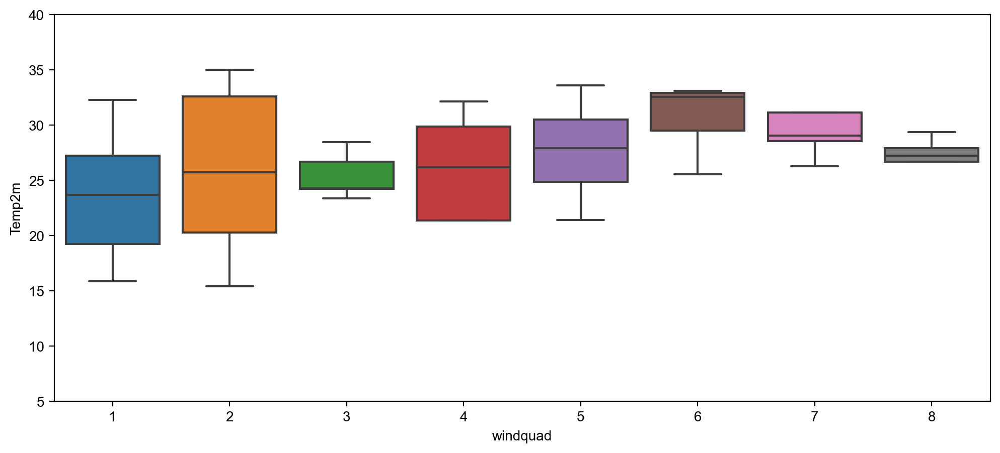

In [40]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,5))
ax.set(ylim=(5, 40))
sns.set_style('whitegrid')
sns.boxplot(x = df['windquad'],
                y = df['Temp2m'], 
                ax = ax, showfliers=False,)
# ax = sns.stripplot(data = df, x='Precipitação (mm)', y='Temperatura (ºC)', hue="Temperatura (ºC)")  
fig.savefig('cuiaba_boxplot_dir_temp_ar-'+'NDVI'+'.png')

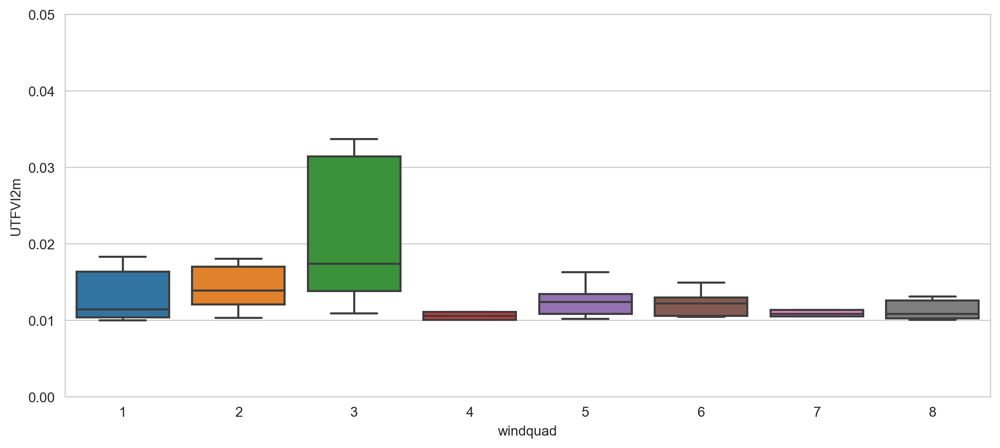

In [41]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,5))
ax.set(ylim=(0,0.05))
sns.set_style('whitegrid')
sns.boxplot(x = df['windquad'],
                y = df['UTFVI2m'], 
                ax = ax, showfliers=False,)
# ax = sns.stripplot(data = df, x='Precipitação (mm)', y='Temperatura (ºC)', hue="Temperatura (ºC)")  
fig.savefig('cuiaba_boxplot_dir_UTFVI2m -'+'NDVI'+'.png')

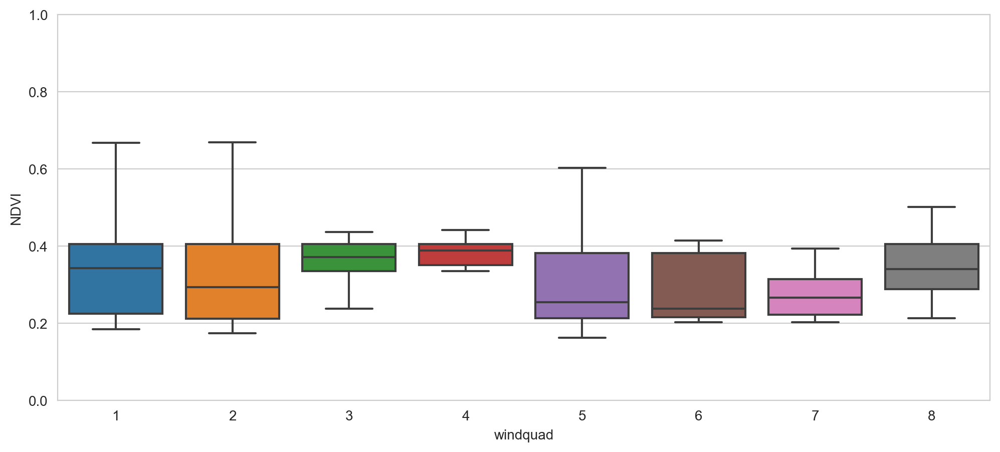

In [42]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,5))
ax.set(ylim=(0,1))
sns.set_style('whitegrid')
sns.boxplot(x = df['windquad'],
                y = df['NDVI'], 
                ax = ax, showfliers=False,)
# ax = sns.stripplot(data = df, x='Precipitação (mm)', y='Temperatura (ºC)', hue="Temperatura (ºC)")  
fig.savefig('cuiaba_boxplot_dir -'+'NDVI'+'.png')

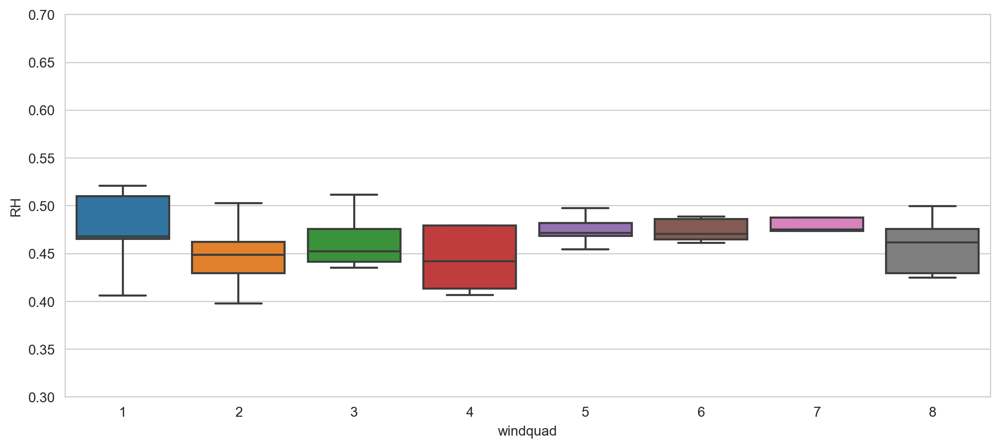

In [43]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,5))
ax.set(ylim=(0.3,.7))
sns.set_style('whitegrid')
sns.boxplot(x = df['windquad'],
                y = df['RH'], 
                ax = ax, showfliers=False,)
# ax = sns.stripplot(data = df, x='Precipitação (mm)', y='Temperatura (ºC)', hue="Temperatura (ºC)")  
fig.savefig('cuiaba_boxplot_dir_RH -'+'NDVI'+'.png')

In [44]:
quad = {
    1:0,
    2:1, 
    3:2,
    4:3,
    5:4,
    6:5,
    7:6,
    8:7
}

df['windquad'] = df['windquad'].map(quad) # re-mapping

In [45]:
UTFVI_label = "UHIp2m"   # Name of the classification target label
classes = list(df[UTFVI_label].unique())
df[UTFVI_label] = df[UTFVI_label].map(classes.index)
print(f"Target '{UTFVI_label}'' classes: {classes}")

Target 'UHIp2m'' classes: ['forte', 'muito_forte', 'extremo']


In [46]:
df['UHIp2m'].value_counts()

0    314
1     77
2     60
Name: UHIp2m, dtype: int64

In [47]:
X = df[feat]
y = df['UHIp2m']

In [48]:
features = feat
target = 'UHIp2m'
df[features + [target]]

,windspeed,windquad,RH,NDVI,UHIp2m
53,7.387343,0,0.476950,0.318940,0
60,9.133717,0,0.468182,0.419299,0
109,2.281553,2,0.511810,0.431238,1
110,2.049673,1,0.515845,0.431238,1
135,7.084406,0,0.466726,0.388546,0
...,...,...,...,...,...
5263,9.307008,1,0.457110,0.191585,1
5264,9.309723,0,0.459806,0.191585,1
5272,8.214487,4,0.463012,0.188724,0
5275,11.880875,4,0.481825,0.188724,0


In [49]:
# features
dataset_tf = tf.keras.pd_dataframe_to_tf_dataset(df[features + [target]], label=target)
model = tf.keras.RandomForestModel(max_depth=int(md), random_seed = random_state, task=Task.CLASSIFICATION)
model.fit(dataset_tf)
model.compile(metrics = ["accuracy"])
ev = model.evaluate(dataset_tf)

Use /tmp/tmpal2d839o as temporary training directory
Reading training dataset...


2024-02-08 10:52:27.234124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_3' with dtype double and shape [451]
	 [[{{node Placeholder/_3}}]]


Training dataset read in 0:00:03.083815. Found 451 examples.
Training model...
Model trained in 0:00:00.059479
Compiling model...


[INFO 24-02-08 10:52:30.3521 -04 kernel.cc:1242] Loading model from path /tmp/tmpal2d839o/model/ with prefix 9ad2125619414d34
[INFO 24-02-08 10:52:30.3653 -04 decision_forest.cc:660] Model loaded with 300 root(s), 8354 node(s), and 4 input feature(s).
[INFO 24-02-08 10:52:30.3653 -04 abstract_model.cc:1311] Engine "RandomForestGeneric" built
[INFO 24-02-08 10:52:30.3653 -04 kernel.cc:1074] Use fast generic engine
2024-02-08 10:52:30.379272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype int64 and shape [451]
	 [[{{node Placeholder/_2}}]]


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model compiled.
1/1 [==============================] - 0s 246ms/step - loss: 0.0000e+00 - accuracy: 0.9069


In [50]:
print(f"BinaryCross Entropy Loss: {ev[0]}")
print(f"Accuracy: {ev[1]}")


BinaryCross Entropy Loss: 0.0
Accuracy: 0.9068736433982849


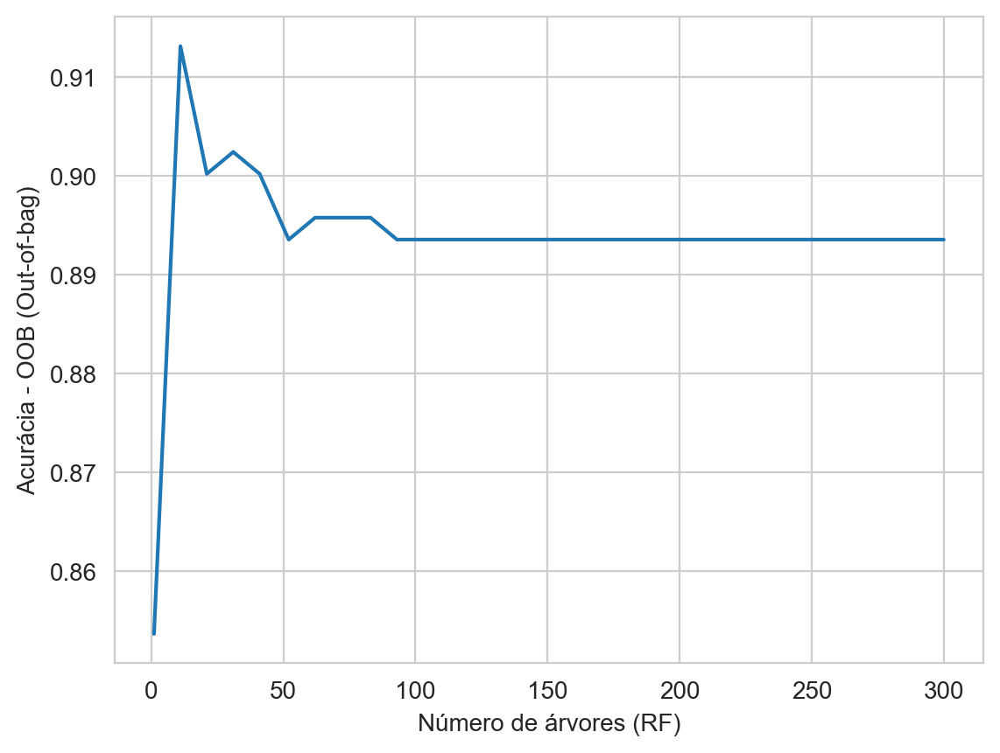

In [51]:
import matplotlib.pyplot as plt
logs = model.make_inspector().training_logs()
plt.plot([log.num_trees for log in logs], [log.evaluation.accuracy for log in logs])
plt.xlabel("Número de árvores (RF)")
plt.ylabel("Acurácia - OOB (Out-of-bag)")
plt.show()

## Initialize dtreeviz model (adaptor)

To adapt dtreeviz to a specific model, use the `model()` function to get an adaptor.  You'll need to provide the model, X/y data, feature names, target name, and target class names:

In [52]:
model.summary()

Model: "random_forest_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
Total params: 1
Trainable params: 0
Non-trainable params: 1
_________________________________________________________________
Type: "RANDOM_FOREST"
Task: CLASSIFICATION
Label: "__LABEL"

Input Features (4):
	NDVI
	RH
	windquad
	windspeed

No weights

Variable Importance: INV_MEAN_MIN_DEPTH:
    1. "windspeed"  0.711633 ################
    2.        "RH"  0.332602 ###
    3.  "windquad"  0.218533 
    4.      "NDVI"  0.215663 

Variable Importance: NUM_AS_ROOT:
    1. "windspeed" 218.000000 ################
    2.        "RH" 82.000000 

Variable Importance: NUM_NODES:
    1. "windspeed" 1883.000000 ################
    2.        "RH" 1093.000000 ######
    3.      "NDVI" 541.000000 
    4.  "windquad" 510.000000 

Variable Importance: SUM_SCORE:
    1. "windspeed" 60421.890827 ################
    2.        "RH" 19579.192989 #

In [53]:
model.make_inspector().variable_importances()

{'INV_MEAN_MIN_DEPTH': [("windspeed" (1; #4), 0.7116330840331694),
  ("RH" (1; #1), 0.33260172591856935),
  ("windquad" (1; #3), 0.21853273142795043),
  ("NDVI" (1; #0), 0.21566278095761496)],
 'SUM_SCORE': [("windspeed" (1; #4), 60421.89082732983),
  ("RH" (1; #1), 19579.192989016883),
  ("windquad" (1; #3), 6890.391813341528),
  ("NDVI" (1; #0), 3032.60954930773)],
 'NUM_AS_ROOT': [("windspeed" (1; #4), 218.0), ("RH" (1; #1), 82.0)],
 'NUM_NODES': [("windspeed" (1; #4), 1883.0),
  ("RH" (1; #1), 1093.0),
  ("NDVI" (1; #0), 541.0),
  ("windquad" (1; #3), 510.0)]}

In [54]:
inspector = model.make_inspector()
print("Model type:", inspector.model_type())
print("Number of trees:", inspector.num_trees())
print("Objective:", inspector.objective())
print("Input features:", inspector.features())

Model type: RANDOM_FOREST
Number of trees: 300
Objective: Classification(label=__LABEL, class=None, num_classes=3)
Input features: ["NDVI" (1; #0), "RH" (1; #1), "windquad" (1; #3), "windspeed" (1; #4)]


In [55]:
print(features)
print(target)
print(classes)

['windspeed', 'windquad', 'RH', 'NDVI']
UHIp2m
['forte', 'muito_forte', 'extremo']


In [56]:
viz_model = dtreeviz.model(model, 
                           # tree_index=t_index,
                           tree_index=5,
                           X_train=df[features],
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU',
                           class_names=classes)

We'll use this model to demonstrate dtreeviz functionality in the following sections; the code will look the same for any decision tree library once we have this model adaptor.

## Tree structure visualizations
To show the decision tree structure using the default visualization, call `view()`:

In [57]:
v = viz_model.view(scale=2.1)
v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UHIn+NDVI x ALL-MD"+md+"-"+ano+".svg")

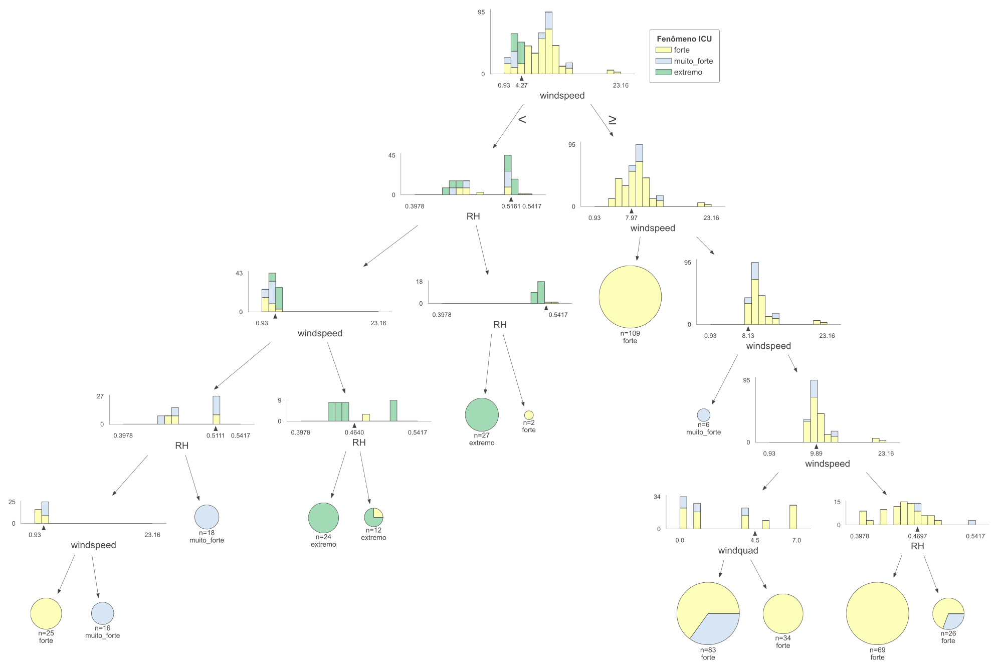

In [58]:
viz_model.view(scale=2.1)

To change the visualization, you can pass parameters, such as changing the orientation to left-to-right:

In [59]:
# v = viz_model.view(orientation="LR",scale=2.1)
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UHIn x ALL-LR-MD"+md+"-"+ano+".svg")

To visualize larger trees, you can reduce the amount of detail by turning off the fancy view:

In [60]:
# viz_model.view(fancy=False)

Another way to reduce the visualization size is to specify the tree depths of interest:

In [61]:
# v = viz_model.view(depth_range_to_display=(1, 2)) # root is level 0
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-range-"+ano+".svg")

## Prediction path explanations

For interpretation purposes, we often want to understand how a tree behaves for a specific instance. Let's pick a specific instance:

In [62]:
x = df[features].iloc[np.random.randint(0, len(df)),:].values

and then display the path through the tree structure:

In [63]:
viz_model.view(x=x)
v = viz_model.view(x=x)
v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF - UHIn - NDVI - classification-MD_"+md+"-predict-"+ano+".svg")

In [64]:
# v = viz_model.view(x=x, show_just_path=True)
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF - UHIn - NDVI - classification-prediction"+md+"-path-"+ano+".svg")

You can also get a string representation explaining the comparisons made as an instance is run down the tree:

In [65]:
print(viz_model.explain_prediction_path(x))

8.13 <= windspeed  < 9.89
windquad < 4.5



# `Features` Importance

In [66]:
# # let's create a dictionary of features and their importance values
# feat_dict= {}
# for col, val in sorted(zip(X_train.columns, model.feature_importances_),key=lambda x:x[1],reverse=True):
#   feat_dict[col]=val

## Leaf info

There are a number of functions to get information about the leaves of the tree.

In [67]:
# viz_model.leaf_sizes()

In [68]:
# viz_model.ctree_leaf_distributions()

In [69]:
# viz_model.node_stats(node_id=4)

In [70]:
# v = viz_model.ctree_feature_space(features=['windspeed'], show={'splits','legend'}, figsize=(10,5))

In [71]:
# viz_model.ctree_feature_space(nbins=40, 
#                               gtype='barstacked', 
#                               show={'splits','title'}, 
#                               features=['windspeed','RH'],
#                               figsize=(10,5))

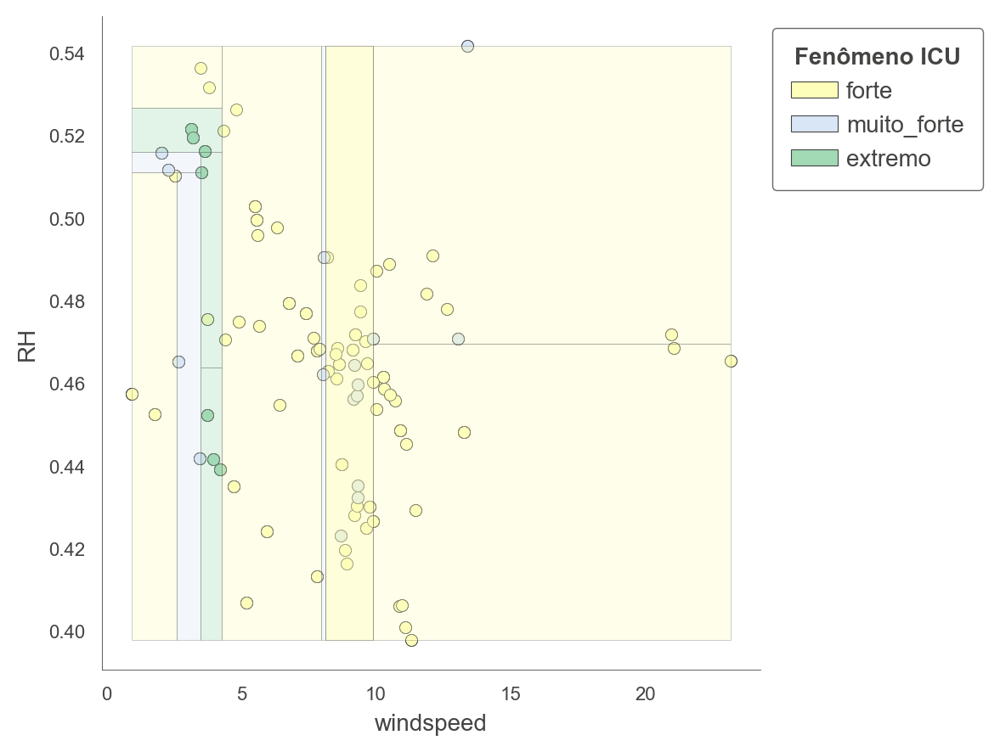

In [72]:
viz_model.ctree_feature_space(features=['windspeed','RH'], show={'splits','legend'}, figsize=(5,5))

In [73]:
# print(f"Available variable importances:")
# for importance in inspector.variable_importances().keys():
#   print("\t", importance)

In [74]:
# import matplotlib.pyplot as plt

# plt.figure(figsize=(12, 4))

# # Mean decrease in AUC of the class 1 vs the others.
# variable_importance_metric = "INV_MEAN_MIN_DEPTH"
# variable_importances = inspector.variable_importances()[variable_importance_metric]

# # Extract the feature name and importance values.
# #
# # `variable_importances` is a list of <feature, importance> tuples.
# feature_names = [vi[0].name for vi in variable_importances]
# feature_importances = [vi[1] for vi in variable_importances]
# # The feature are ordered in decreasing importance value.
# feature_ranks = range(len(feature_names))

# bar = plt.barh(feature_ranks, feature_importances, label=[str(x) for x in feature_ranks])
# plt.yticks(feature_ranks, feature_names)
# plt.gca().invert_yaxis()

# # TODO: Replace with "plt.bar_label()" when available.
# # Label each bar with values
# for importance, patch in zip(feature_importances, bar.patches):
#   plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{importance:.4f}", va="top")

# plt.xlabel(variable_importance_metric)
# plt.title("Mean decrease in AUC of the class 1 vs the others")
# plt.tight_layout()
# plt.show()

In [75]:
# viz_model.instance_feature_importance(x, figsize=(3.5,2))

# Inspect Individual Trees

In [76]:
# first_tree = inspector.extract_tree(tree_idx=5)
# print(first_tree.pretty())

In [77]:
import math
model.compile(metrics=["mse"])
evaluation = model.evaluate(dataset_tf, return_dict=True)

print(evaluation)
print()
print(f"MSE: {evaluation['mse']}")
print(f"RMSE: {math.sqrt(evaluation['mse'])}")

1/1 [==============================] - 0s 109ms/step - loss: 0.0000e+00 - mse: 0.7159
{'loss': 0.0, 'mse': 0.7159284949302673}

MSE: 0.7159284949302673
RMSE: 0.8461255786999158


In [78]:
inspector = model.make_inspector()
print("Model type:", inspector.model_type())
print("Number of trees:", inspector.num_trees())
print("Objective:", inspector.objective())
print("Input features:", inspector.features())

Model type: RANDOM_FOREST
Number of trees: 300
Objective: Classification(label=__LABEL, class=None, num_classes=3)
Input features: ["NDVI" (1; #0), "RH" (1; #1), "windquad" (1; #3), "windspeed" (1; #4)]


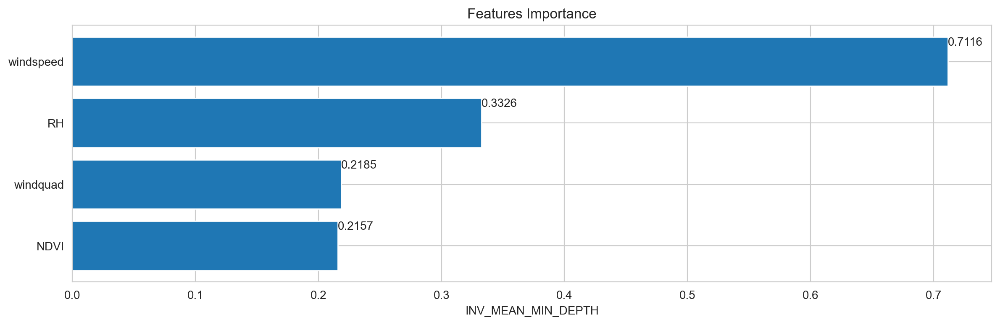

In [79]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

# Mean decrease in AUC of the class 1 vs the others.
variable_importance_metric = "INV_MEAN_MIN_DEPTH"
variable_importances = inspector.variable_importances()[variable_importance_metric]

# Extract the feature name and importance values.
#
# `variable_importances` is a list of <feature, importance> tuples.
feature_names = [vi[0].name for vi in variable_importances]
feature_importances = [vi[1] for vi in variable_importances]
# The feature are ordered in decreasing importance value.
feature_ranks = range(len(feature_names))

bar = plt.barh(feature_ranks, feature_importances, label=[str(x) for x in feature_ranks])
plt.yticks(feature_ranks, feature_names)
plt.gca().invert_yaxis()

# TODO: Replace with "plt.bar_label()" when available.
# Label each bar with values
for importance, patch in zip(feature_importances, bar.patches):
  plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{importance:.4f}", va="top")

plt.xlabel(variable_importance_metric)
plt.title("Features Importance")
plt.tight_layout()
plt.show()

In [80]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [81]:
# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier

# instantiate the classifier 
rf = RandomForestClassifier(random_state=42,n_estimators=500)

# fit the model
rf.fit(X_train, y_train)

# Predict the Test set results
y_pred = rf.predict(X_test)

# Check accuracy score 
from sklearn.metrics import accuracy_score

print('Acurácia do Modelo com  500 árvores de decisões : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Acurácia do Modelo com  500 árvores de decisões : 0.9632


In [82]:
# sensitivity = recall_score(True , y_pred)
# specificity = recall_score(np.logical_not(True) , np.logical_not(y_pred))	

In [83]:
#HABILITAR SOMENTE PARA ENCONTRAR OS MELHORES PARÂMETROS
from sklearn.model_selection import GridSearchCV
param_grid = { 
    'n_estimators': [200, 300, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}


In [84]:
confusion_matrix(y_test, y_pred)

array([[96,  0,  0],
       [ 5, 22,  0],
       [ 0,  0, 13]])

In [85]:
cohen_kappa_score(y_test, y_pred)

0.915391315167351

In [86]:
# CV_rfc = GridSearchCV(estimator=rf, param_grid=param_grid, cv= 5)

In [87]:
# CV_rfc.fit(X_train, y_train)

In [88]:
# print(CV_rfc.cv_results_)

In [89]:
# print(CV_rfc.best_params_)

In [90]:
# print(CV_rfc.best_estimator_)

In [91]:
rfc1=RandomForestClassifier(random_state=random_state, max_features='sqrt', n_estimators= 500, max_depth=8, criterion='gini')

In [92]:
rfc1.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, n_estimators=500, random_state=42)

In [93]:
pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: ",accuracy_score(y_test,pred))

Accuracy for Random Forest on CV data:  0.9558823529411765


In [94]:
def plot_search_results(grid):
    """
    Params: 
        grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_score_time']
    stds_train = results['std_score_time']

    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))

    params=grid.param_grid

    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none', sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')
    pram_preformace_in_best = {}
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        ax[i].set_xlabel(p.upper())

    plt.legend()
    plt.show()

In [95]:
# plot_search_results(CV_rfc)

In [96]:
import seaborn as sns
import pandas as pd

def plot_cv_results(cv_results, param_x, param_z, metric='rank_test_score'):
    """
    cv_results - cv_results_ attribute of a GridSearchCV instance (or similar)
    param_x - name of grid search parameter to plot on x axis
    param_z - name of grid search parameter to plot by line color
    """
    cv_results = pd.DataFrame(cv_results)
    col_x = 'param_' + param_x
    col_z = 'param_' + param_z
    fig, ax = plt.subplots(1, 1, figsize=(11, 8))
    sns.pointplot(x=col_x, y=metric, hue=col_z, data=cv_results, errorbar=('ci', 99), n_boot=64, ax=ax)
    ax.set_title("CV Grid Search Results")
    ax.set_xlabel(param_x)
    ax.set_ylabel(metric)
    ax.legend(title=param_z)
    return fig

In [97]:
# fig = plot_cv_results(CV_rfc.cv_results_, 'max_features', 'max_features')

In [98]:
# Calling Method 
# plot_grid_search(CV_rfc.cv_results_, ['300','500'], ['sqrt', 'log2'], 'N Estimators', 'Max Features')

In [99]:
from sklearn.model_selection import RandomizedSearchCV
rf_RandomGrid = RandomizedSearchCV(estimator = rf, param_distributions = param_grid, cv = 10, verbose=2, n_jobs = 4)

In [100]:
rf_RandomGrid.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestClassifier(n_estimators=500,
                                                    random_state=42),
                   n_jobs=4,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [4, 5, 6, 7, 8],
                                        'max_features': ['sqrt', 'log2'],
                                        'n_estimators': [200, 300, 500]},
                   verbose=2)

In [101]:
# print (f'Train Accuracy - : {CV_rfc.score(X_train,y_train):.3f}')
# print (f'Test Accuracy - : {CV_rfc.score(X_test,y_test):.3f}')

In [102]:
print (f'Train Accuracy - : {rf_RandomGrid.score(X_train,y_train):.3f}')
print (f'Test Accuracy - : {rf_RandomGrid.score(X_test,y_test):.3f}')

Train Accuracy - : 0.997
Test Accuracy - : 0.956


In [103]:
rf_RandomGrid.best_params_

{'n_estimators': 500,
 'max_features': 'log2',
 'max_depth': 8,
 'criterion': 'gini'}

In [104]:
rf_RandomGrid.best_estimator_

RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=500,
                       random_state=42)

In [105]:
esti = rf_RandomGrid.best_estimator_.n_estimators
mf = rf_RandomGrid.best_estimator_.max_features
md = rf_RandomGrid.best_estimator_.max_depth
crit = rf_RandomGrid.best_estimator_.criterion
esti,mf,md,crit

(500, 'log2', 8, 'gini')

In [106]:
# instantiate the classifier with n_estimators = 100
# rfc_100 = RandomForestClassifier(n_estimators=300, random_state=42)
# instantiate the classifier with n_estimators = 100
rfc_100 = RandomForestClassifier(n_estimators=esti, max_depth=md, random_state=42, max_features=mf, criterion=crit)
# fit the model to the training set
# fit the model to the training set
rfc_100.fit(X_train, y_train)

# Predict on the test set results
y_pred_100 = rfc_100.predict(X_test)

# Check accuracy score 
print('Model accuracy score with 100 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred_100)))

Model accuracy score with 100 decision-trees : 0.9559


In [107]:
pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: {0:0.4f} ".format(accuracy_score(y_test,pred)))

Accuracy for Random Forest on CV data: 0.9559 


In [108]:
# view the feature scores
feature_scores = pd.Series(rfc1.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

windspeed    0.542104
RH           0.317515
windquad     0.081586
NDVI         0.058796
dtype: float64

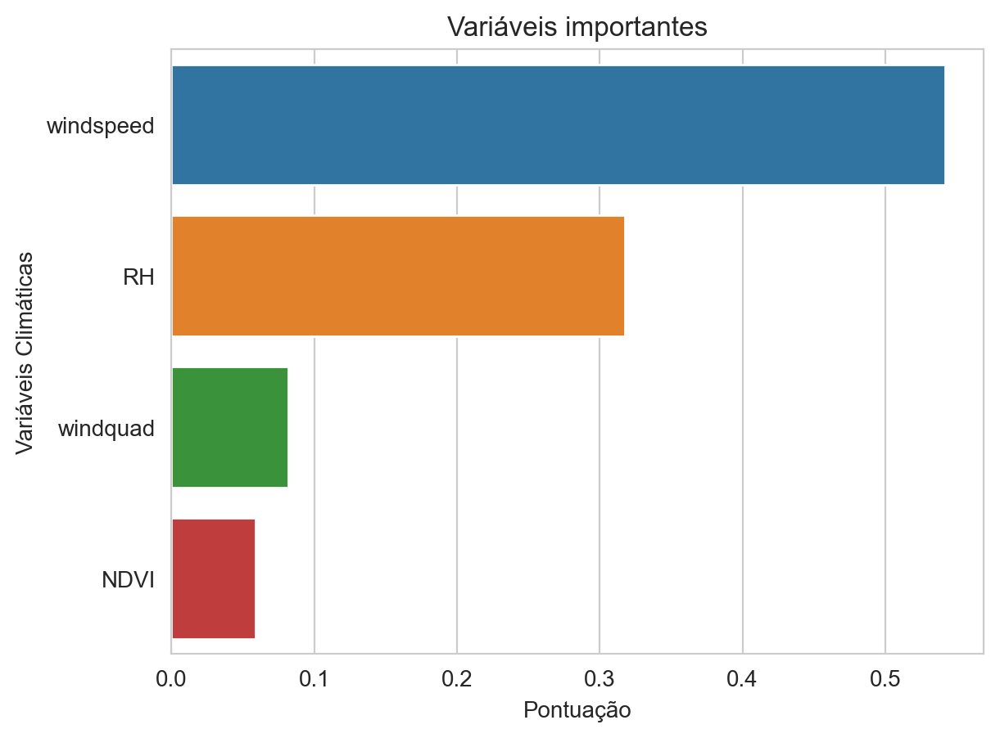

In [109]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# Creating a seaborn bar plot
sns.barplot(x=feature_scores, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Pontuação')
plt.ylabel('Variáveis Climáticas')
# Add title to the graph
plt.title("Variáveis importantes")

# Visualize the graph
plt.show()

In [110]:
# split data into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [111]:
# instantiate the classifier with n_estimators = 100
clf = RandomForestClassifier(random_state=random_state)

# fit the model to the training set
clf.fit(X_train, y_train)

# Predict on the test set results
y_pred = clf.predict(X_test)

# Check accuracy score 
print('Model accuracy score with doors variable removed : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with doors variable removed : 0.9632


In [112]:
cohen_kappa_score(y_test, y_pred)

0.915391315167351

In [113]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        96
           1       1.00      0.81      0.90        27
           2       1.00      1.00      1.00        13

    accuracy                           0.96       136
   macro avg       0.98      0.94      0.96       136
weighted avg       0.97      0.96      0.96       136



In [114]:
from sklearn.ensemble import RandomForestClassifier # from xgboost import XGBClassifier
model = RandomForestClassifier() # XGBClassifier()
model.fit(X, y)
pd.DataFrame({'Variable':X.columns,'Importance':model.feature_importances_}).sort_values('Importance', ascending=False)

,Variable,Importance
0,windspeed,0.500263
2,RH,0.341289
1,windquad,0.090361
3,NDVI,0.068087


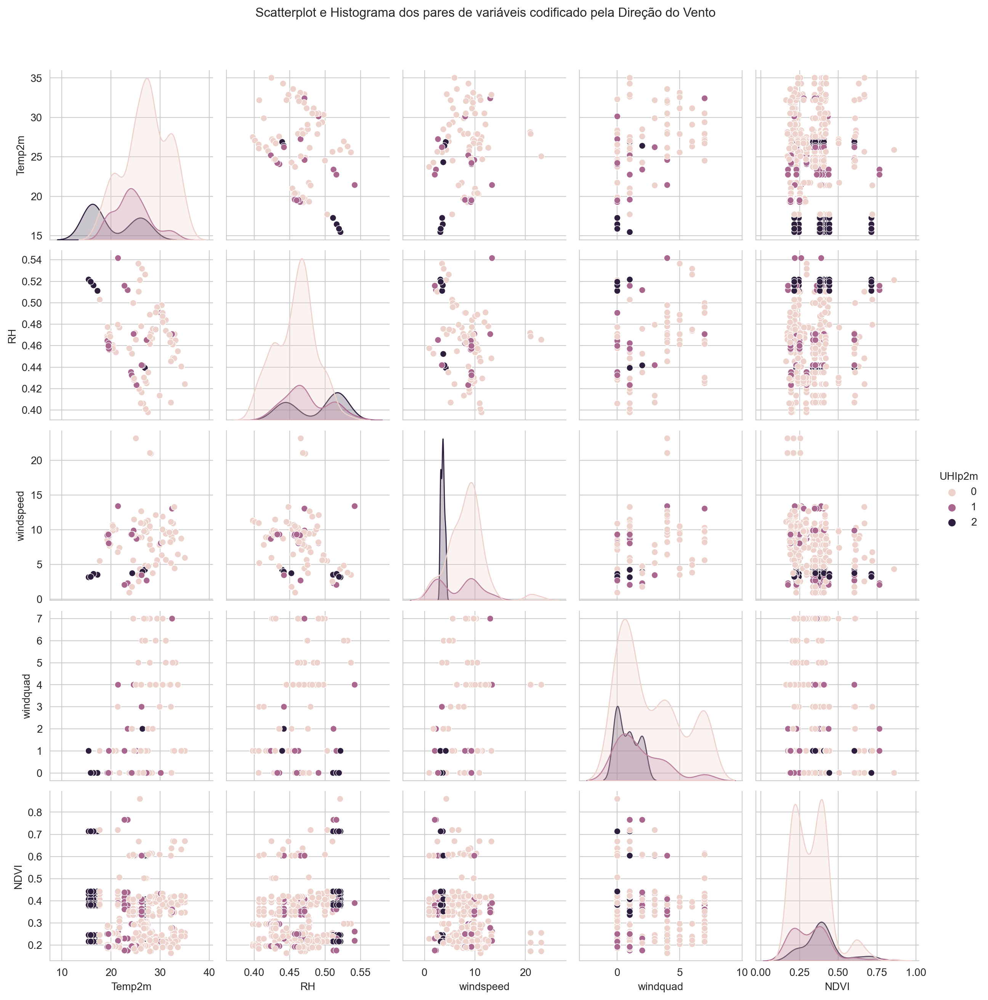

In [115]:
g = sns.pairplot(df[['UHIp2m','Temp2m','RH','windspeed','windquad','NDVI']], hue='UHIp2m')
g.fig.suptitle("Scatterplot e Histograma dos pares de variáveis codificado pela Direção do Vento",y=1.05);

In [116]:
X = df[feat] #drop(['windquad','windquad_cat','dewPoint','surface_pressure','skinTemp','UTFVI','windpower' ,axis=1)
y = df['UHIp2m']
X,y

(      windspeed  windquad        RH      NDVI
 53     7.387343         0  0.476950  0.318940
 60     9.133717         0  0.468182  0.419299
 109    2.281553         2  0.511810  0.431238
 110    2.049673         1  0.515845  0.431238
 135    7.084406         0  0.466726  0.388546
 ...         ...       ...       ...       ...
 5263   9.307008         1  0.457110  0.191585
 5264   9.309723         0  0.459806  0.191585
 5272   8.214487         4  0.463012  0.188724
 5275  11.880875         4  0.481825  0.188724
 5276  12.107019         4  0.490986  0.188724
 
 [451 rows x 4 columns],
 53      0
 60      0
 109     1
 110     1
 135     0
        ..
 5263    1
 5264    1
 5272    0
 5275    0
 5276    0
 Name: UHIp2m, Length: 451, dtype: int64)

In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# model = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='sqrt', random_state=random_state, criterion='gini', oob_score=True, bootstrap=True)
model = RandomForestClassifier(n_estimators=esti, max_depth=int(md), max_features='sqrt', random_state=random_state, criterion='gini', oob_score=True, bootstrap=True)
# Fit RandomForestClassifier
rfc = model.fit(X_train, y_train)
# Predict the test set labels
# y_pred = rfc.predict(X_test)
print('o R² do treino é: %.2f'% rfc.score(X_train, y_train))

o R² do treino é: 1.00


In [362]:
# from sklearn.base import clone
# scores = []
# for i in range(50):
#     this_rf = clone(rfc)
#     this_rf.estimators_ = rfc.estimators_[:i]
#     this_rf.n_classes_ = [rfc.n_classes_]
#     this_rf.n_outputs_ = rfc.n_outputs_
#     this_rf._set_oob_score_and_attributes(X, y.shape(-1, 1))
#     scores.append(this_rf.oob_score_)

[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=300; total time=   0.3s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=300; total time=   0.4s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=300; total time=   0.3s
[CV] END criterion=entropy, max_depth=8, max_features=log2, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=8, max_features=log2, n_estimators=200; total time=   0.2s
[CV] END criterion=gini, max_depth=6, max_features=log2, n_estimators=500; total time=   0.5s
[CV] END criterion=gini, max_depth=6, max_features=log2, n_estimators=500; total time=   0.5s
[CV] END criterion=gini, max_depth=6, max_features=log2, n_estimators=500; total time=   0.5s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200; total time=   0.2s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=300; total time=   0.4s
[CV] END criterion=entropy, max_depth=4, max_fea

In [119]:
#prediction of the training data
ytrain_pred = rfc.predict(X_train)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.00
Mean Squared Error: 0.00
Root Mean Squared Error: 0.06
Explained Variance Score: 0.99


In [120]:
#Prediction on the testing data
ytest_pred = rfc.predict(X_test)
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred))
print('O R² do Teste é: %.2f'% rfc.score(X_test, y_test))

O R² do Teste é: 0.90
O R² do Teste é: 0.96


In [121]:
# print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, y_pred))
# print('Mean Squared Error: %.2f'% mean_squared_error(y_test, y_pred))
# print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, y_pred)))
# print('Explained Variance Score: %.2f'% explained_variance_score(y_test, y_pred))

In [122]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.04
Mean Squared Error: 0.04
Root Mean Squared Error: 0.21
Explained Variance Score: 0.90


In [123]:
print('Score: ', rfc.score(X_train, y_train))  
# Obtain the OOB error
oob_error = 1 - rfc.oob_score_
  
# Print the OOB error
print(f'OOB error: {rfc.oob_score_:.3f}')

# from sklearn import metrics
# pred_train = np.argmax(rfc.oob_decision_function_,axis=1)
# metrics.roc_auc_score(y_train, pred_train)

Score:  0.9968253968253968
OOB error: 0.956


In [124]:
from sklearn.metrics import r2_score
def print_rf_scores(fitted_model):
    """Generates RMSE and R^2 scores from fitted Random Forest model."""

    yhat_train = fitted_model.predict(X_train)
    R2_train = fitted_model.score(X_train, y_train)
    yhat_valid = fitted_model.predict(X_valid)
    R2_valid = fitted_model.score(X_valid, y_valid)

    scores = {
        "RMSE on train:": rmse(y_train, yhat_train),
        "R^2 on train:": R2_train,
        "RMSE on valid:": rmse(y_valid, yhat_valid),
        "R^2 on valid:": R2_valid,
    }
    if hasattr(fitted_model, "oob_score_"):
        scores["OOB R^2:"] = fitted_model.oob_score_

    for score_name, score_value in scores.items():
        print(score_name, round(score_value, 3))


In [125]:
# print_rf_scores(model)

In [126]:
# n_estimators = 500

# for i in range(1, n_estimators + 1):
#     model.set_params(n_estimators=i)
#     model.fit(X, y)
#     print (i, model.oob_score_)
# plot(model.oob_score_)

In [127]:
# # Plotting the observed and predicted data
# import matplotlib.pyplot as plt
# # Setting the boundaries and parameters
# plt.rcParams['figure.figsize'] = (40,15)
# x_ax = range(len(X_test))
# # Plotting
# plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
# plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
# plt.ylabel('Fenômeno ICU', fontsize=15)
# plt.xlabel('Testando Dados Amostrais',fontsize=15)
# plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =
# False,fontsize=15)
# # plt.show()
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-WINDQUAD+NDVIxall-MD"+str(md)+"-"+ano+".png")

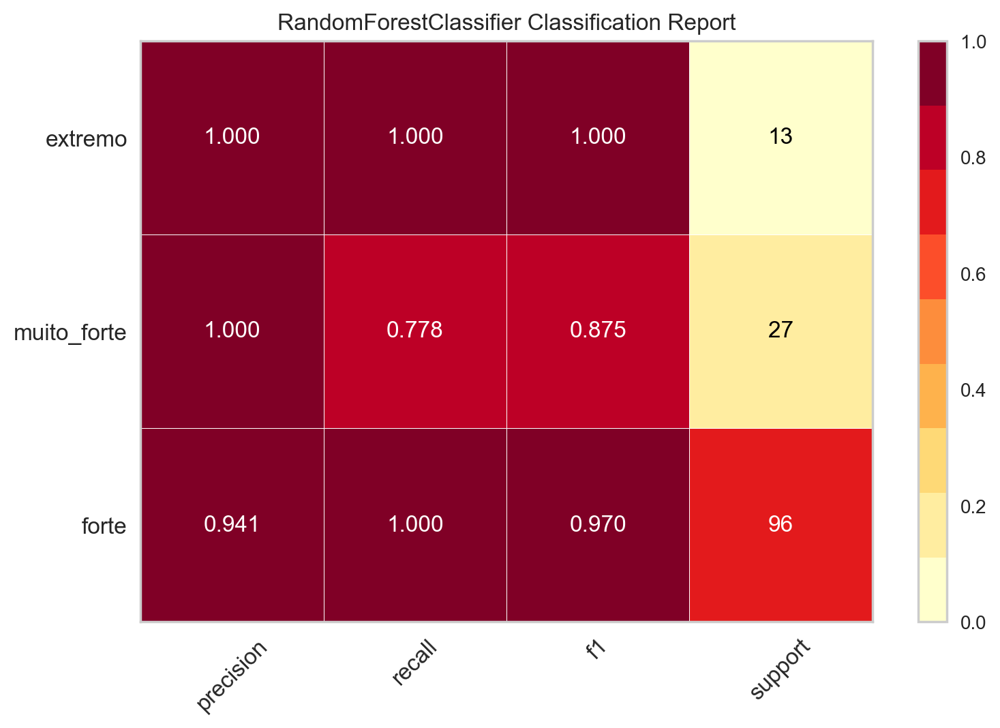

<AxesSubplot: title={'center': 'RandomForestClassifier Classification Report'}>

In [128]:
#Plotting the classification errors and residuals
# Setting the boundaries and parameters
# plt.rcParams['figure.figsize'] = (7,4)
from yellowbrick.classifier import ClassificationReport
visualizer = ClassificationReport(rfc,classes=classes, support=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

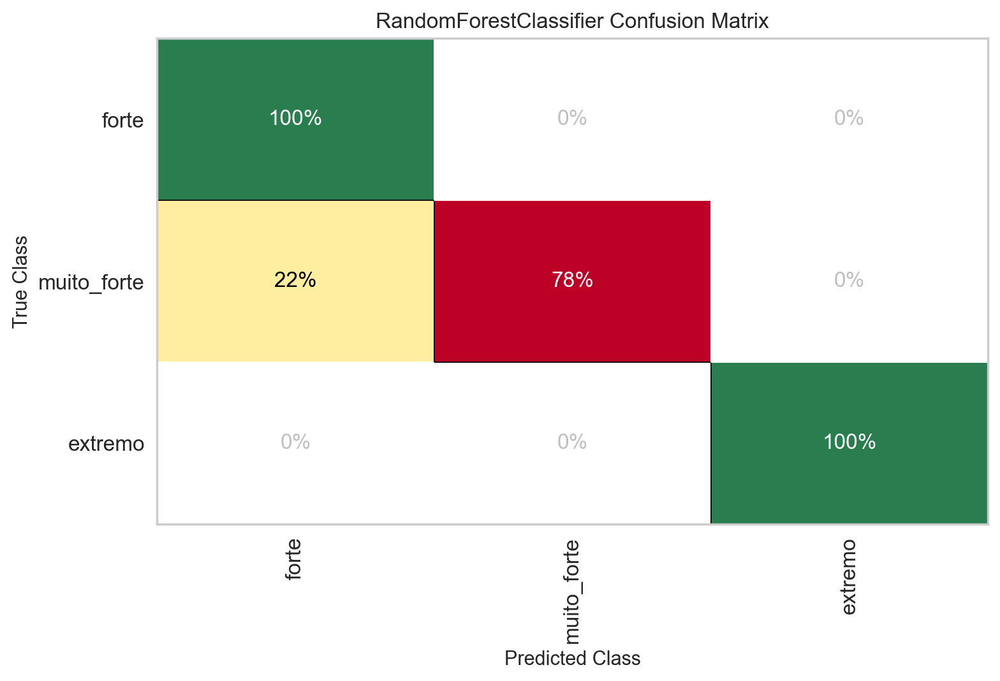

In [129]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix( rfc, 
                     classes=classes, 
                     percent=True
                     #label_encoder={0: 'Forte', 1: 'Muito Forte', 2: 'Extremo'}
)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

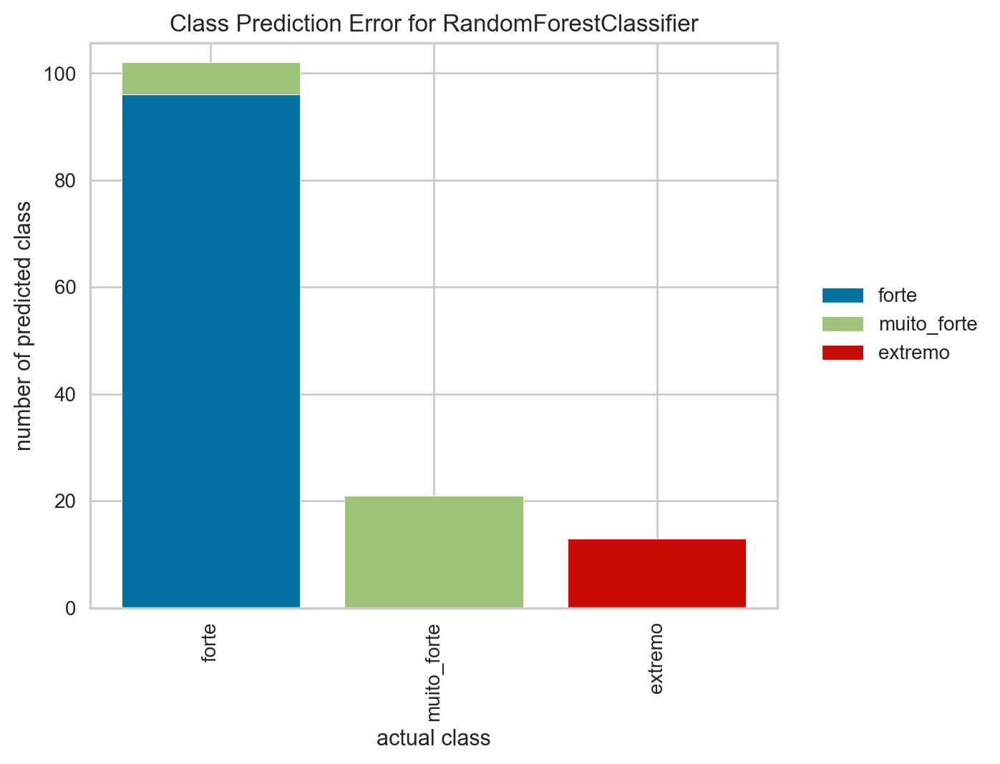

In [130]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(rfc, classes=classes)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

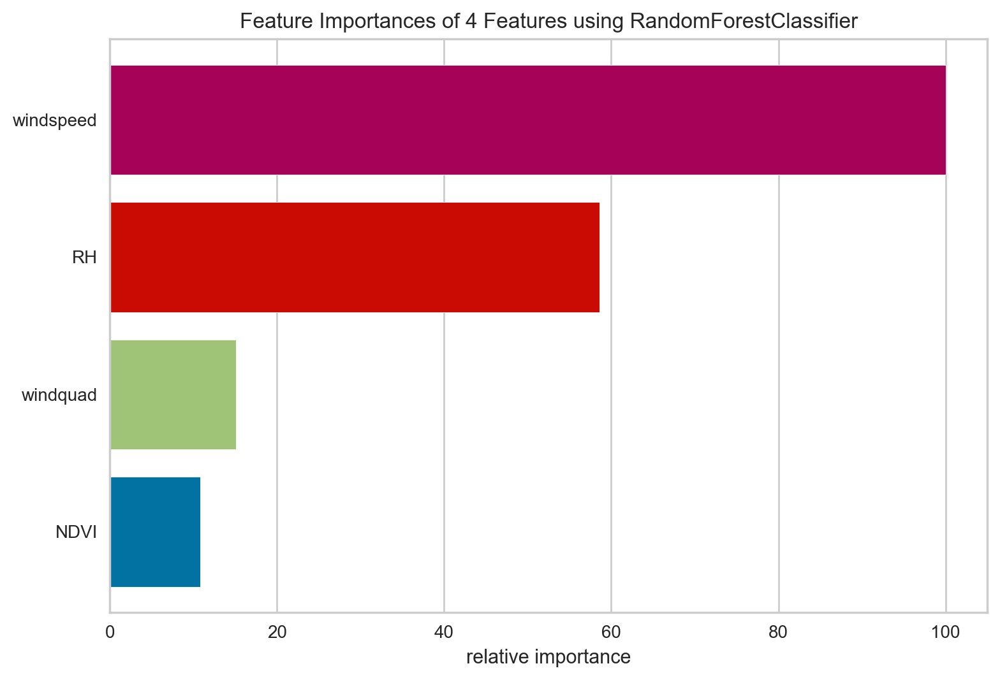

In [131]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.ensemble import RandomForestClassifier
visualizer = FeatureImportances(rfc)
visualizer.fit(X_train, y_train)
visualizer.show();

In [132]:
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix : \n', cm)
#####from confusion matrix calculate accuracy
total1=sum(sum(cm))
accuracy1=(cm[0,0]+cm[1,1])/total1
print ('Accuracy : ', accuracy1)

sensitivity1 = cm[0,0]/(cm[0,0]+cm[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = cm[1,1]/(cm[1,0]+cm[1,1])
print('Specificity : ', specificity1)

Confusion Matrix : 
 [[96  0  0]
 [ 5 22  0]
 [ 0  0 13]]
Accuracy :  0.8676470588235294
Sensitivity :  1.0
Specificity :  0.8148148148148148


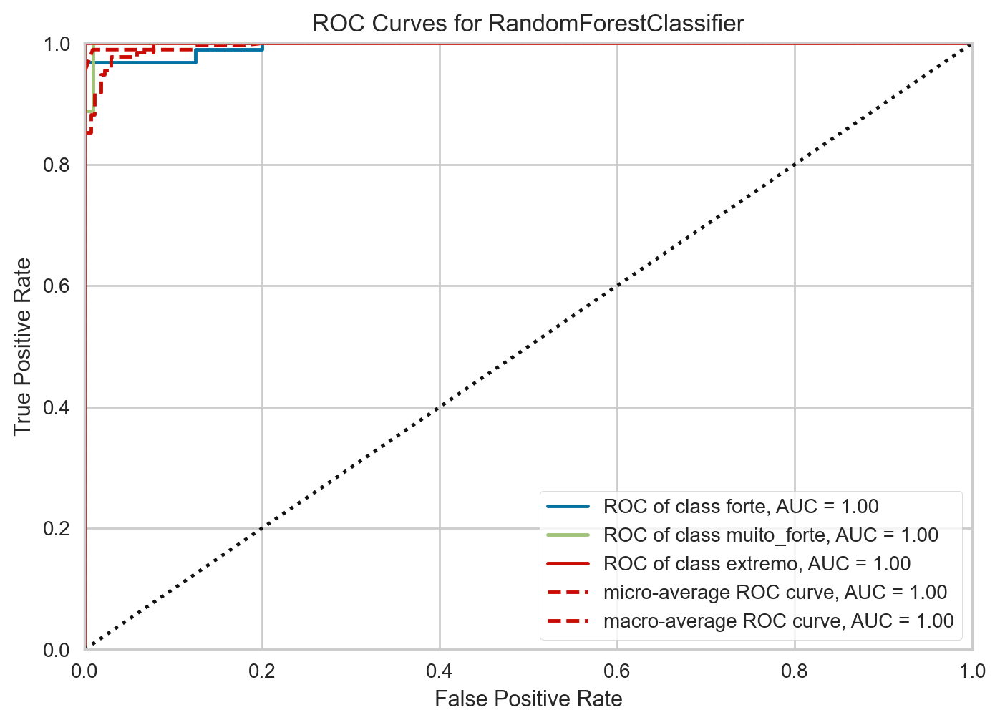

In [133]:
from yellowbrick.classifier import ROCAUC
# from sklearn.linear_model import LogisticRegression
# X, y = load_spam()
# X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
# model = LogisticRegression(max_iter=10000)
# model.fit(X_train, y_train)
visualizer = ROCAUC(rfc, classes = classes) #['Segundo', 'Oitavo', 'Primeiro', 'Sétimo', 'Terceiro', 'Quarto', 'Quinto', 'Sexto'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

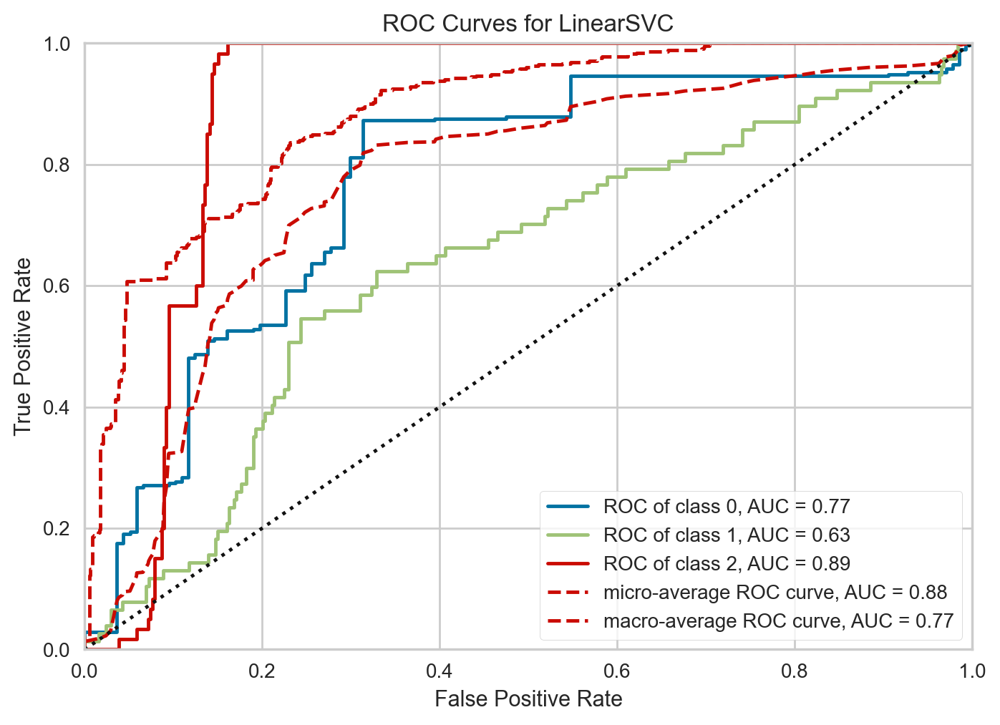

<AxesSubplot: title={'center': 'ROC Curves for LinearSVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [134]:
from sklearn.svm import LinearSVC
from yellowbrick.classifier import ROCAUC
model = LinearSVC()
visualizer = ROCAUC(model)
visualizer.fit(X,y)
visualizer.score(X,y)
visualizer.show()

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        96
           1       1.00      0.81      0.90        27
           2       1.00      1.00      1.00        13

    accuracy                           0.96       136
   macro avg       0.98      0.94      0.96       136
weighted avg       0.97      0.96      0.96       136



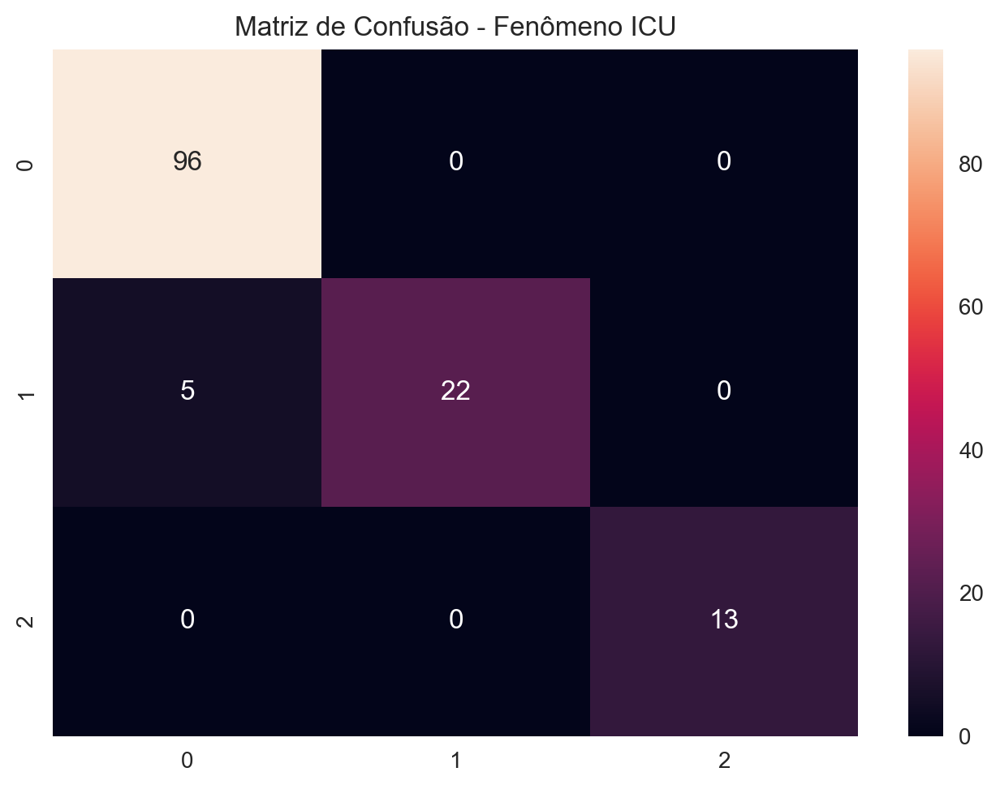

In [135]:
from sklearn.metrics import classification_report, confusion_matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d').set_title('Matriz de Confusão - Fenômeno ICU')
print(classification_report(y_test,y_pred))

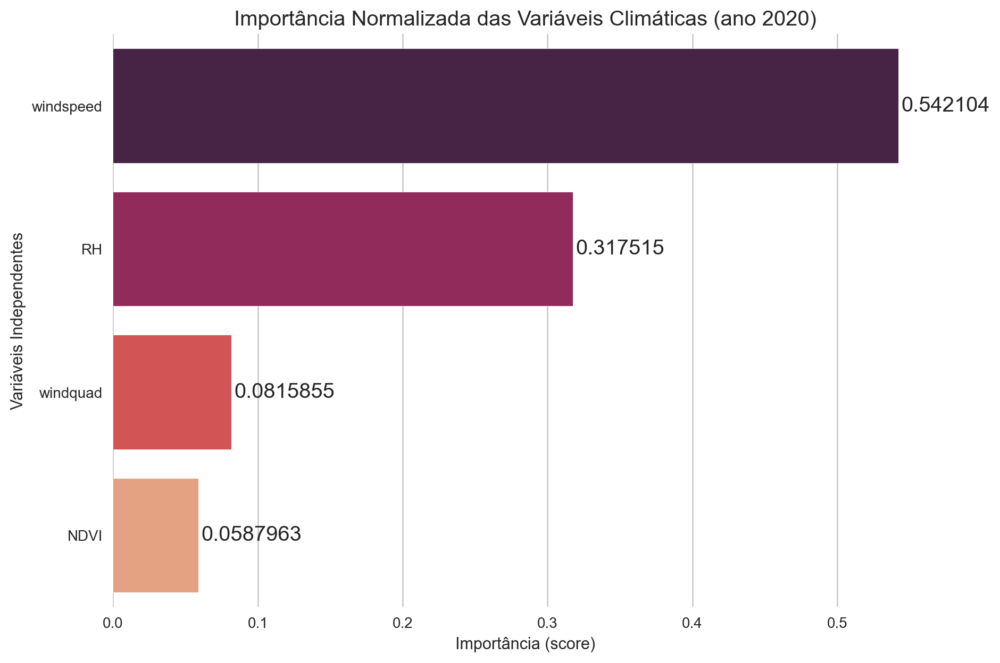

In [136]:
# # Organizing feature names and importances in a DataFrame
# features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# # Sorting data from highest to lowest
# features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# # Barplot of the result without borders and axis lines
# g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
# sns.despine(bottom = True, left = True)
# g.set_title('Importância das Variáveis Climáticas')
# g.set(xlabel=None)
# g.set(ylabel=None)
# g.set(xticks=[])
# for value in g.containers:
#     g.bar_label(value, padding=2)
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importance_Features-"+ano+".png")
plt.rcParams['figure.figsize'] = (10,7)
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
sns.set(font_scale=1.2)
g.set_title('Importância Normalizada das Variáveis Climáticas (ano '+ano+')')
g.set(xlabel='Importância (score)')
g.set(ylabel='Variáveis Independentes')
# g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importance_Features-NDVI-"+ano+".png")

In [137]:
rfc_ = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='sqrt', random_state=random_state, criterion='gini', bootstrap=True, oob_score=True)

rfc_.fit(X_train, y_train)
y_pred = rfc_.predict(X_test)

In [138]:
# Predict class labels on training data
pred_labels_tr = rfc_.predict(X_train)
# Predict class labels on a test data
pred_labels_te = rfc_.predict(X_test)

In [139]:
print('*************** Evaluation on Test Data ***************')
score_te = rfc_.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))

*************** Evaluation on Test Data ***************
Accuracy Score:  0.9558823529411765
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        96
           1       1.00      0.78      0.88        27
           2       1.00      1.00      1.00        13

    accuracy                           0.96       136
   macro avg       0.98      0.93      0.95       136
weighted avg       0.96      0.96      0.95       136



In [140]:
print('*************** Evaluation on Train Data ***************')
score_tr = rfc_.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))

*************** Evaluation on Train Data ***************
Accuracy Score:  0.9968253968253968
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       218
           1       1.00      0.98      0.99        50
           2       1.00      1.00      1.00        47

    accuracy                           1.00       315
   macro avg       1.00      0.99      1.00       315
weighted avg       1.00      1.00      1.00       315



In [141]:
print(classification_report(y_test, pred_labels_te))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        96
           1       1.00      0.78      0.88        27
           2       1.00      1.00      1.00        13

    accuracy                           0.96       136
   macro avg       0.98      0.93      0.95       136
weighted avg       0.96      0.96      0.95       136



In [142]:
print(classification_report(y_train, pred_labels_tr))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       218
           1       1.00      0.98      0.99        50
           2       1.00      1.00      1.00        47

    accuracy                           1.00       315
   macro avg       1.00      0.99      1.00       315
weighted avg       1.00      1.00      1.00       315



In [143]:
regc = rfc_.fit(X_train, y_train)
print('o R² do treino é: %.2f'% regc.score(X_train, y_train))

o R² do treino é: 1.00


In [144]:
regc = rfc_.fit(X_test, y_test)
print('o R² do teste é: %.2f'% regc.score(X_test, y_test))

o R² do teste é: 1.00


              precision    recall  f1-score   support

           0       0.94      1.00      0.97        96
           1       1.00      0.78      0.88        27
           2       1.00      1.00      1.00        13

    accuracy                           0.96       136
   macro avg       0.98      0.93      0.95       136
weighted avg       0.96      0.96      0.95       136



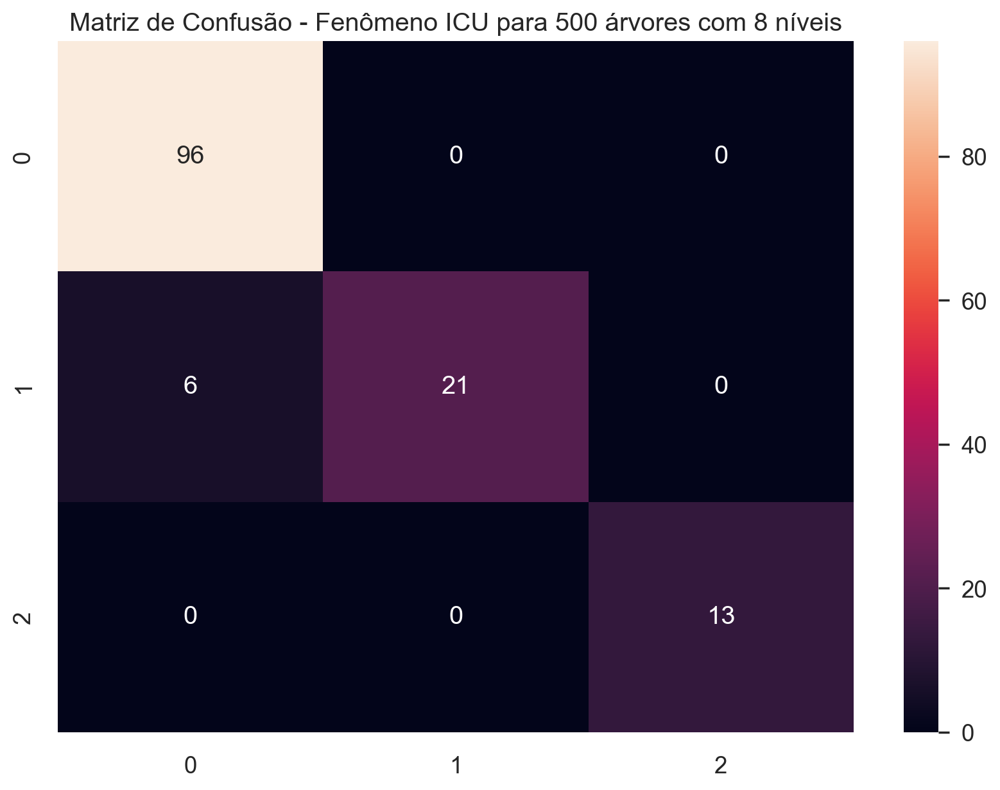

In [145]:
cm_ = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_, annot=True, fmt='d').set_title('Matriz de Confusão - Fenômeno ICU para 500 árvores com 8 níveis')
print(classification_report(y_test,y_pred))

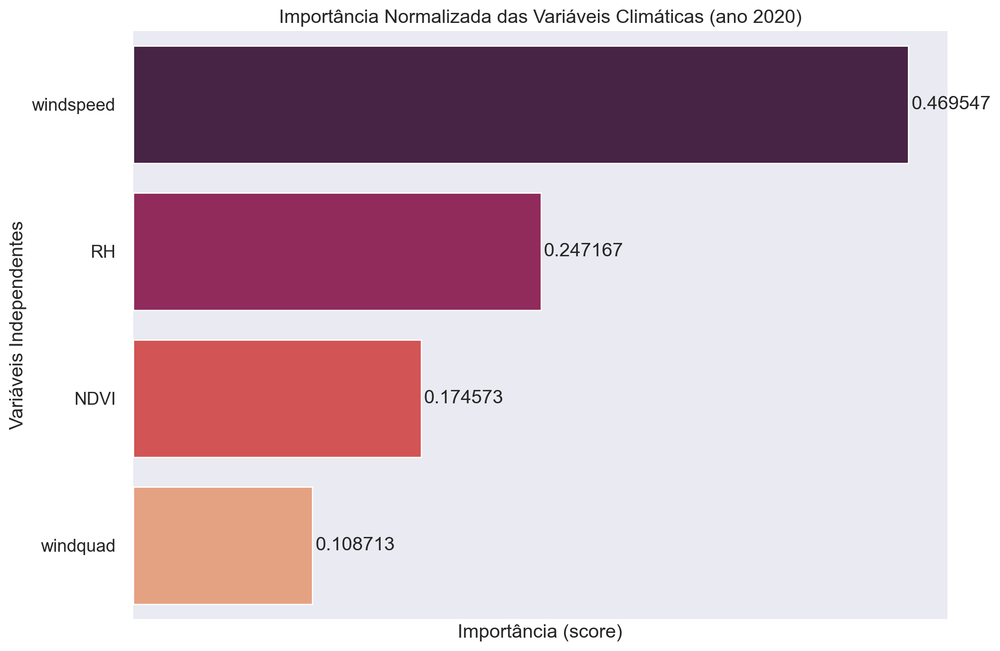

In [146]:
plt.rcParams['figure.figsize'] = (11,8)
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc_.feature_names_in_, 'importances': rfc_.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
sns.set(font_scale=1.2)
g.set_title('Importância Normalizada das Variáveis Climáticas (ano '+ano+')')
g.set(xlabel='Importância (score)')
g.set(ylabel='Variáveis Independentes')
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importances_Features-NDVI-RFC_"+ano+".png")

In [147]:
y = df[target]
X = df[feat] #.drop(['UHIn','UTFVI2m','dewPoint','surface_pressure','windquad_cat','skinTemp','UTFVI','windpower'], axis=1)
y

53      0
60      0
109     1
110     1
135     0
       ..
5263    1
5264    1
5272    0
5275    0
5276    0
Name: UHIp2m, Length: 451, dtype: int64

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [149]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=500, 
                              max_depth=int(md), 
                              random_state=random_state,
                              max_features='log2',
                              criterion='poisson')
# rfr.fit(X_train, y_train)
# y_pred = rfr.predict(X_test)

In [150]:
reg = model.fit(X_train, y_train)
print('o R² do treino é: %.2f'% reg.score(X_train, y_train))

o R² do treino é: 0.92


In [151]:
ytrain_pred = reg.predict(X_train)
y_pred = reg.predict(X_test)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.13
Mean Squared Error: 0.05
Root Mean Squared Error: 0.21
Explained Variance Score: 0.92


In [152]:
#Prediction on the testing data
ytest_pred = reg.predict(X_test)
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred))
print('O R² do Teste é: %.2f'% reg.score(X_test, y_test))

O R² do Teste é: 0.78
O R² do Teste é: 0.78


In [153]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test,ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test,ytest_pred))

Mean Absolute Error: 0.20
Mean Squared Error: 0.10
Root Mean Squared Error: 0.31
Explained Variance Score: 0.78


In [154]:
# # Plotting the observed and predicted data
# import matplotlib.pyplot as plt
# # Setting the boundaries and parameters
# plt.rcParams['figure.figsize'] = (40,20)
# x_ax = range(len(X_test))
# # Plotting
# plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
# plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
# plt.ylabel('Fenômeno ICU',fontsize=18)
# plt.xlabel('Testando Dados Amostrais',fontsize=18)
# plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon = False,fontsize=18)
# plt.show()

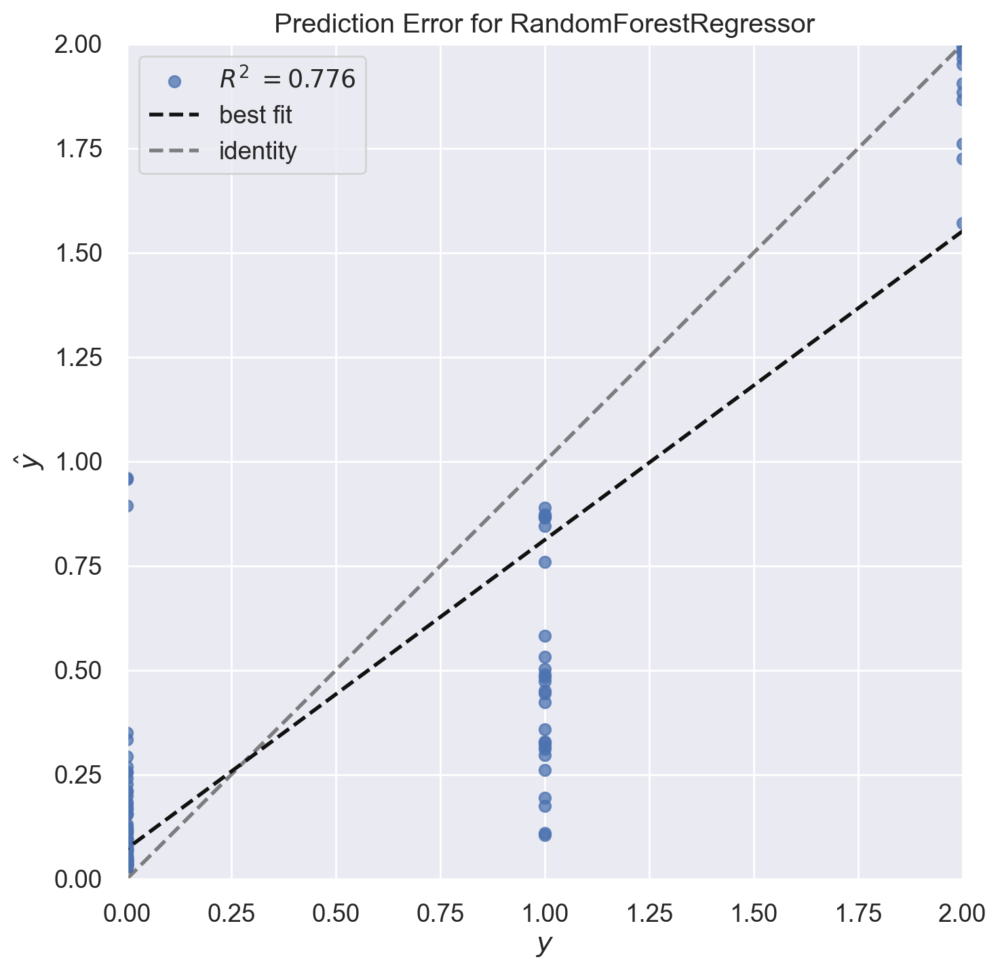

<AxesSubplot: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [155]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,8)
#Plotting the prediction errors and residuals
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

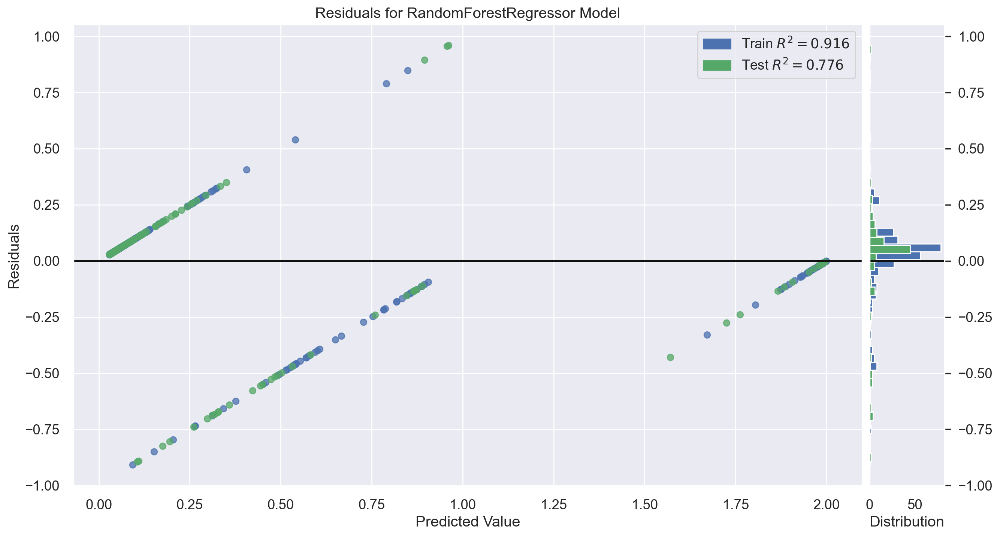

<AxesSubplot: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [156]:
# Plotting the residuals
plt.rcParams['figure.figsize'] = (15,8)
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [157]:
# the k-fold Cross-Validation (CV)
from sklearn.model_selection import cross_val_score
seed = 42
# training model CV
score_train = cross_val_score(reg, X_train, y_train, scoring ='neg_mean_squared_error', cv = 10)
score_train

array([-0.12162475, -0.05444266, -0.13391642, -0.05689834, -0.09573625,
       -0.04446912, -0.05365544, -0.09032126, -0.03419169, -0.10140902])

In [158]:
# the absolute mean score
print(np.mean(score_train))
# the absolute mean score
from numpy import absolute
print(absolute(np.mean(score_train)))

-0.07866649669041424
0.07866649669041424


In [159]:
# the testing model CV
score_test = cross_val_score(reg, X_test, y_test, scoring ='neg_mean_squared_error', cv = 10)
score_test
print(absolute(np.mean(score_test)))

0.15523987086050692


In [160]:
# Random Forest Features Ranking
from sklearn.pipeline import Pipeline
f_list = list(X.columns)
f_importance = pd.Series(reg.feature_importances_, index = f_list).sort_values(ascending = False)
print(f_importance)

windspeed    0.608677
RH           0.273064
NDVI         0.061872
windquad     0.056386
dtype: float64


In [161]:
# from sklearn import tree
# features = X.columns
# # Obtain just the first tree
# first_tree = reg.estimators_[0]
# plt.figure(figsize=(20,12))
# tree.plot_tree(first_tree,
#                feature_names=features,
#                fontsize=8,
#                filled=True,
#                rounded=True);

In [162]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.13
Mean Squared Error: 0.05
Root Mean Squared Error: 0.21
Explained Variance Score: 0.92


In [163]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.20
Mean Squared Error: 0.10
Root Mean Squared Error: 0.31
Explained Variance Score: 0.78


In [164]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.196087862841232
Mean Squared Error: 0.09603826915351377
Root Mean Squared Error: 0.3099004181241351


In [165]:
print(df[feat+[target]].describe().round(2).T)

           count  mean   std   min   25%   50%   75%    max
windspeed  451.0  7.41  3.79  0.93  3.95  7.82  9.72  23.16
windquad   451.0  2.30  2.35  0.00  0.00  1.00  4.00   7.00
RH         451.0  0.47  0.03  0.40  0.44  0.46  0.48   0.54
NDVI       451.0  0.34  0.12  0.16  0.23  0.35  0.40   0.86
UHIp2m     451.0  0.44  0.72  0.00  0.00  0.00  1.00   2.00


In [166]:
# Data treatment
# ==============================================================================
import scipy.stats as stats
# Visual
# ==============================================================================
import plotly.express as px
import pylab
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
# Machine Learnig
# ==============================================================================
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
# Metrics
# ==============================================================================
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn import metrics
from sklearn.metrics import confusion_matrix
# Warning Config
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

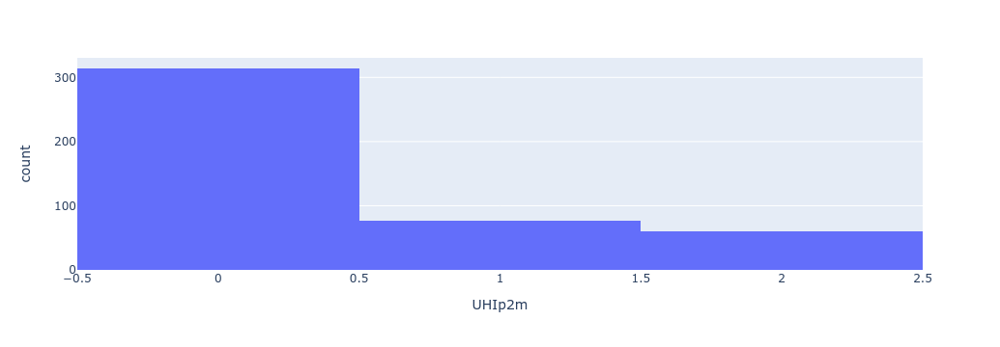

In [167]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,12)
fig = px.histogram(y, x ="UHIp2m")
fig.show()

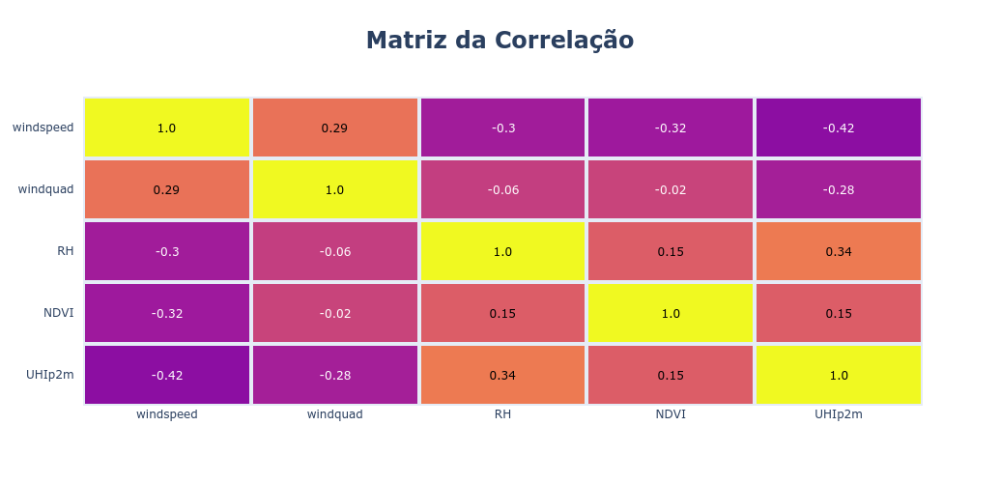

In [168]:
corr = df[feat+[target]].corr()
fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),
    xgap=4, ygap=4,
    zmin=-1, zmax=1, 
    # colorscale='RdYlGn',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Matriz da Correlação<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=700, height=500,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',
                  paper_bgcolor=None,
)
fig.show()

In [169]:
Y = df[target]
X = df[feat]
Model = sm.OLS(Y, sm.add_constant(X))
Results = Model.fit()
print(Results.summary())

                            OLS Regression Results                            
Dep. Variable:                 UHIp2m   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.55e-27
Time:                        10:53:23   Log-Likelihood:                -422.49
No. Observations:                 451   AIC:                             855.0
Df Residuals:                     446   BIC:                             875.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5260      0.479     -3.189      0.0

In [170]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

coefficient of determination: 0.25549448262281127


In [171]:
model = LinearRegression().fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model.intercept_}")
print(f"slope: {model.coef_}")

coefficient of determination: 0.25549448262281127
intercept: -1.525979163258031
slope: [-0.05499514 -0.05595811  5.30692867  0.09259495]


In [172]:
import statsmodels.api as sm
x, y = np.array(df[feat]), np.array(df[target])
x = sm.add_constant(x)
model = sm.OLS(y, x)
results = model.fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.55e-27
Time:                        10:53:23   Log-Likelihood:                -422.49
No. Observations:                 451   AIC:                             855.0
Df Residuals:                     446   BIC:                             875.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5260      0.479     -3.189      0.0

In [173]:
x = df[feat]
y = df[target]
x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions = model.predict(x)
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                 UHIp2m   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.55e-27
Time:                        10:53:23   Log-Likelihood:                -422.49
No. Observations:                 451   AIC:                             855.0
Df Residuals:                     446   BIC:                             875.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5260      0.479     -3.189      0.0

In [174]:
X = df[feat+[target]].iloc[:, 1].values.reshape(-1, 1) # values converts it into a numpy array
Y = df[feat+[target]].iloc[:, 2].values.reshape(-1, 1) # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression() # create object for the class
linear_regressor.fit(X, Y) # perform linear regression
Y_pred = linear_regressor.predict(X) # make predictions

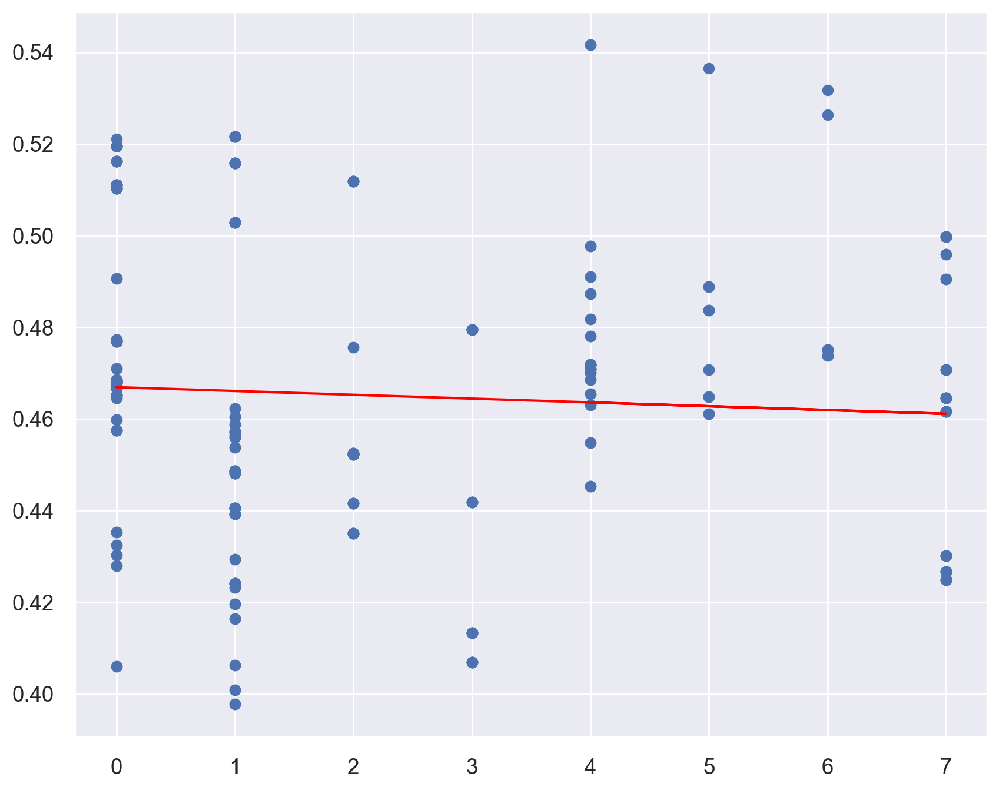

In [175]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (10,8)
plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.show()

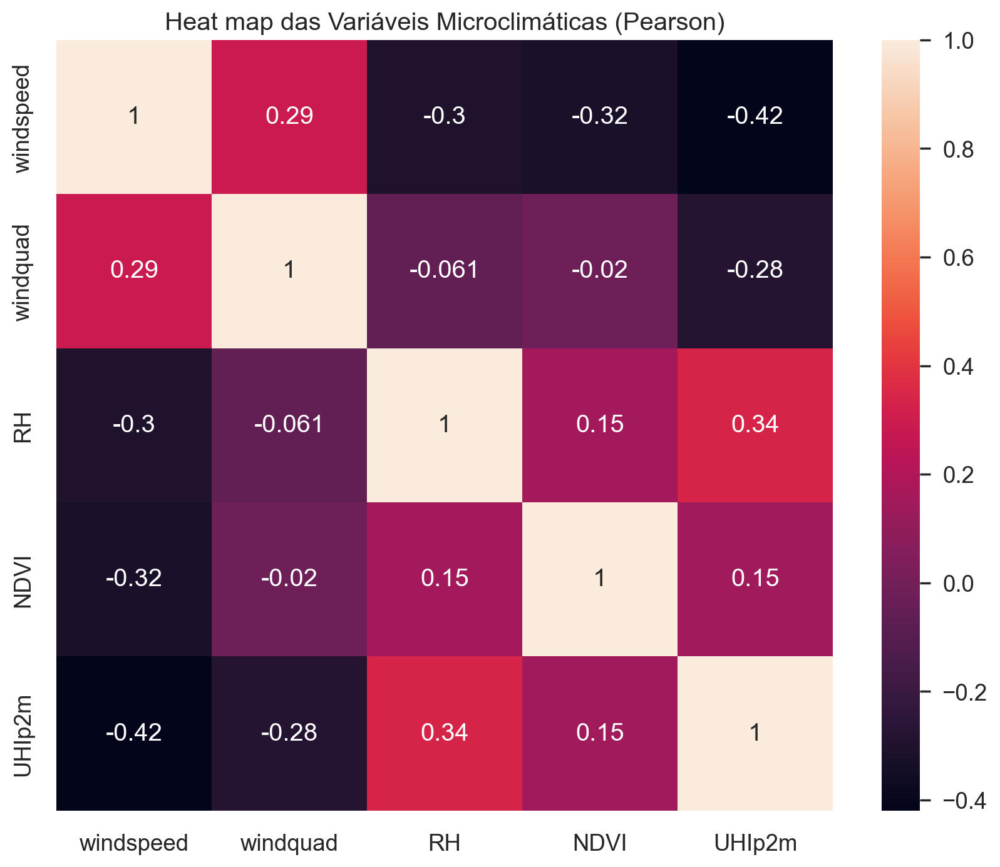

In [176]:
correlations = df[feat + [target]].corr()
# annot=True displays the correlation values
sns.heatmap(correlations, annot=True).set(title='Heat map das Variáveis Microclimáticas (Pearson)');

In [177]:
y = df[target]
X = df[feat]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [178]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)
print(regressor.intercept_)
print(regressor.coef_)

-1.9816331928873272
[-0.05227987 -0.05901172  6.13318296  0.26075424]


In [179]:
feature_names = X.columns
model_coefficients = regressor.coef_
coefficients_df = pd.DataFrame(data = model_coefficients, 
                               index = feature_names,
                               columns = ['Coefficient value'])
print(coefficients_df)

           Coefficient value
windspeed          -0.052280
windquad           -0.059012
RH                  6.133183
NDVI                0.260754


In [180]:
y_pred = regressor.predict(X_test)
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results)

      Actual  Predicted
3588       0   0.908575
561        1   0.252047
4063       0   0.111745
4730       0   0.059818
1822       0   0.380834
...      ...        ...
371        1   0.473971
1803       2   0.538712
2826       2   0.490055
343        0  -0.177699
138        0   0.000446

[136 rows x 2 columns]


In [181]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

Mean absolute error: 0.49
Mean squared error: 0.36
Root mean squared error: 0.60


In [182]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)
print(regressor.score(X_test, y_test))
print(regressor.score(X_train, y_train))

R²: 0.1560992769880345
0.15609927698803383
0.2843612587477222


In [183]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
tree_classifier = DecisionTreeClassifier(max_depth=int(md), random_state=random_state, max_features='auto', criterion='entropy')
tree_classifier.fit(df[features].values, df[target].values)

DecisionTreeClassifier(criterion='entropy', max_depth=8, max_features='auto',
                       random_state=42)

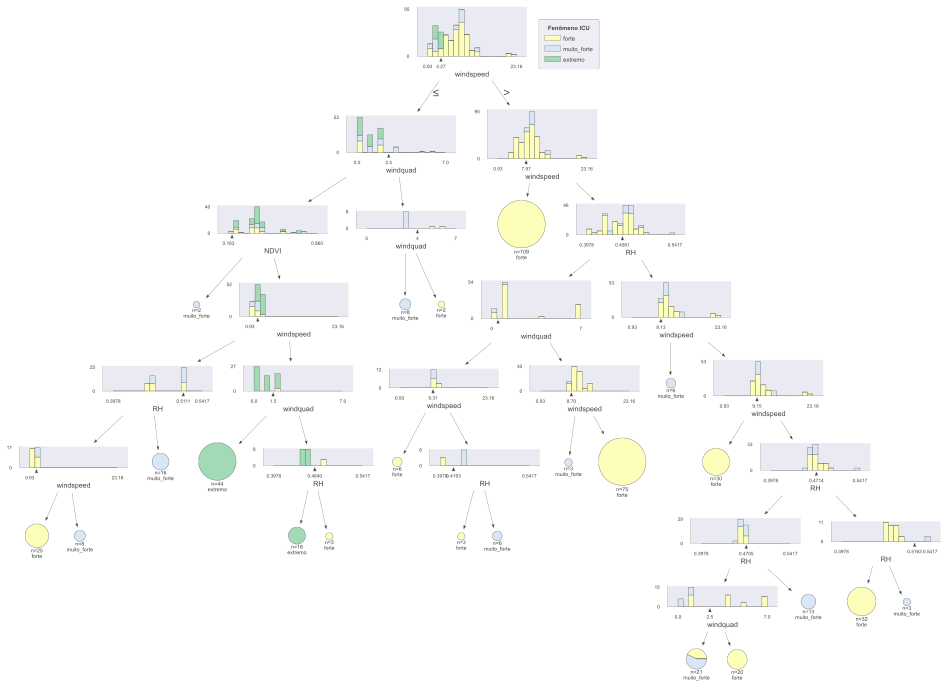

In [184]:
viz_model = dtreeviz.model(tree_classifier, 
                           X_train=df[features],
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU',
                           class_names=classes)
viz_model.view(scale=0.8)

In [185]:
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeClassifier()
pipe = Pipeline(steps=[('std_slc', std_slc),
('pca', pca),
('dec_tree', dec_tree)])
n_components = list(range(1,X.shape[1]+1,1))
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]
parameters = dict(pca__n_components=n_components,
dec_tree__criterion=criterion,
dec_tree__max_depth=max_depth)

In [186]:
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)
print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])

Best Criterion: entropy
Best max_depth: 10
Best Number Of Components: 4

DecisionTreeClassifier(criterion='entropy', max_depth=10)


In [187]:
from sklearn.model_selection import GridSearchCV
param_grid = {'max_features': ['sqrt', 'log2'],
'ccp_alpha': [0.1, .01, .001],
'max_depth' : [5, 6, 7, 8, 9],
'criterion' :['gini', 'entropy']
}
tree_clas = DecisionTreeClassifier(random_state=42)

In [188]:
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)
final_model = grid_search.best_estimator_
final_model

Fitting 5 folds for each of 60 candidates, totalling 300 fits


DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=9,
                       max_features='sqrt', random_state=42)

In [189]:
#Training the model
tree_clas = DecisionTreeClassifier(ccp_alpha=0.01, class_weight=None, criterion='entropy',
max_depth=9, max_features='sqrt', max_leaf_nodes=None,
min_impurity_decrease=0.0,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0,
random_state=42, splitter='best')
tree_clas.fit(X_train, y_train)
y_predict = tree_clas.predict(X_test)
y_predict

array([1, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 2, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 2, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       2, 2, 0, 0])

In [190]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

R²: 0.1560992769880345


In [191]:
import xgboost
import shap

model = xgboost.XGBClassifier(n_estimators=20)
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=20, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [192]:
shap.initjs()

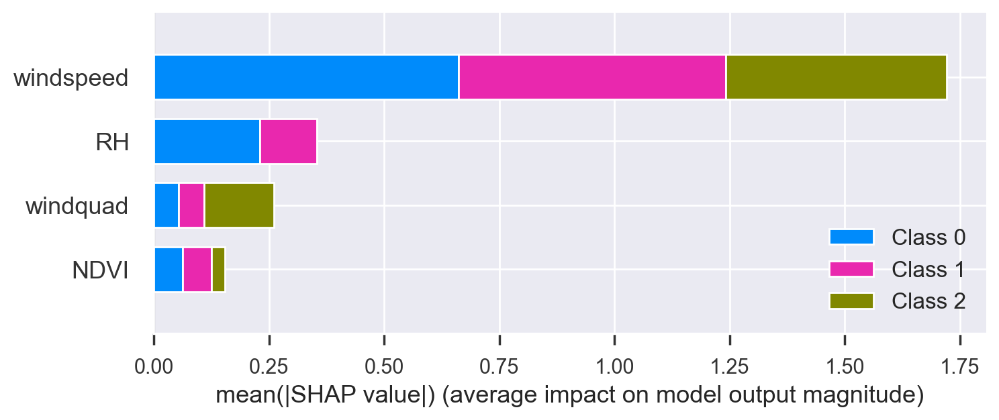

In [193]:
# equilibrated case
# background = np.random.choice(np.arange(10), 10, replace=False) 
background =  shap.utils.sample(X, 1000) #X.sample(1000) #X is equilibrated# background used in explainer defines base value
explainer = shap.TreeExplainer(model,background,model_output="raw")
shap_values = explainer.shap_values(X)# background used in the plot, the points that are visible on the plot
shap.summary_plot(shap_values,background, feature_names=background.columns)

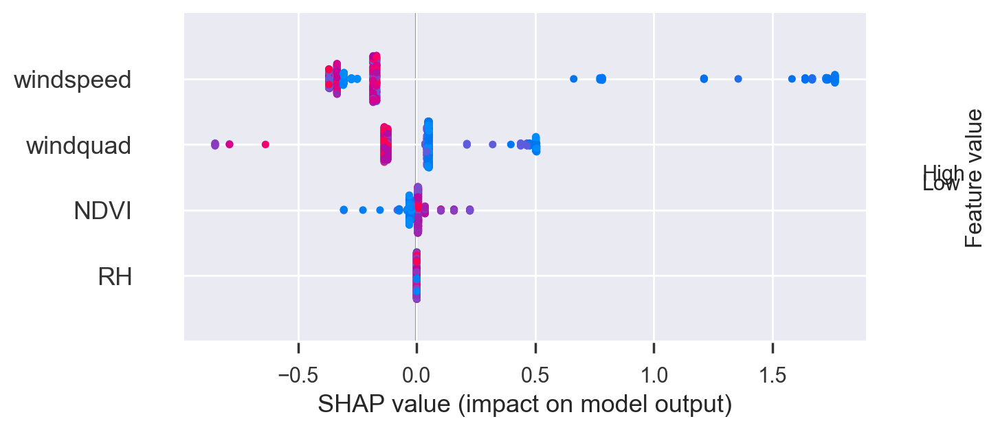

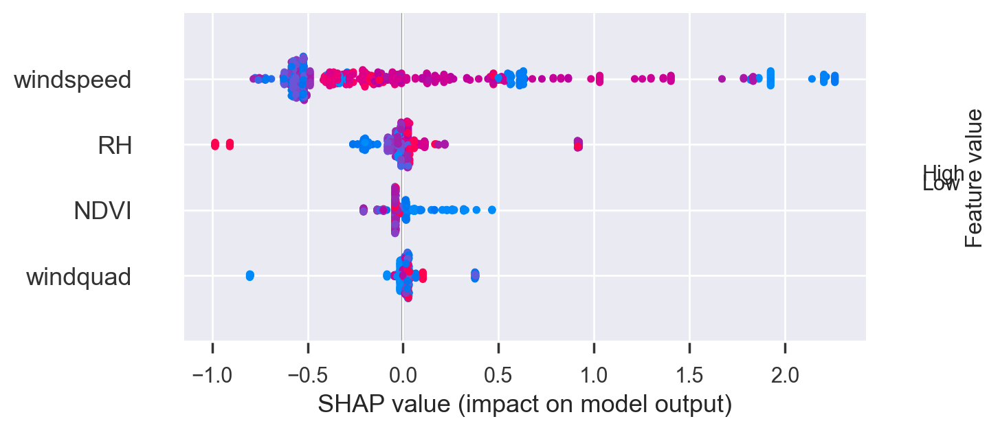

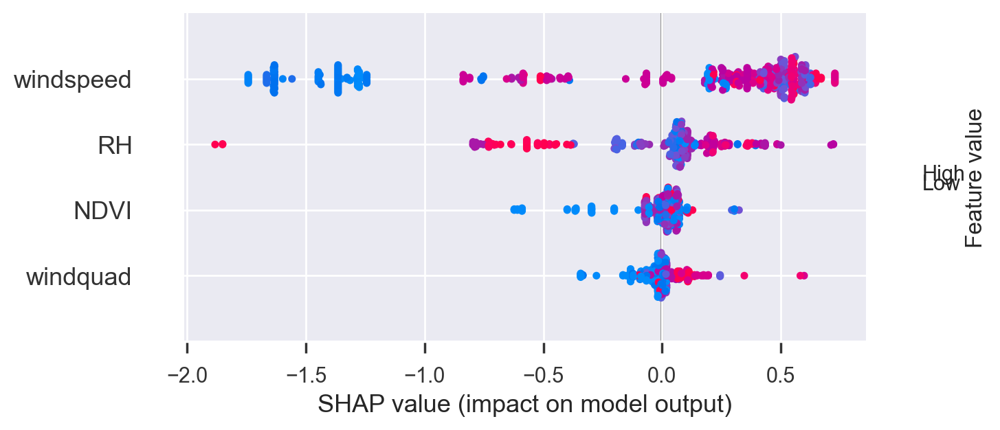

In [194]:
shap.summary_plot(shap_values[2], X)
shap.summary_plot(shap_values[1], X)
shap.summary_plot(shap_values[0], X)

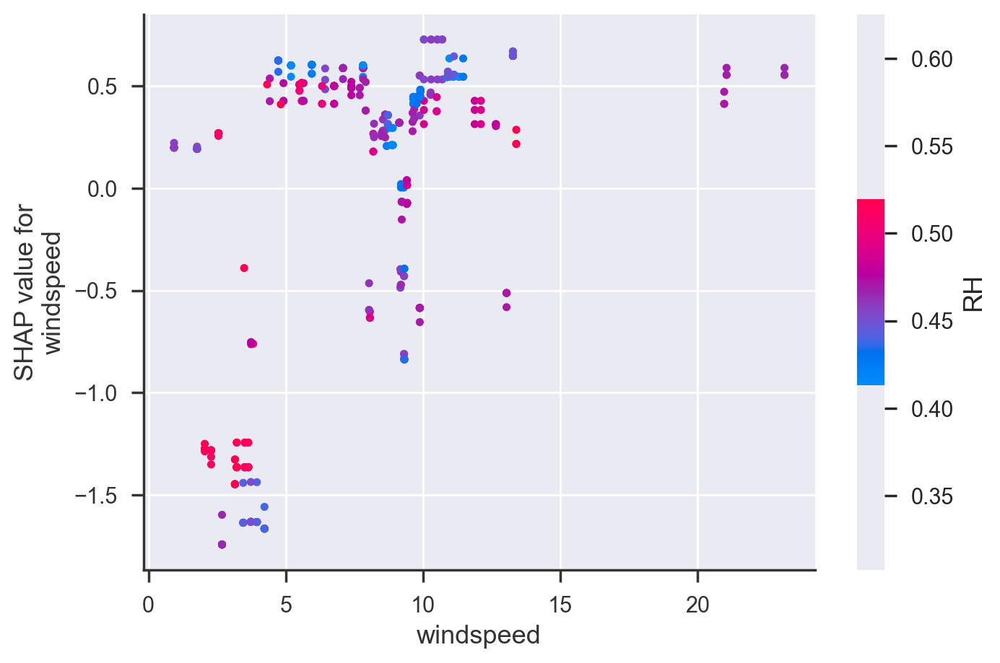

In [195]:
shap.dependence_plot('windspeed', shap_values[0], X, interaction_index="RH")

In [196]:
shap.force_plot(explainer.expected_value[1], shap_values[0], X)

In [197]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)
# print(X_train.shape)

In [198]:
columIndex= 2
shap.force_plot(explainer.expected_value[1], shap_values[1][columIndex,:], X.iloc[columIndex,:], link="logit")

In [199]:
clf = RandomForestClassifier(n_estimators=500, max_depth=8)
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, n_estimators=500)

In [200]:
explainer = shap.TreeExplainer(clf)
shap_values = np.array(explainer.shap_values(X_train))
print(shap_values.shape)

(3, 315, 4)


In [201]:
shap_values_ = shap_values.transpose((1,0,2))

np.allclose(
    clf.predict_proba(X_train),
    shap_values_.sum(2) + explainer.expected_value
)

True

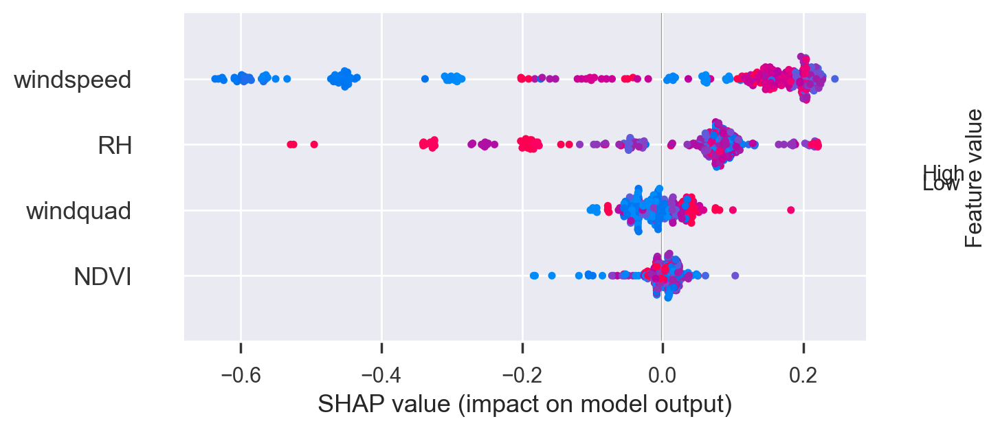

In [202]:
shap.summary_plot(shap_values[0],X_train)

In [203]:
rf = RandomForestClassifier(n_estimators=500, max_depth=8, random_state=42, max_features='sqrt', class_weight='balanced')
rf.fit(X_train, y_train)

# Make predictions for the test set
y_pred_test = rf.predict(X_test)

# Print accuracy for the training and test sets
print("Accuracy on training set: {:.3f}".format(rf.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(rf.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.971


In [204]:
confusion_matrix(y_test, y_pred_test)

array([[96,  0,  0],
       [ 4, 23,  0],
       [ 0,  0, 13]])

In [205]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        96
           1       1.00      0.85      0.92        27
           2       1.00      1.00      1.00        13

    accuracy                           0.97       136
   macro avg       0.99      0.95      0.97       136
weighted avg       0.97      0.97      0.97       136



In [206]:
print('Recall: ',recall_score(y_test, y_pred_test, average=None)[0])

Recall:  1.0


In [207]:
print('Precision: ',precision_score(y_test, y_pred_test, average=None)[0])

Precision:  0.96


In [208]:
print('Índice Kappa: ',cohen_kappa_score(y_test, y_pred_test))

Índice Kappa:  0.9328892178633111


In [209]:
from quantile_forest import RandomForestQuantileRegressor
from sklearn.model_selection import train_test_split

qrf = RandomForestQuantileRegressor(random_state=0)
qrf.fit(X_train, y_train)

# Get the training indices for tree=0, leaf=18683.
y_train_leaves = np.asarray(qrf.forest_.y_train_leaves)
train_indices = y_train_leaves[0, 2, :] - 1
train_indices = train_indices[train_indices >= 0]

# Get the training response values for the training indices
print(np.array(qrf.forest_.y_train)[train_indices])


[]


In [210]:
y_train_leaves.shape

(100, 55, 1)

In [211]:

from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn import tree # for decision tree models

import plotly.express as px  # for data visualization
import plotly.graph_objects as go # for data visualization
import graphviz # for plotting decision tree graphs


In [212]:
def fitting(X, y, criterion, splitter, mdepth, clweight, minleaf):

    # Create training and testing samples
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Fit the model
    model = tree.DecisionTreeClassifier(criterion=criterion, 
                                        splitter=splitter, 
                                        max_depth=mdepth,
                                        class_weight=clweight,
                                        min_samples_leaf=minleaf, 
                                        random_state=42, 
                                  )
    clf = model.fit(X_train, y_train)

    # Predict class labels on training data
    pred_labels_tr = model.predict(X_train)
    # Predict class labels on a test data
    pred_labels_te = model.predict(X_test)

    # Tree summary and model evaluation metrics
    print('*************** Tree Summary ***************')
    print('Classes: ', clf.classes_)
    print('Tree Depth: ', clf.tree_.max_depth)
    print('No. of leaves: ', clf.tree_.n_leaves)
    print('No. of features: ', clf.n_features_in_)
    print('--------------------------------------------------------')
    print("")
    
    print('*************** Evaluation on Test Data ***************')
    score_te = model.score(X_test, y_test)
    print('Accuracy Score: ', score_te)
    # Look at classification report to evaluate the model
    print(classification_report(y_test, pred_labels_te))
    print('--------------------------------------------------------')
    print("")
    
    print('*************** Evaluation on Training Data ***************')
    score_tr = model.score(X_train, y_train)
    print('Accuracy Score: ', score_tr)
    # Look at classification report to evaluate the model
    print(classification_report(y_train, pred_labels_tr))
    print('--------------------------------------------------------')
    
    # Use graphviz to plot the tree
    dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X.columns, 
                                class_names=[str(list(clf.classes_)[0]), str(list(clf.classes_)[1])],
                                filled=True, 
                                rounded=True, 
                                #rotate=True,
                               ) 
    graph = graphviz.Source(dot_data)
    
    # Return relevant data for chart plotting
    return X_train, X_test, y_train, y_test, clf, graph

*************** Tree Summary ***************
Classes:  [0 1 2]
Tree Depth:  0
No. of leaves:  1
No. of features:  4
--------------------------------------------------------

*************** Evaluation on Test Data ***************
Accuracy Score:  0.6923076923076923
              precision    recall  f1-score   support

           0       0.69      1.00      0.82        63
           1       0.00      0.00      0.00        18
           2       0.00      0.00      0.00        10

    accuracy                           0.69        91
   macro avg       0.23      0.33      0.27        91
weighted avg       0.48      0.69      0.57        91

--------------------------------------------------------

*************** Evaluation on Training Data ***************
Accuracy Score:  0.6972222222222222
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       251
           1       0.00      0.00      0.00        59
           2       0.00      0.00   

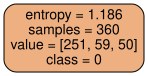

In [213]:
# Fit the model and display results
X_train, X_test, y_train, y_test, clf, graph = fitting(X, y, 'entropy', 'best', 
                                                       mdepth=8, 
                                                       clweight=None,
                                                       minleaf=1000)

# Plot the tree graph
graph

# Save tree graph to a PDF
#graph.render('Decision_Tree_all_vars_gini')

*************** Tree Summary ***************
Classes:  [0 1 2]
Tree Depth:  0
No. of leaves:  1
No. of features:  4
--------------------------------------------------------

*************** Evaluation on Test Data ***************
Accuracy Score:  0.6923076923076923
              precision    recall  f1-score   support

           0       0.69      1.00      0.82        63
           1       0.00      0.00      0.00        18
           2       0.00      0.00      0.00        10

    accuracy                           0.69        91
   macro avg       0.23      0.33      0.27        91
weighted avg       0.48      0.69      0.57        91

--------------------------------------------------------

*************** Evaluation on Training Data ***************
Accuracy Score:  0.6972222222222222
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       251
           1       0.00      0.00      0.00        59
           2       0.00      0.00   

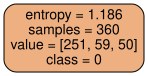

In [214]:
# Fit the model and display results
X_train, X_test, y_train, y_test, clf, graph = fitting(X, y, 'entropy', 'best', 
                                                       mdepth=8, 
                                                       clweight=None, 
                                                       minleaf=1000)

# Plot the tree graph
graph

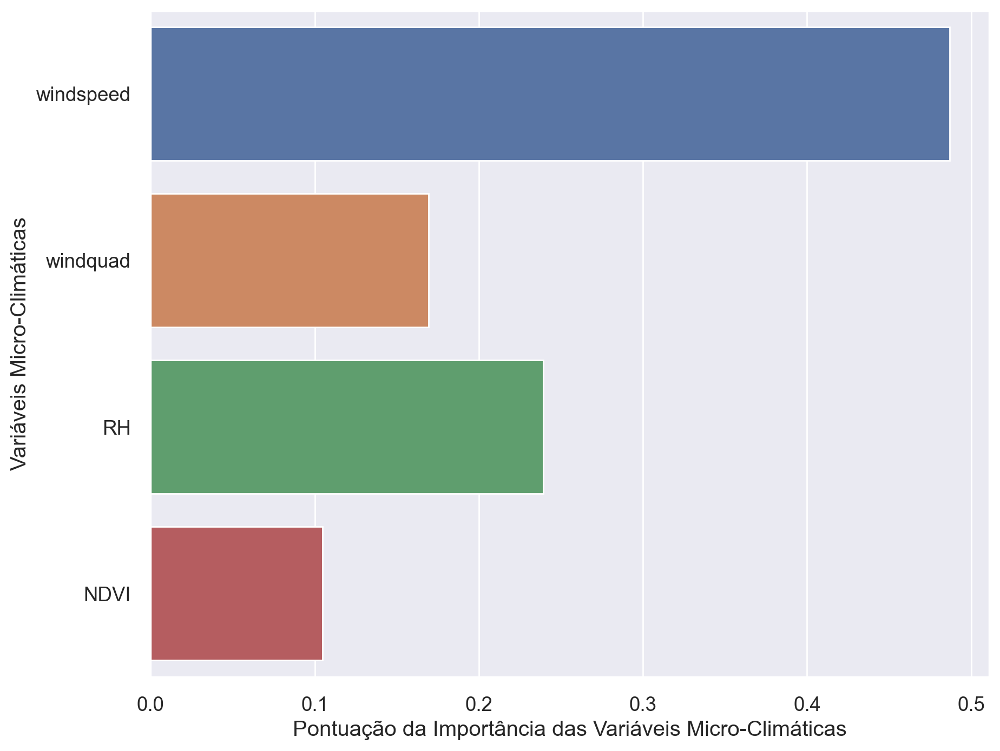

In [215]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# Creating a seaborn bar plot
sns.barplot(x=model.feature_importances_, y=X.columns)

# Add labels to the graph
plt.xlabel('Pontuação da Importância das Variáveis Micro-Climáticas')
plt.ylabel('Variáveis Micro-Climáticas')

# Add title to the graph
plt.title("")

# Visualize the graph
plt.show()

In [216]:
# from treeinterpreter import treeinterpreter as ti
# # fit a scikit-learn's regressor model
# # rf = RandomForestRegressor()
# rf.fit(X_train, y_train)
# prediction, bias, contributions = ti.predict(rf, X_test)
# prediction, bias, contributions = ti.predict(rf, X)
# print("Prediction", prediction)
# print("Bias (trainset prior)", bias)
# print("Feature contributions:")
# for c, feature in zip(contributions[0], 
#                              X):
#     print(feature, c)

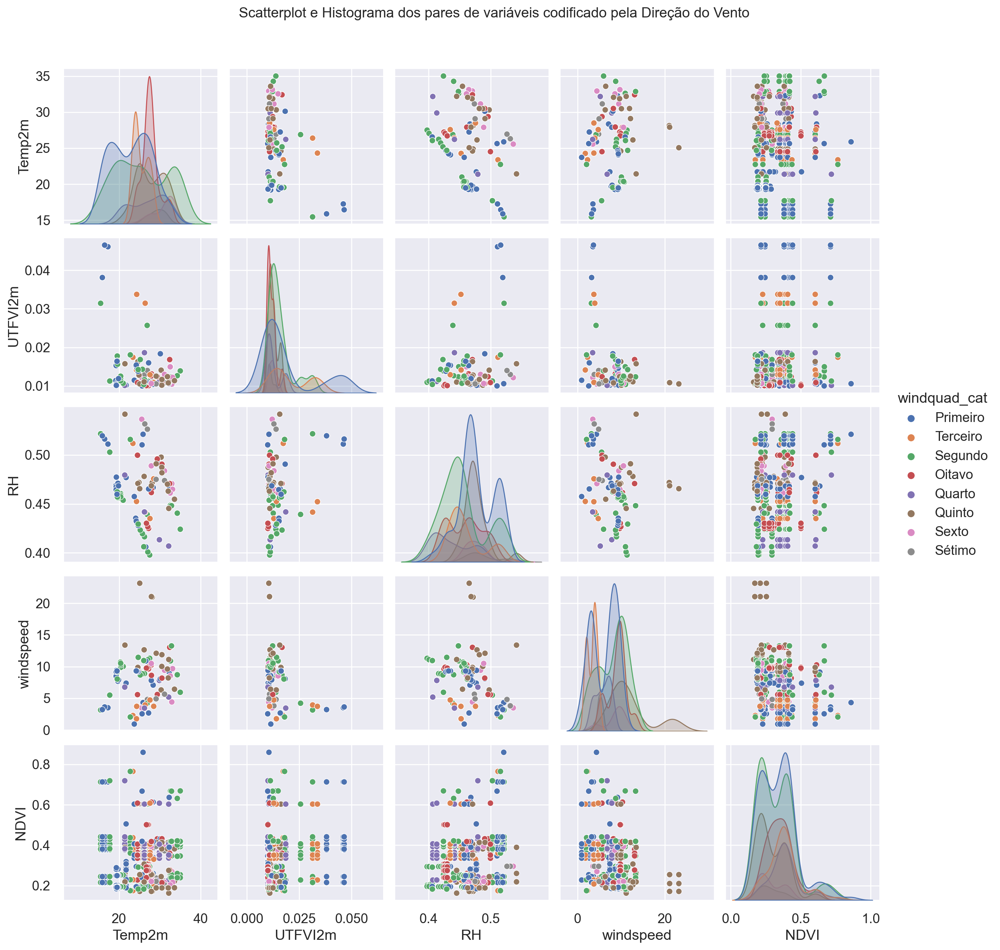

In [217]:
g = sns.pairplot(df[['Temp2m','UTFVI2m','RH','windspeed','windquad_cat','NDVI']], hue='windquad_cat')
g.fig.suptitle("Scatterplot e Histograma dos pares de variáveis codificado pela Direção do Vento", 
               fontsize = 14, # defining the size of the title
               y=1.05); 

In [218]:
y = df['UHIp2m']
X = df[feat] #.drop(['windquad','windquad_cat','dewPoint','surface_pressure','skinTemp','UTFVI','windpower','UHIp','UHIn','UHIp2m','UHIn2m','UHIt'], axis=1)

In [219]:
X,y

(      windspeed  windquad        RH      NDVI
 53     7.387343         0  0.476950  0.318940
 60     9.133717         0  0.468182  0.419299
 109    2.281553         2  0.511810  0.431238
 110    2.049673         1  0.515845  0.431238
 135    7.084406         0  0.466726  0.388546
 ...         ...       ...       ...       ...
 5263   9.307008         1  0.457110  0.191585
 5264   9.309723         0  0.459806  0.191585
 5272   8.214487         4  0.463012  0.188724
 5275  11.880875         4  0.481825  0.188724
 5276  12.107019         4  0.490986  0.188724
 
 [451 rows x 4 columns],
 53      0
 60      0
 109     1
 110     1
 135     0
        ..
 5263    1
 5264    1
 5272    0
 5275    0
 5276    0
 Name: UHIp2m, Length: 451, dtype: int64)

In [220]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [221]:
model = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='log2', random_state=random_state, criterion='gini')

In [222]:
# Fit RandomForestClassifier
rfc = model.fit(X_train, y_train)
# Predict the test set labels
# y_pred = rfc.predict(X_test)
print('o R² do treino é: %.2f'% rfc.score(X_train, y_train))

o R² do treino é: 1.00


In [223]:
#prediction of the training data
ytrain_pred = rfc.predict(X_train)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.00
Mean Squared Error: 0.00
Root Mean Squared Error: 0.06
Explained Variance Score: 0.99


In [224]:
#Prediction on the testing data
ytest_pred = rfc.predict(X_test)

#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred)) 
print('O R² do Teste é: %.2f'% rfc.score(X_test, y_test)) 

O R² do Teste é: 0.90
O R² do Teste é: 0.96


In [225]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, y_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, y_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, y_pred))

Mean Absolute Error: 0.49
Mean Squared Error: 0.36
Root Mean Squared Error: 0.60
Explained Variance Score: 0.16


In [226]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.04
Mean Squared Error: 0.04
Root Mean Squared Error: 0.21
Explained Variance Score: 0.90


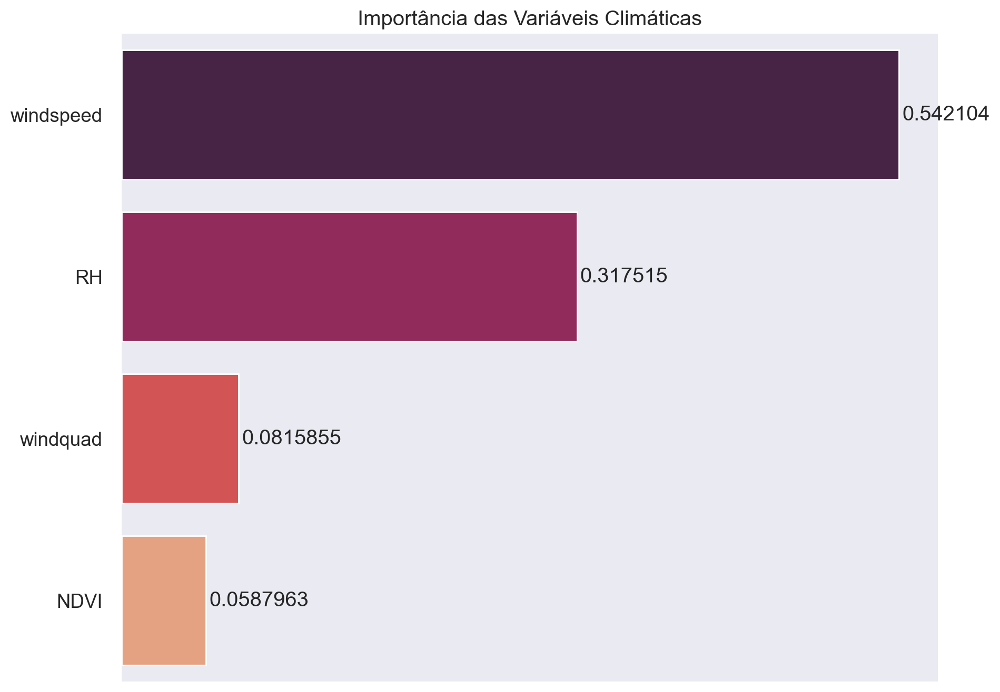

In [227]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importances_Features-log2-"+ano+".png")

In [228]:
# # Plotting the observed and predicted data
# import matplotlib.pyplot as plt
# # Setting the boundaries and parameters
# plt.rcParams['figure.figsize'] = (40,15)
# x_ax = range(len(X_test))
# # Plotting 
# plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
# plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
# plt.ylabel('Direção do Vento', fontsize=15)
# plt.xlabel('Testando Dados Amostrais',fontsize=15)
# plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =  False,fontsize=15)
# # plt.show()
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/all/"+folder+"/"+"RF-WINDQUAD+NDVIxall-MD"+str(md)+"-"+ano+".png")

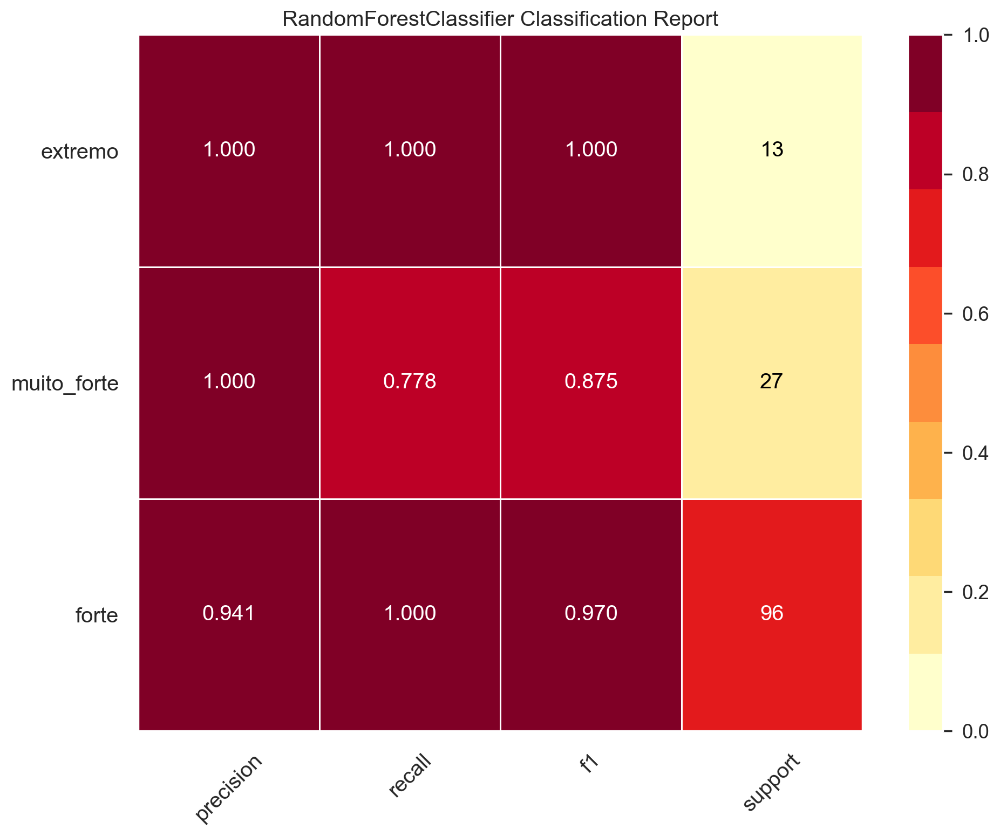

<AxesSubplot: title={'center': 'RandomForestClassifier Classification Report'}>

In [229]:
#Plotting the classification errors and residuals 
# Setting the boundaries and parameters
# plt.rcParams['figure.figsize'] = (7,4)

from yellowbrick.classifier import ClassificationReport
visualizer = ClassificationReport(rfc,classes=classes, support=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

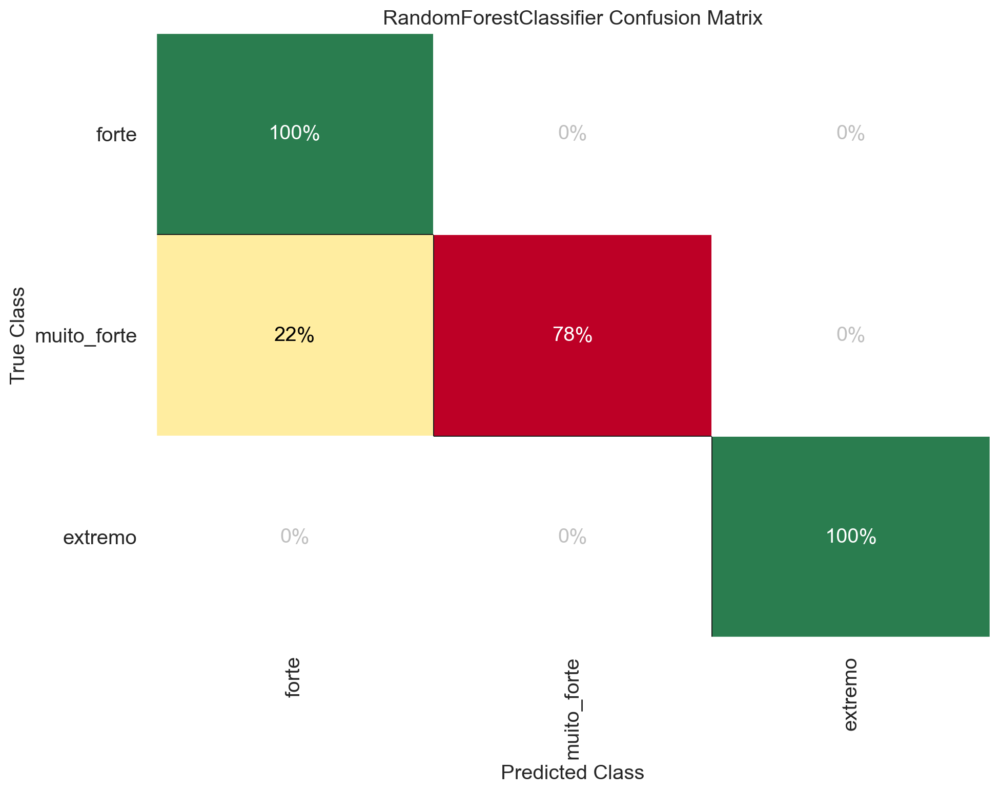

In [230]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(
    rfc, classes=classes,
    percent=True
    #label_encoder={0: 'Adelie', 1: 'Chinstrap', 2: 'Gentoo'}
)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

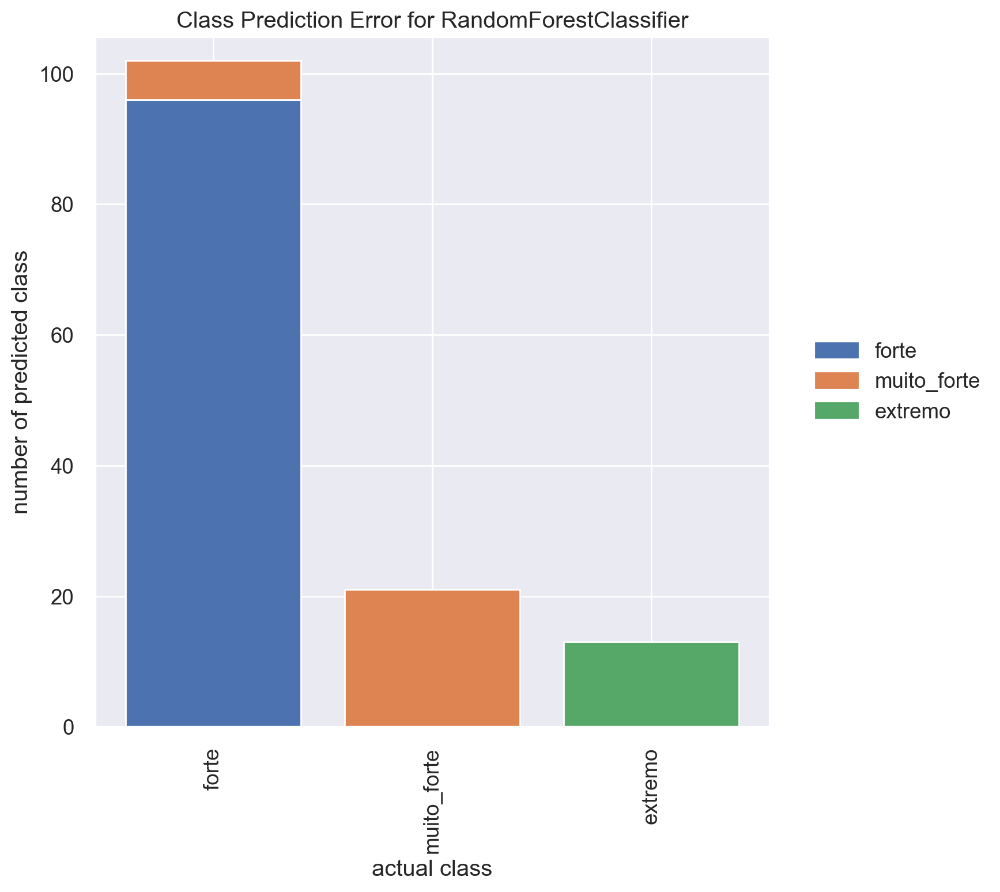

In [231]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(
    rfc, classes=classes)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

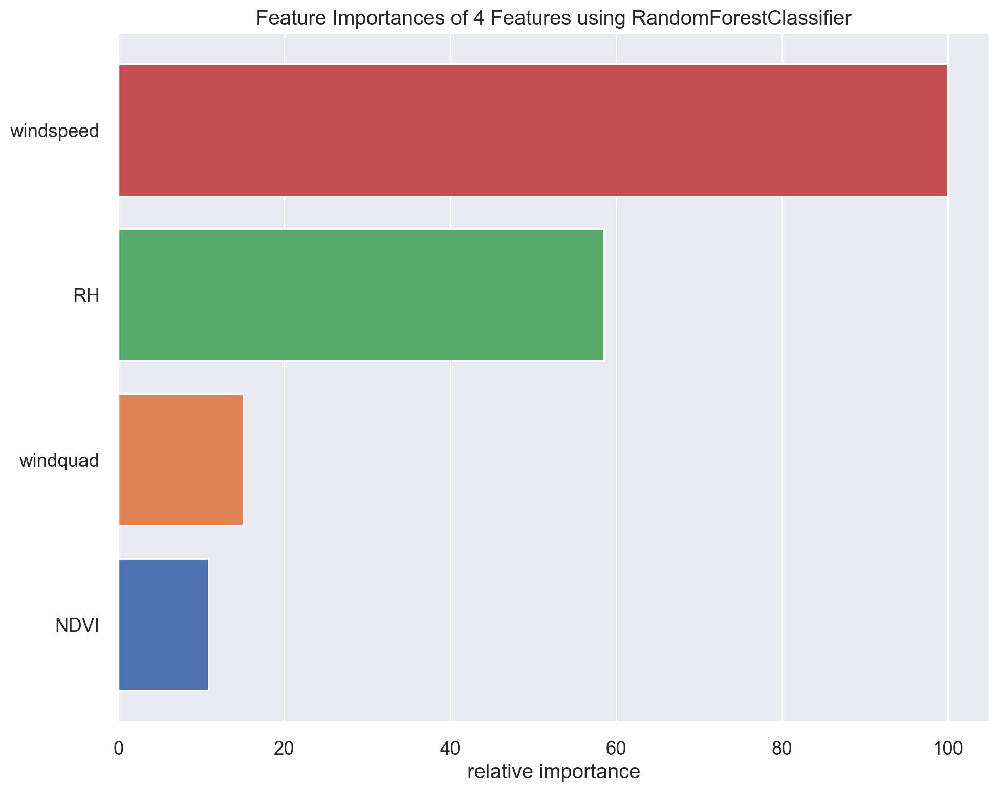

In [232]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.ensemble import RandomForestClassifier
visualizer = FeatureImportances(rfc)
visualizer.fit(X_train, y_train)
visualizer.show();

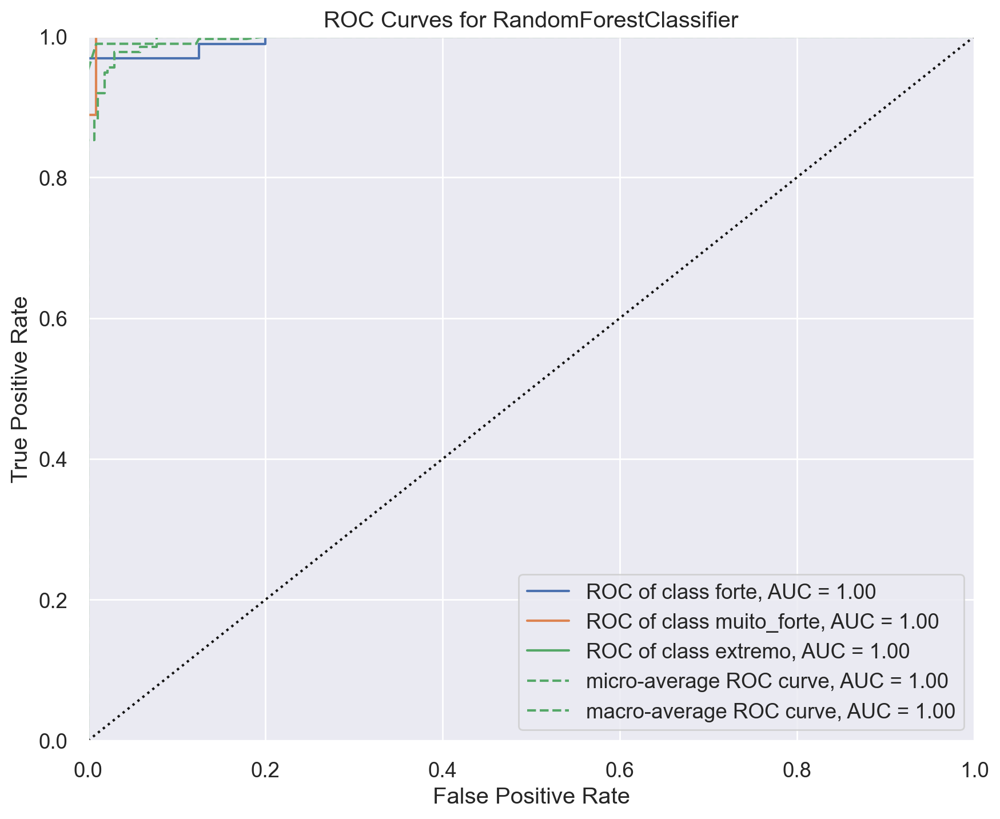

In [233]:
from yellowbrick.classifier import ROCAUC
# from sklearn.linear_model import LogisticRegression
# X, y = load_spam()
# X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
# model = LogisticRegression(max_iter=10000)
# model.fit(X_train, y_train)
visualizer = ROCAUC(rfc, classes = classes) #['Segundo', 'Oitavo', 'Primeiro', 'Sétimo', 'Terceiro', 'Quarto', 'Quinto', 'Sexto'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

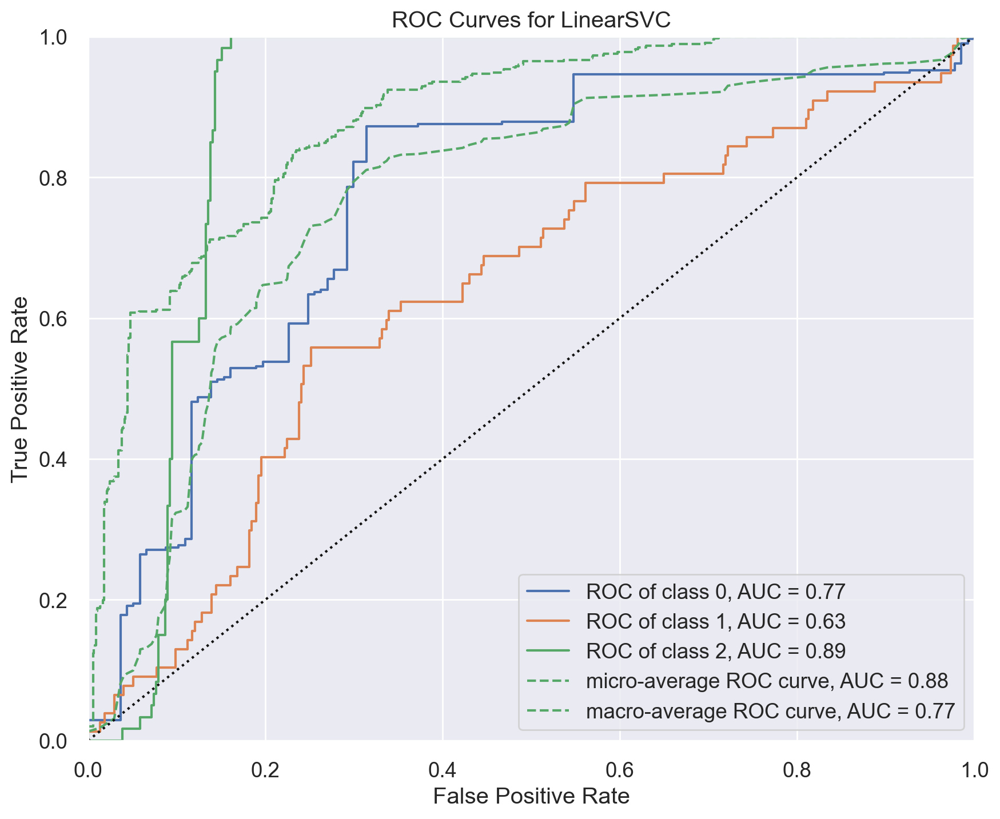

<AxesSubplot: title={'center': 'ROC Curves for LinearSVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [234]:
from sklearn.svm import LinearSVC
from yellowbrick.classifier import ROCAUC

model = LinearSVC()
visualizer = ROCAUC(model)
visualizer.fit(X,y)
visualizer.score(X,y)
visualizer.show()

In [235]:
# from sklearn.metrics import classification_report, confusion_matrix

# cm = confusion_matrix(y_test, y_pred)
# sns.heatmap(cm, annot=True, fmt='d').set_title('Matriz de Confusão - Dir. do Vento (Quadrantes)')

# print(classification_report(y_test,y_pred))

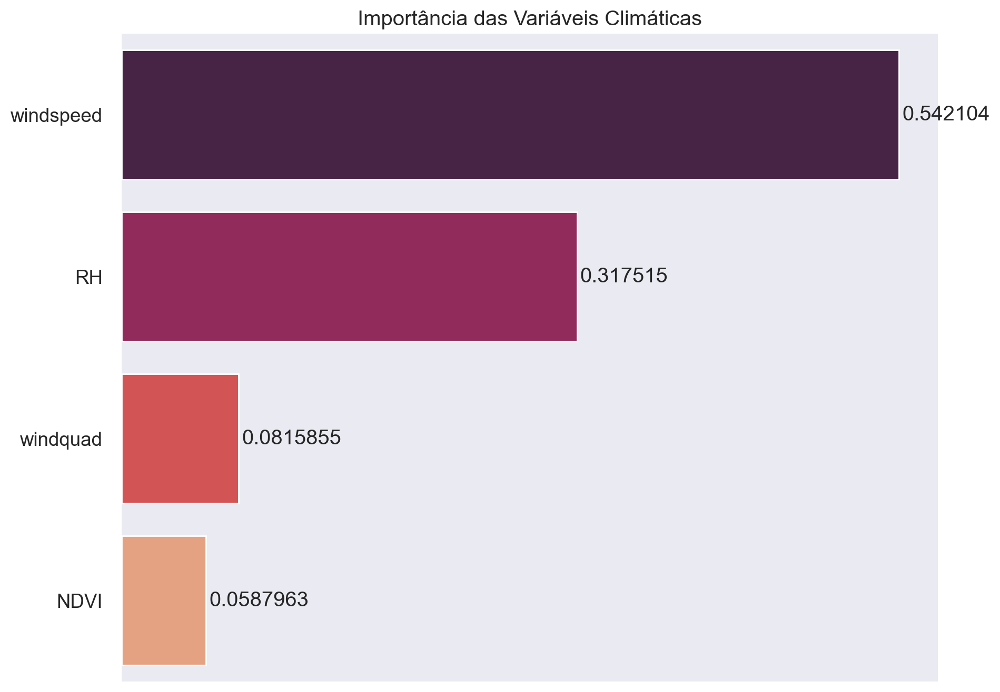

In [236]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })

# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)

# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

In [237]:
rfc_ = RandomForestClassifier(n_estimators=300, 
                             max_depth=int(md),
                             random_state=random_state,
                             criterion='gini')
rfc_.fit(X_train, y_train)
y_pred = rfc_.predict(X_test)

In [238]:
regc = rfc_.fit(X_train, y_train)
print('o R² do treino é: %.2f'% regc.score(X_train, y_train))

o R² do treino é: 1.00


              precision    recall  f1-score   support

           0       0.94      1.00      0.97        96
           1       1.00      0.78      0.88        27
           2       1.00      1.00      1.00        13

    accuracy                           0.96       136
   macro avg       0.98      0.93      0.95       136
weighted avg       0.96      0.96      0.95       136



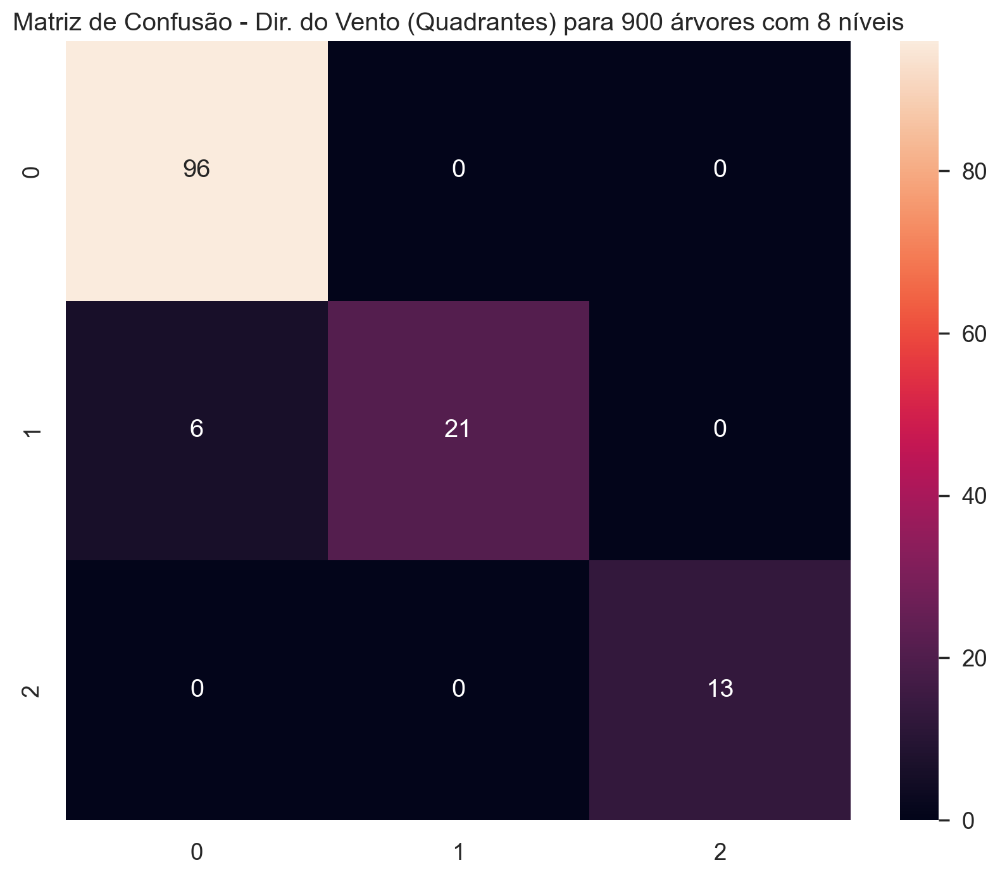

In [239]:
cm_ = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_, annot=True, fmt='d').set_title('Matriz de Confusão - Dir. do Vento (Quadrantes) para 900 árvores com 8 níveis')

print(classification_report(y_test,y_pred))

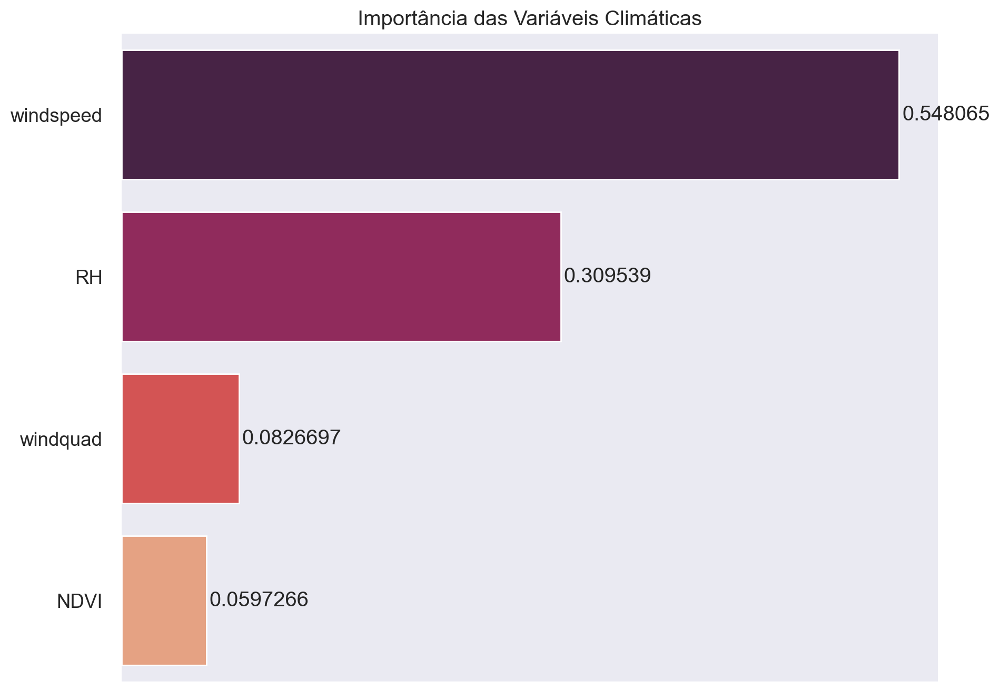

In [240]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc_.feature_names_in_, 'importances': rfc_.feature_importances_ })

# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)

# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

In [241]:
y = df['UHIn2m']
X = df.drop(['UTFVI2m','dewPoint','surface_pressure','windquad_cat','skinTemp','UTFVI','NDVI','windpower','UHIp','UHIn','UHIp2m','UHIn2m','UHIt'], axis=1)

In [242]:
X

,index,Temp2m,total_precipitation,RH,windspeed,total_evaporation,windquad
53,1106,21.713098,8.583069e-07,0.476950,7.387343,-0.000057,0
60,1208,32.291772,1.548889e-03,0.468182,9.133717,-0.001525,0
109,2779,23.385400,0.000000e+00,0.511810,2.281553,-0.000032,2
110,2780,22.739038,0.000000e+00,0.515845,2.049673,-0.000035,1
135,3257,28.356409,0.000000e+00,0.466726,7.084406,-0.000032,0
...,...,...,...,...,...,...,...
5263,103924,19.567712,0.000000e+00,0.457110,9.307008,-0.000005,1
5264,103925,19.475854,0.000000e+00,0.459806,9.309723,-0.000006,0
5272,104103,32.067957,9.118319e-05,0.463012,8.214487,-0.001688,4
5275,104107,30.508936,2.084553e-04,0.481825,11.880875,-0.002472,4


In [243]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [244]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=500, # 20 trees
                            max_depth=int(md), # 4 levels
                            random_state=random_state,
                            max_features='log2',
                            criterion='poisson')

# rfr.fit(X_train, y_train)
# y_pred = rfr.predict(X_test)

In [245]:
reg = model.fit(X_train, y_train)
print('o R² do treino é: %.2f'% reg.score(X_train, y_train))

o R² do treino é: 0.99


In [246]:
ytrain_pred = reg.predict(X_train)
y_pred = reg.predict(X_test)

In [247]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.03
Mean Squared Error: 0.00
Root Mean Squared Error: 0.06
Explained Variance Score: 0.99


In [248]:
#Prediction on the testing data
ytest_pred = reg.predict(X_test)

In [249]:
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred)) 

O R² do Teste é: 0.93


In [250]:
print('O R² do Teste é: %.2f'% reg.score(X_test, y_test)) 

O R² do Teste é: 0.93


In [251]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.09
Mean Squared Error: 0.03
Root Mean Squared Error: 0.17
Explained Variance Score: 0.93


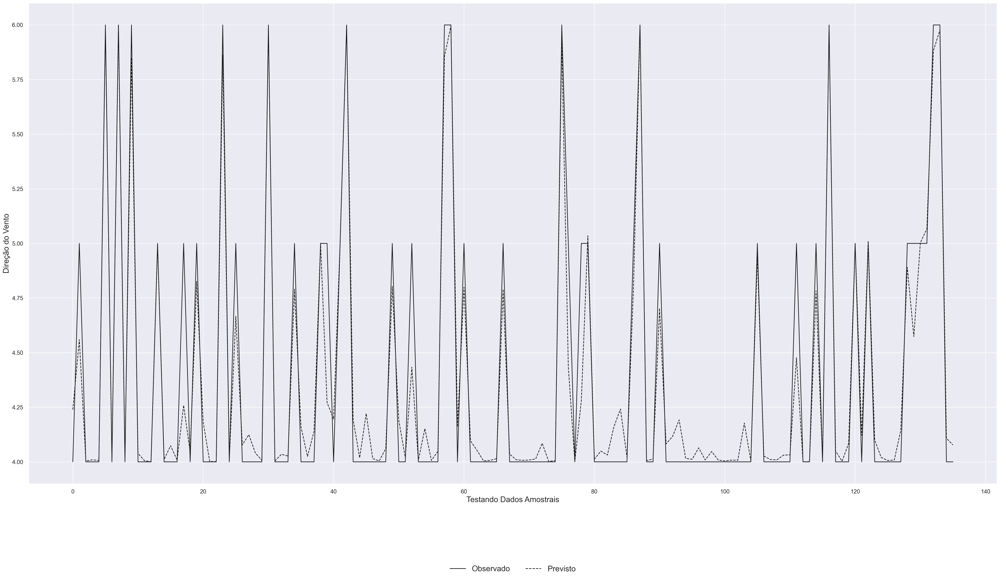

In [252]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,20)
x_ax = range(len(X_test))
# Plotting 
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Direção do Vento',fontsize=18)
plt.xlabel('Testando Dados Amostrais',fontsize=18)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =  False,fontsize=18)
plt.show()

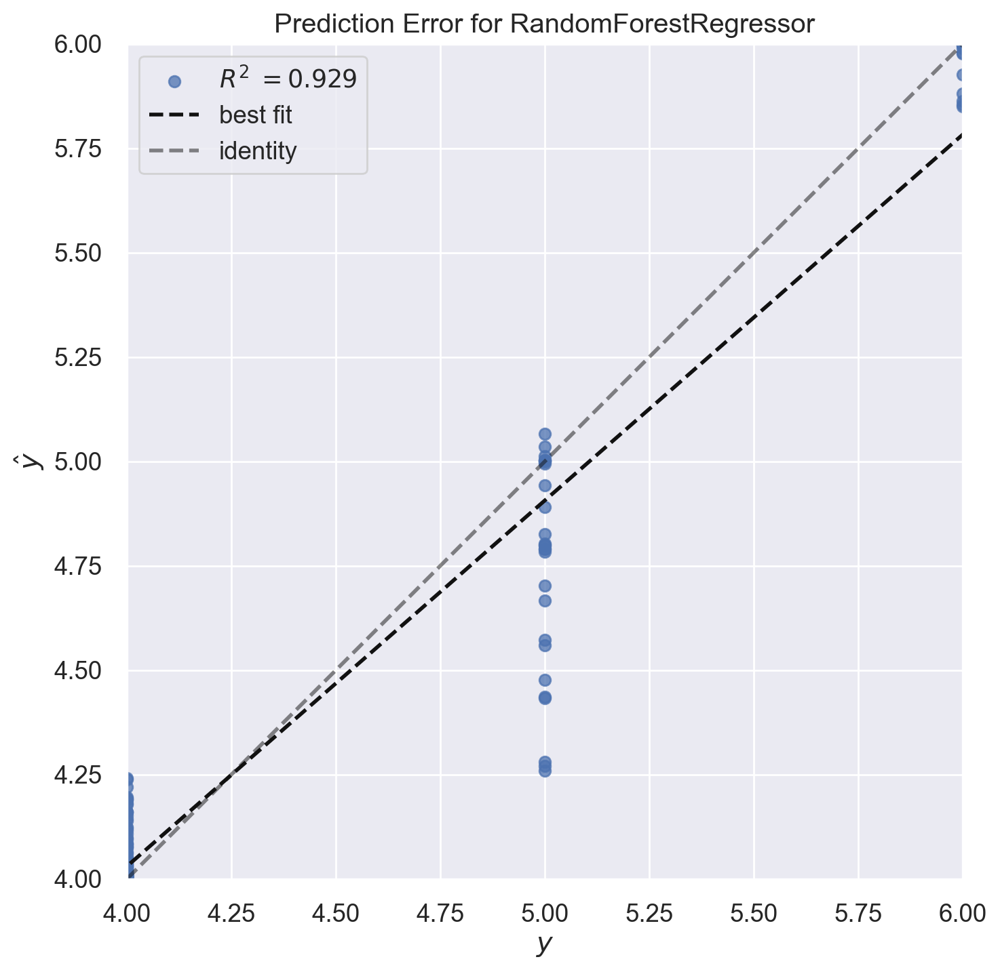

<AxesSubplot: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [253]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,8)
#Plotting the prediction errors and residuals 
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

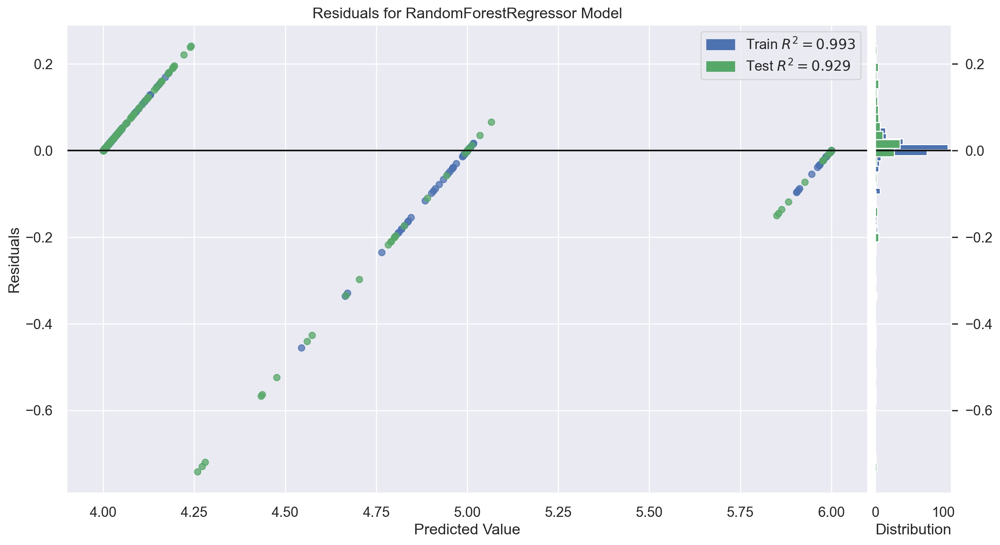

<AxesSubplot: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [254]:
# Plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [255]:
# the k-fold Cross-Validation (CV)
from sklearn.model_selection import cross_val_score
seed = 42
# training model CV
score_train = cross_val_score(reg, X_train, y_train, scoring = 'neg_mean_squared_error', cv = 10)
score_train

array([-0.04027061, -0.01348444, -0.04311592, -0.0132675 , -0.04213619,
       -0.00286352, -0.0141165 , -0.0205876 , -0.01238805, -0.00984302])

In [256]:
# the absolute mean score
print(np.mean(score_train))

-0.021207335744769566


In [257]:
# the absolute mean score
from numpy import absolute
print(absolute(np.mean(score_train)))

0.021207335744769566


In [258]:
# the testing model CV
score_test = cross_val_score(reg, X_test, y_test, scoring = 'neg_mean_squared_error', cv = 10)
score_test

array([-0.07160095, -0.02723285, -0.03199064, -0.09129913, -0.02573064,
       -0.07744524, -0.16529599, -0.08357897, -0.06083293, -0.03993168])

In [259]:
print(absolute(np.mean(score_test)))

0.0674939024530814


In [260]:
# Random Forest Features Ranking
from sklearn.pipeline import Pipeline

In [261]:
f_list = list(X.columns)
f_importance = pd.Series(reg.feature_importances_, index = f_list).sort_values(ascending  = False) 

f_importance

windspeed              0.347656
Temp2m                 0.227357
RH                     0.179069
total_evaporation      0.154901
total_precipitation    0.037098
windquad               0.036132
index                  0.017785
dtype: float64

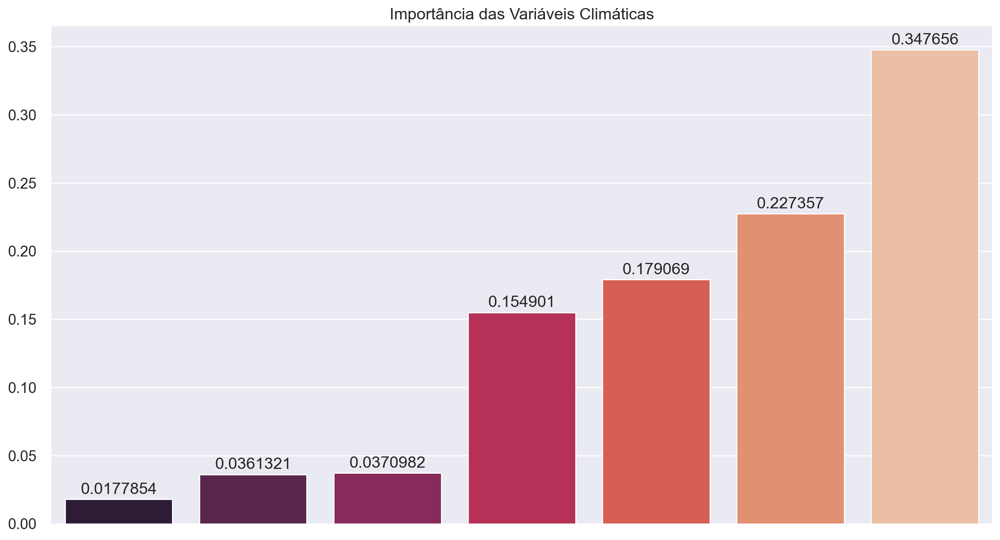

In [262]:
# Barplot of the result without borders and axis lines
g = sns.barplot(data=f_importance, x=X.columns, y =reg.feature_importances_, palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

### printing decision tree - random forest (funciona)

In [263]:
# from sklearn import tree

# features = X.columns
# # Obtain just the first tree
# first_tree = reg.estimators_[0]

# plt.figure(figsize=(15,6))
# tree.plot_tree(first_tree,
#                feature_names=features,
#                fontsize=8, 
#                filled=True, 
#                rounded=True);


### printing regression - random forest (funciona)

In [264]:
# viz_model = dtreeviz.model(first_tree, tree_index=t_index,
#                              X_train=X_train,
#                              y_train=y_train,
#                              feature_names=features,
#                              target_name='Dir. do Vento',
#                              class_names=classes)
# viz_model.view(scale=1)

In [265]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.03
Mean Squared Error: 0.00
Root Mean Squared Error: 0.06
Explained Variance Score: 0.99


In [266]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.09
Mean Squared Error: 0.03
Root Mean Squared Error: 0.17
Explained Variance Score: 0.93


In [267]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error

print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.09390379110502318
Mean Squared Error: 0.030456806625504904
Root Mean Squared Error: 0.17451878588136266


In [268]:
# Data treatment
# ==============================================================================
import scipy.stats as stats

# Visual
# ==============================================================================
import plotly.express as px
import pylab
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff

# Machine Learnig 
# ==============================================================================

from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Metrics
# ==============================================================================
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error 
from sklearn import metrics
from sklearn.metrics import confusion_matrix

# Warning Config
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

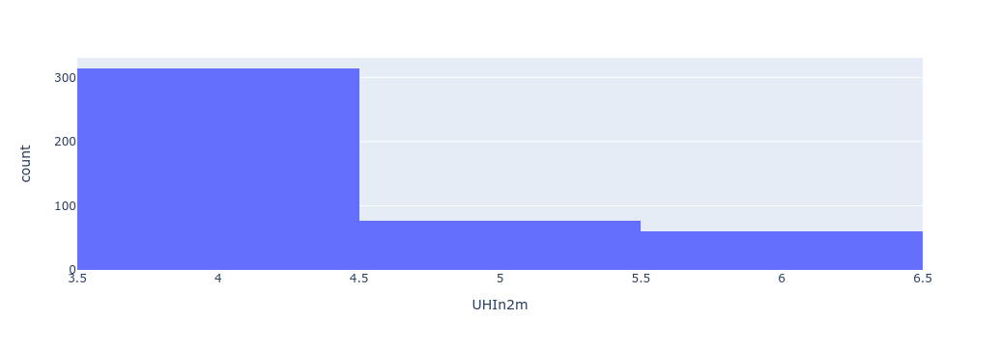

In [269]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (20,15)
fig = px.histogram(y, x ="UHIn2m")
fig.show()

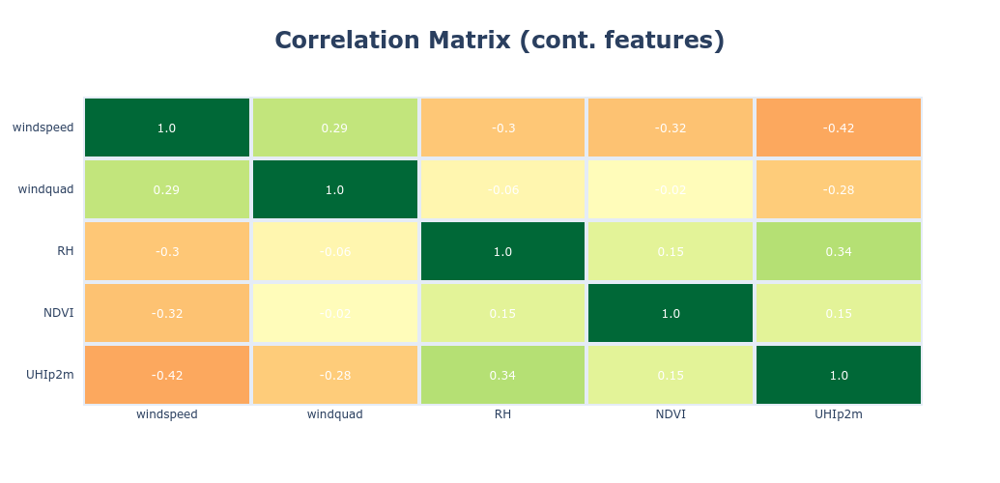

In [270]:
corr = df[feat+[target]].corr()

fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),       
    xgap=4, ygap=4,
    zmin=-1, zmax=1,
    colorscale='RdYlGn',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Correlation Matrix (cont. features)<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=500, height=500,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',                   
                  paper_bgcolor=None,
                  )
fig.show()

In [271]:
Y = df[target]
X = df[feat]
Model = sm.OLS(Y, sm.add_constant(X))
Results = Model.fit()
print(Results.summary())

                            OLS Regression Results                            
Dep. Variable:                 UHIp2m   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.55e-27
Time:                        10:54:02   Log-Likelihood:                -422.49
No. Observations:                 451   AIC:                             855.0
Df Residuals:                     446   BIC:                             875.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5260      0.479     -3.189      0.0

In [272]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [273]:
model.fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

coefficient of determination: 0.25549448262281127


In [274]:
model = LinearRegression().fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

coefficient of determination: 0.25549448262281127


In [275]:
print(f"intercept: {model.intercept_}")
intercept: 5.633333333333329
print(f"slope: {model.coef_}")

intercept: 2.4740208367419703
slope: [-0.05499514 -0.05595811  5.30692867  0.09259495]


In [276]:
import statsmodels.api as sm

In [277]:
x, y = np.array(df[feat]), np.array(df[target])

In [278]:
x = sm.add_constant(x)

In [279]:
model = sm.OLS(y, x)

In [280]:
results = model.fit()

In [281]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.55e-27
Time:                        10:54:02   Log-Likelihood:                -422.49
No. Observations:                 451   AIC:                             855.0
Df Residuals:                     446   BIC:                             875.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5260      0.479     -3.189      0.0

In [282]:
x = df[feat]
y = df[target]
x = sm.add_constant(x)

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                 UHIp2m   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.55e-27
Time:                        10:54:02   Log-Likelihood:                -422.49
No. Observations:                 451   AIC:                             855.0
Df Residuals:                     446   BIC:                             875.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5260      0.479     -3.189      0.0

In [283]:
df[feat+[target]]

,windspeed,windquad,RH,NDVI,UHIp2m
53,7.387343,0,0.476950,0.318940,0
60,9.133717,0,0.468182,0.419299,0
109,2.281553,2,0.511810,0.431238,1
110,2.049673,1,0.515845,0.431238,1
135,7.084406,0,0.466726,0.388546,0
...,...,...,...,...,...
5263,9.307008,1,0.457110,0.191585,1
5264,9.309723,0,0.459806,0.191585,1
5272,8.214487,4,0.463012,0.188724,0
5275,11.880875,4,0.481825,0.188724,0


In [284]:
X = df[feat+[target]].iloc[:, 1].values.reshape(-1, 1)  # values converts it into a numpy array
Y = df[feat+[target]].iloc[:, 2].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)  # make predictions

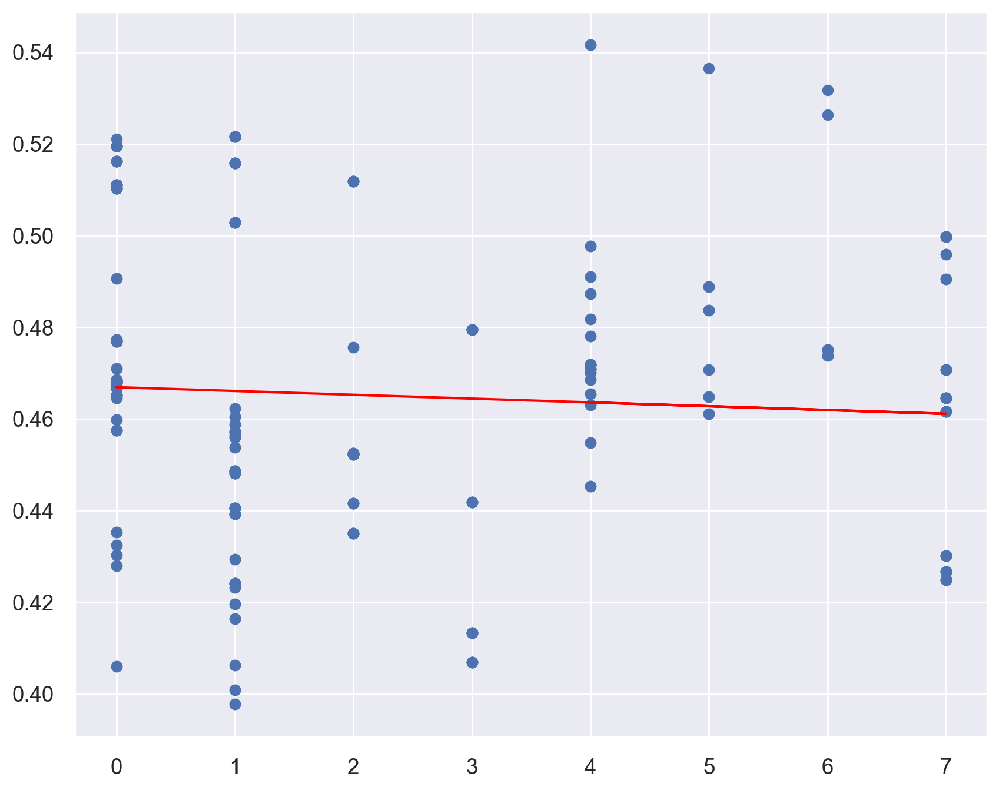

In [285]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (10,8)

plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.show()

In [286]:
y = df['windquad'].values.reshape(-1, 1)
X = df['UHIn2m'].values.reshape(-1, 1)

In [287]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [288]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [289]:
print(regressor.intercept_)
print(regressor.coef_)

[6.37968802]
[[-0.91851975]]


In [290]:
def calc(slope, intercept, UTFVI2m):
    return slope*UTFVI2m+intercept

score = calc(regressor.coef_, regressor.intercept_, .0022)
print(score) 

[[6.37766728]]


In [291]:
# Passing 9.5 in double brackets to have a 2 dimensional array
score = regressor.predict([[0.0022]])
print(score) 

[[6.37766728]]


In [292]:
y_pred = regressor.predict(X_test)

In [293]:
df_preds = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_preds)

     Actual  Predicted
0         5   2.705609
1         0   1.787089
2         7   2.705609
3         3   2.705609
4         2   2.705609
..      ...        ...
131       3   1.787089
132       2   0.868570
133       2   0.868570
134       7   2.705609
135       7   2.705609

[136 rows x 2 columns]


In [294]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

Mean absolute error: 1.93
Mean squared error: 5.04
Root mean squared error: 2.24


In [295]:
print(df[feat+[target]].describe().round(2).T)

           count  mean   std   min   25%   50%   75%    max
windspeed  451.0  7.41  3.79  0.93  3.95  7.82  9.72  23.16
windquad   451.0  2.30  2.35  0.00  0.00  1.00  4.00   7.00
RH         451.0  0.47  0.03  0.40  0.44  0.46  0.48   0.54
NDVI       451.0  0.34  0.12  0.16  0.23  0.35  0.40   0.86
UHIp2m     451.0  0.44  0.72  0.00  0.00  0.00  1.00   2.00


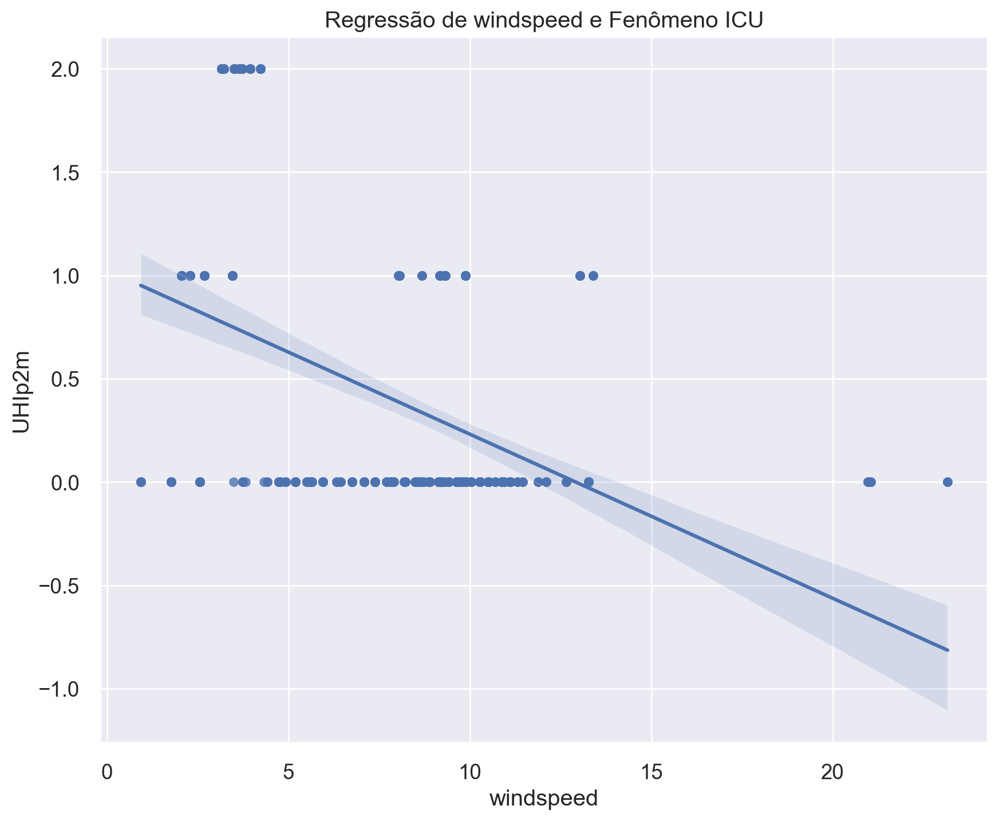

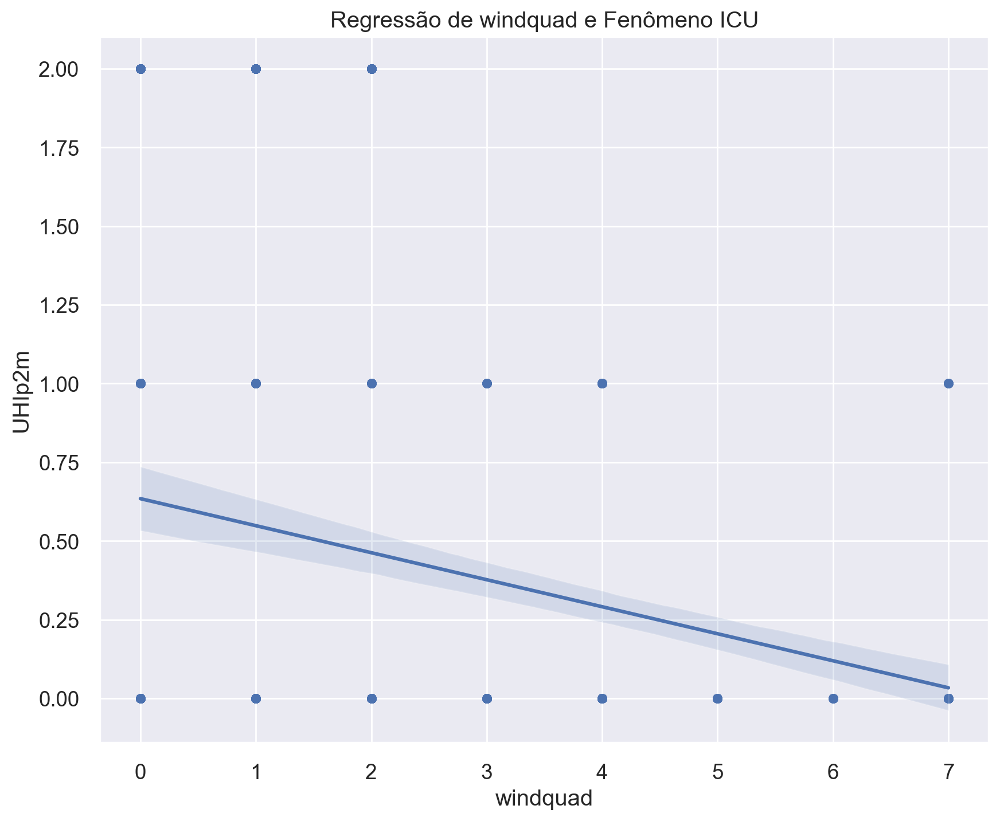

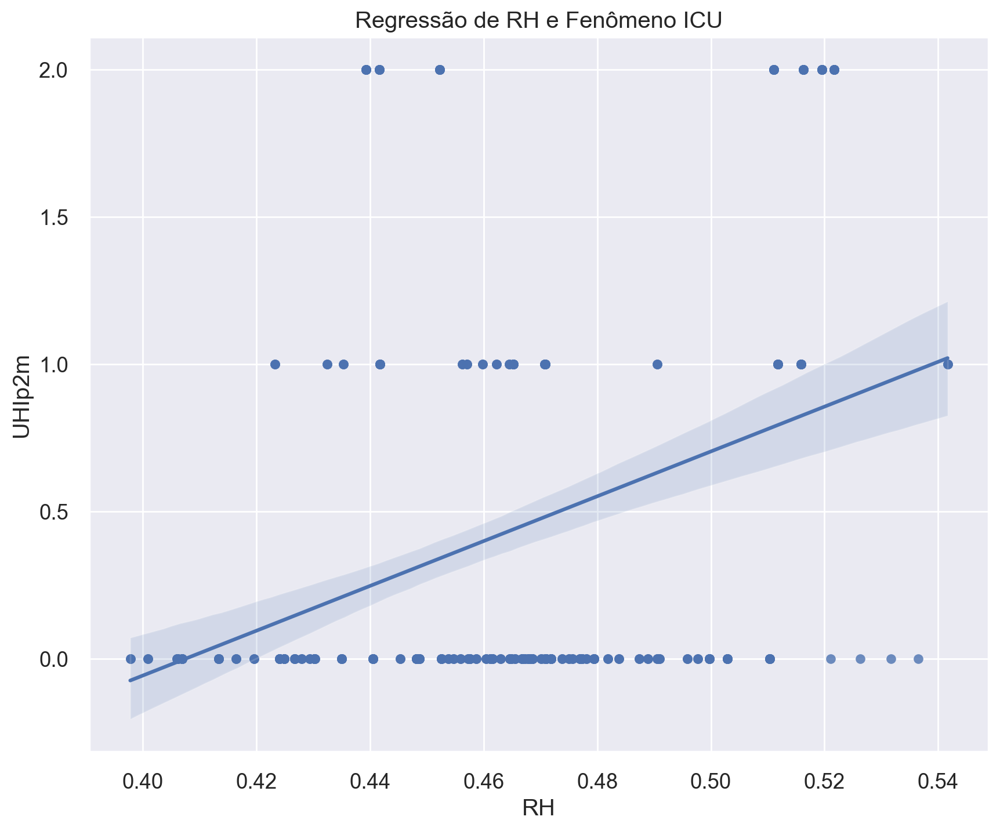

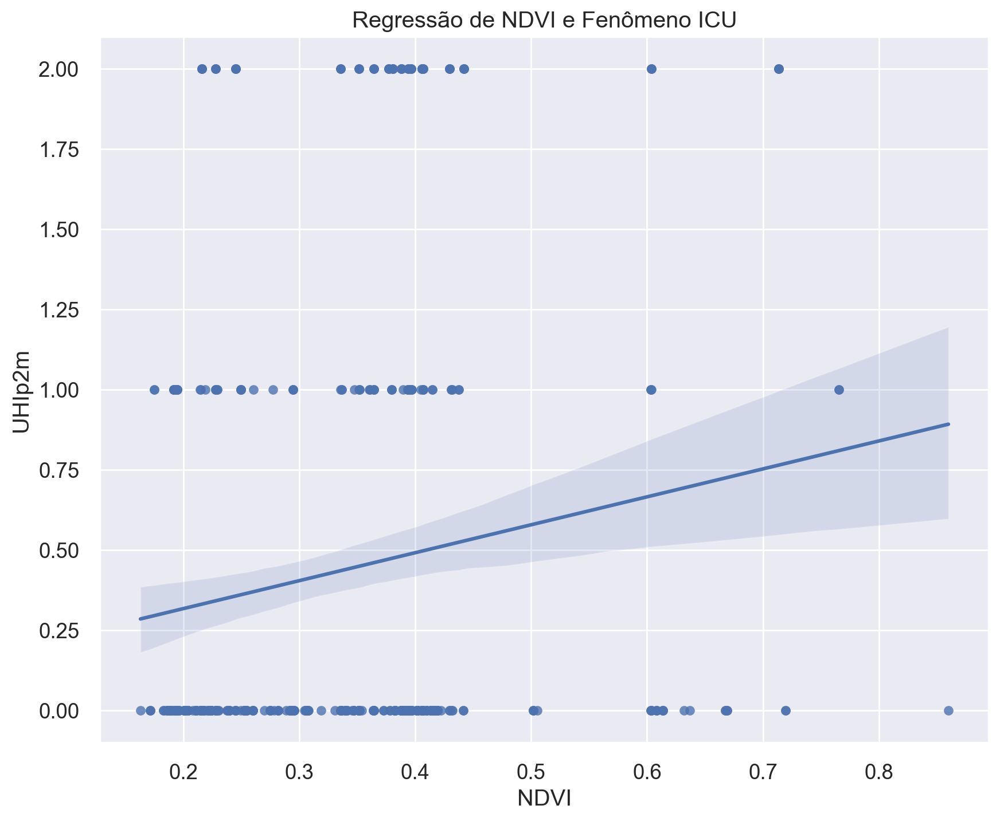

In [296]:
import seaborn as sns # Convention alias for Seaborn

variables = feat

for var in variables:
    plt.figure() # Creating a rectangle (figure) for each plot
    # Regression Plot also by default includes
    # best-fitting regression line
    # which can be turned off via `fit_reg=False`
    sns.regplot(x=var, y=target, data=df).set(title=f'Regressão de {var} e Fenômeno ICU');

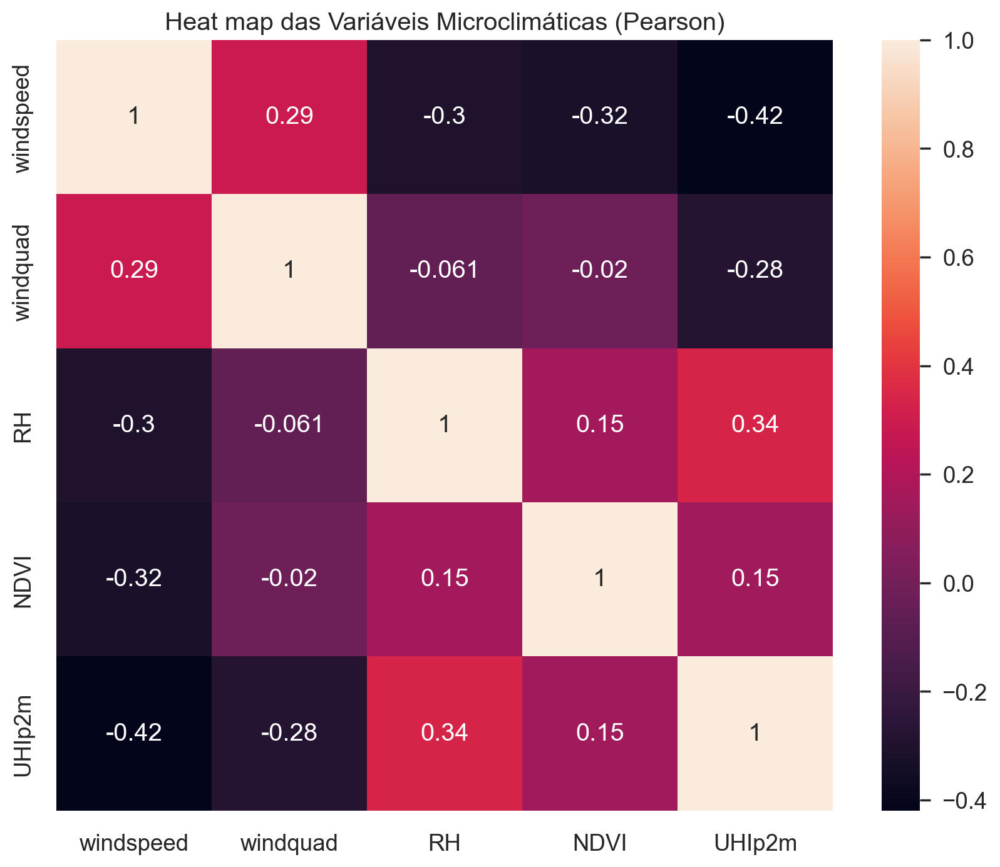

In [297]:
correlations = df[feat + [target]].corr()
# annot=True displays the correlation values
sns.heatmap(correlations, annot=True).set(title='Heat map das Variáveis Microclimáticas (Pearson)');

In [298]:
y = df[target]
X = df[feat]

In [299]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,  random_state=random_state)

In [300]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [301]:
print(regressor.intercept_)
print(regressor.coef_)

-1.9816331928873272
[-0.05227987 -0.05901172  6.13318296  0.26075424]


In [302]:
feature_names = X.columns
model_coefficients = regressor.coef_

coefficients_df = pd.DataFrame(data = model_coefficients, 
                              index = feature_names, 
                              columns = ['Coefficient value'])
print(coefficients_df)

           Coefficient value
windspeed          -0.052280
windquad           -0.059012
RH                  6.133183
NDVI                0.260754


In [303]:
y_pred = regressor.predict(X_test)

In [304]:
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results)

      Actual  Predicted
3588       0   0.908575
561        1   0.252047
4063       0   0.111745
4730       0   0.059818
1822       0   0.380834
...      ...        ...
371        1   0.473971
1803       2   0.538712
2826       2   0.490055
343        0  -0.177699
138        0   0.000446

[136 rows x 2 columns]


In [305]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

Mean absolute error: 0.49
Mean squared error: 0.36
Root mean squared error: 0.60


In [306]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

R²: 0.1560992769880345


In [307]:
print(regressor.score(X_test, y_test))
print(regressor.score(X_train, y_train))

0.15609927698803383
0.2843612587477222


In [308]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
tree_classifier = DecisionTreeClassifier(max_depth=int(md), random_state=random_state, max_features='auto', criterion='entropy')
tree_classifier.fit(df[features].values, df[target].values)

DecisionTreeClassifier(criterion='entropy', max_depth=8, max_features='auto',
                       random_state=42)

In [309]:
viz_model = dtreeviz.model(tree_classifier,
                           X_train=df[features], 
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU', 
                           class_names=classes)

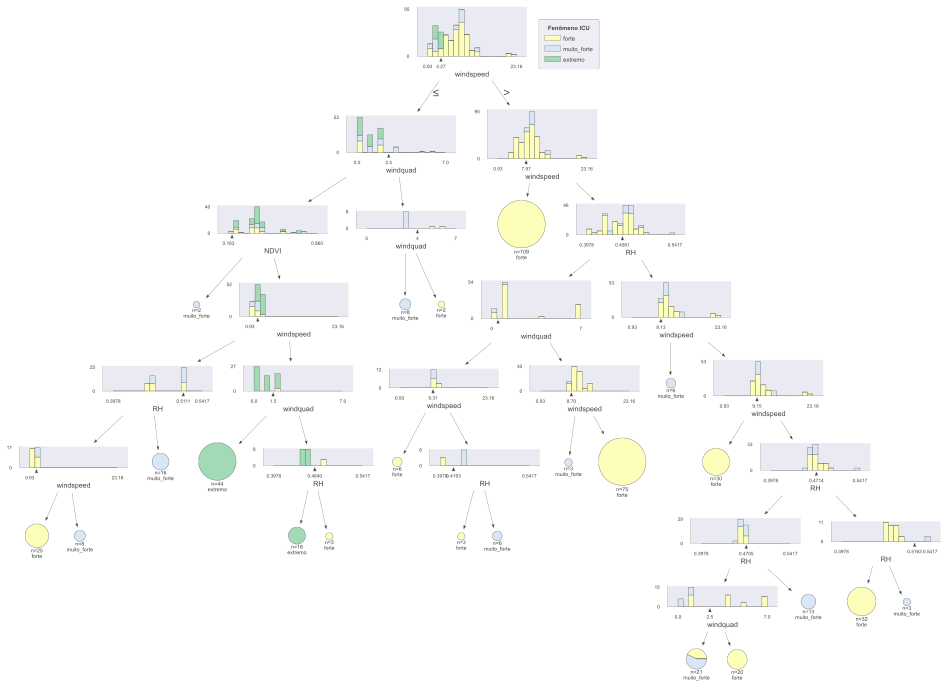

In [310]:
viz_model.view(scale=0.8)

In [311]:
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeClassifier()
pipe = Pipeline(steps=[('std_slc', std_slc),
                           ('pca', pca),
                           ('dec_tree', dec_tree)])
n_components = list(range(1,X.shape[1]+1,1))
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]
parameters = dict(pca__n_components=n_components,
                      dec_tree__criterion=criterion,
                      dec_tree__max_depth=max_depth)

In [312]:
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)
print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])

Best Criterion: entropy
Best max_depth: 12
Best Number Of Components: 4

DecisionTreeClassifier(criterion='entropy', max_depth=12)


In [313]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_features': ['sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['gini', 'entropy']
             }
tree_clas = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 6, 7, 8, 9],
                         'max_features': ['sqrt', 'log2']},
             verbose=True)

In [314]:
final_model = grid_search.best_estimator_
final_model

DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=9,
                       max_features='sqrt', random_state=42)

In [315]:
#Training the model
tree_clas = DecisionTreeClassifier(ccp_alpha=0.01, class_weight=None, criterion='entropy',
                       max_depth=9, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, 
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, 
                       random_state=42, splitter='best')
tree_clas.fit(X_train, y_train)
y_predict = tree_clas.predict(X_test)

In [316]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

R²: 0.1560992769880345


In [317]:
# from sklearn.model_selection import RandomizedSearchCV# number of trees in random forest
# n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]# number of features at every split
# max_features = ['log2', 'sqrt']

# # max depth
# max_depth = [int(x) for x in np.linspace(100, 500, num = 11)]
# max_depth.append(None)# create random grid
# random_grid = {
#  'n_estimators': n_estimators,
#  'max_features': max_features,
#  'max_depth': max_depth
#  }# Random search of parameters
# rfc_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 10, random_state=42, n_jobs = -1)# Fit the model
# rfc_random.fit(X_train, y_train)# print results
# print(rfc_random.best_params_)

In [318]:
# rfc = RandomForestClassifier(n_estimators=600, max_depth=300, max_features='sqrt')
# rfc.fit(X_train,y_train)
# rfc_predict = rfc.predict(X_test)
# rfc_cv_score = cross_val_score(rfc, X, y, cv=10, scoring='roc_auc')

# print("=== Confusion Matrix ===")
# print(confusion_matrix(y_test, rfc_predict))
# print('\n')print("=== Classification Report ===")
# print(classification_report(y_test, rfc_predict))
# print('\n')print("=== All AUC Scores ===")print(rfc_cv_score)
# print('\n')print("=== Mean AUC Score ===")
# print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

In [319]:
import xgboost
import shap

model = xgboost.XGBClassifier(n_estimators=20)
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=20, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [320]:
X

,windspeed,windquad,RH,NDVI
53,7.387343,0,0.476950,0.318940
60,9.133717,0,0.468182,0.419299
109,2.281553,2,0.511810,0.431238
110,2.049673,1,0.515845,0.431238
135,7.084406,0,0.466726,0.388546
...,...,...,...,...
5263,9.307008,1,0.457110,0.191585
5264,9.309723,0,0.459806,0.191585
5272,8.214487,4,0.463012,0.188724
5275,11.880875,4,0.481825,0.188724


In [321]:
y

53      0
60      0
109     1
110     1
135     0
       ..
5263    1
5264    1
5272    0
5275    0
5276    0
Name: UHIp2m, Length: 451, dtype: int64

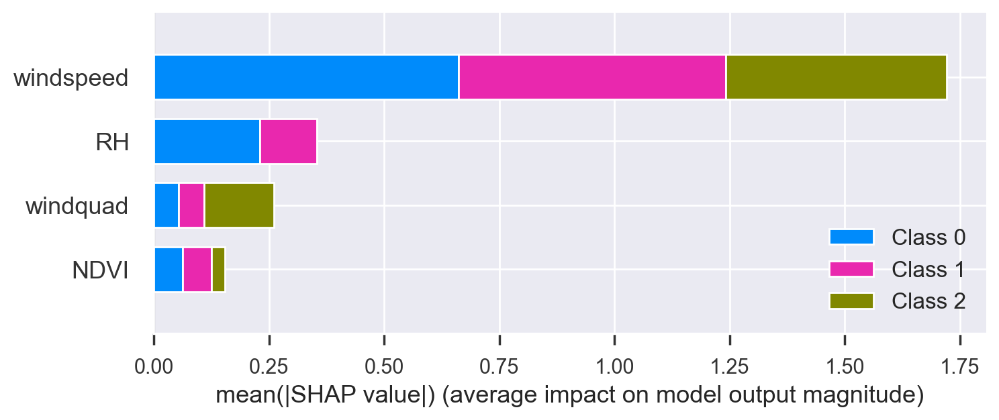

In [322]:
# equilibrated case
background =  shap.utils.sample(X, 100) #X.sample(1000) #X is equilibrated# background used in explainer defines base value
explainer = shap.TreeExplainer(model,background,model_output="raw" )
shap_values = explainer.shap_values(X)# background used in the plot, the points that are visible on the plot
shap.summary_plot(shap_values,background, feature_names=background.columns)

In [323]:
X

,windspeed,windquad,RH,NDVI
53,7.387343,0,0.476950,0.318940
60,9.133717,0,0.468182,0.419299
109,2.281553,2,0.511810,0.431238
110,2.049673,1,0.515845,0.431238
135,7.084406,0,0.466726,0.388546
...,...,...,...,...
5263,9.307008,1,0.457110,0.191585
5264,9.309723,0,0.459806,0.191585
5272,8.214487,4,0.463012,0.188724
5275,11.880875,4,0.481825,0.188724


In [324]:
windquad = (
    X['windquad']
    .apply(lambda quad: 'primeiro' if quad == 0 else ('segundo' if quad == 1 else ('terceiro' if quad == 2 else ('quarto' if quad == 3 else 
                                                                                                                ('quinto' if quad == 4 else 
                                                                                                                ('sexto' if quad == 5 else 
                                                                                                                ('sétimo' if quad == 6 else 'oitavo')))))))                                                                                                
    .values
)

In [325]:
X,y

(      windspeed  windquad        RH      NDVI
 53     7.387343         0  0.476950  0.318940
 60     9.133717         0  0.468182  0.419299
 109    2.281553         2  0.511810  0.431238
 110    2.049673         1  0.515845  0.431238
 135    7.084406         0  0.466726  0.388546
 ...         ...       ...       ...       ...
 5263   9.307008         1  0.457110  0.191585
 5264   9.309723         0  0.459806  0.191585
 5272   8.214487         4  0.463012  0.188724
 5275  11.880875         4  0.481825  0.188724
 5276  12.107019         4  0.490986  0.188724
 
 [451 rows x 4 columns],
 53      0
 60      0
 109     1
 110     1
 135     0
        ..
 5263    1
 5264    1
 5272    0
 5275    0
 5276    0
 Name: UHIp2m, Length: 451, dtype: int64)

In [326]:
# X['quad'] = X['windquad'].apply(lambda quad: 'primeiro' if quad == 0 else ('segundo' if quad == 1 else ('terceiro' if quad == 2 else ('quarto' if quad == 3 else 
#                                                                                                                 ('quinto' if quad == 4 else 
#                                                                                                                 ('sexto' if quad == 5 else 
#                                                                                                                 ('sétimo' if quad == 6 else 'oitavo')))))))

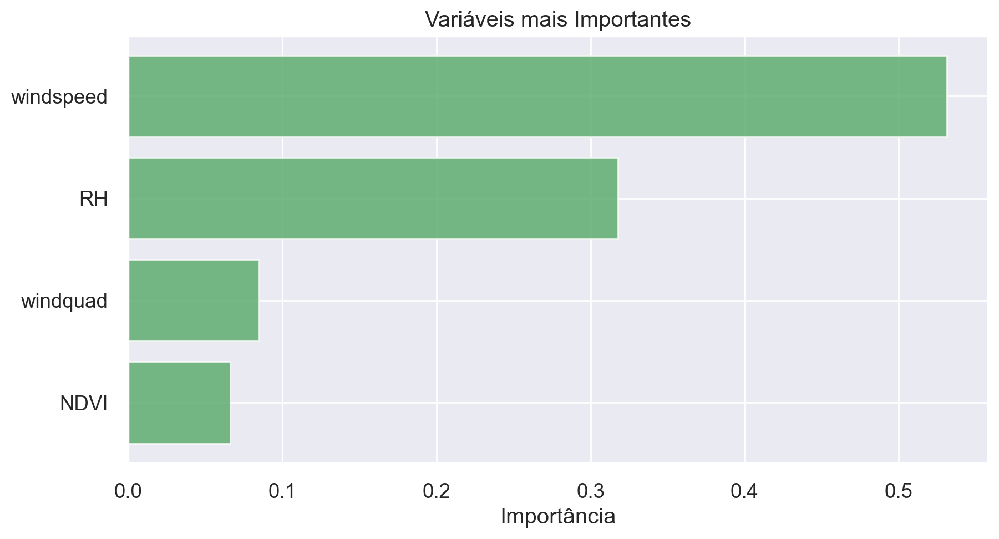

In [327]:
rfc = RandomForestClassifier(max_depth=int(md), random_state=random_state, n_estimators=500)
rfc.fit(X, y)
importances = rfc.feature_importances_
indices = np.argsort(importances)
features = X.columns
plt.figure(figsize=(10,5))
plt.title('Variáveis mais Importantes')
plt.barh(range(len(indices)), importances[indices], color='g', align='center',linestyle="solid",alpha=0.8)
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Importância')
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

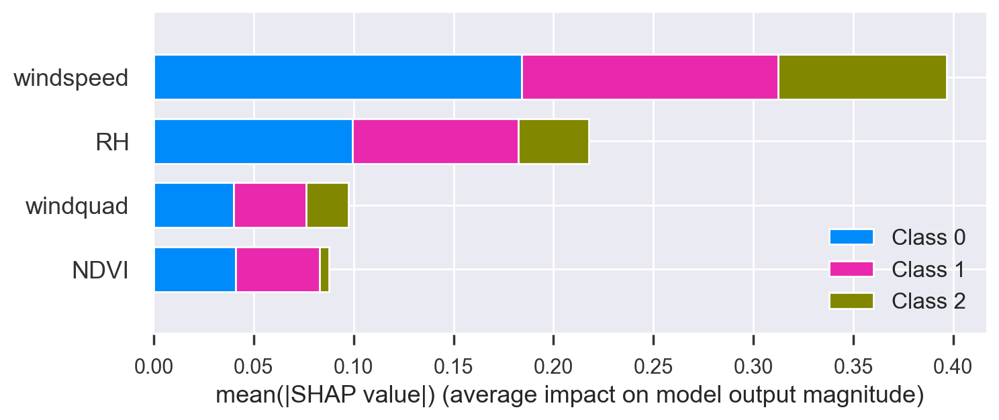

In [328]:
explainer = shap.KernelExplainer(rfc.predict_proba,X[:100])
shap_values = explainer.shap_values(X[:100])
shap.summary_plot(shap_values, X[:100])

In [329]:
#class 0 -> muito_forte
#class 1 -> Forte
#class 2 -> Extremo

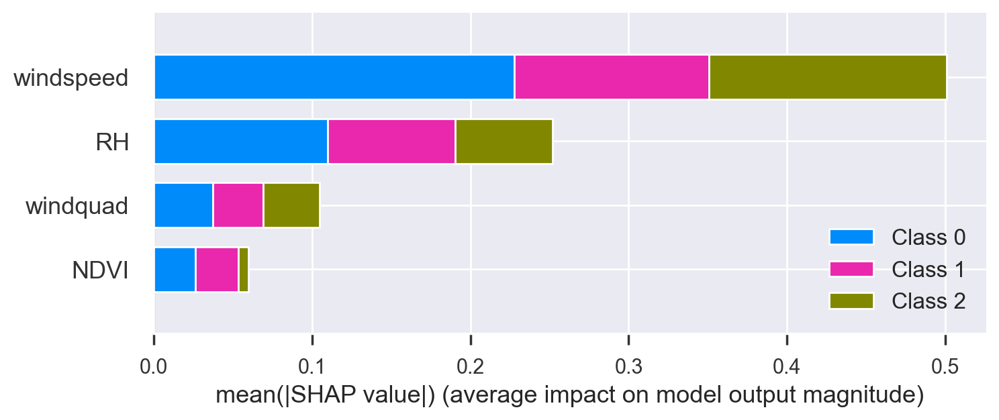

In [330]:
explainer = shap.TreeExplainer(rfc)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X)

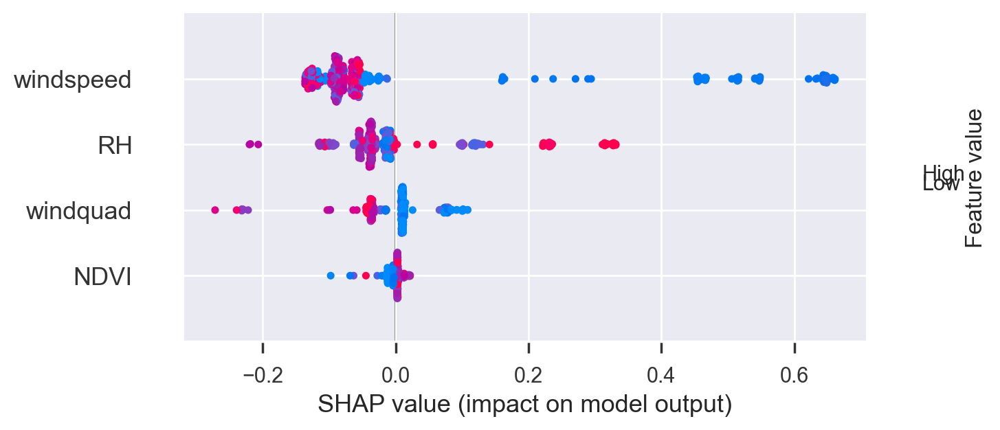

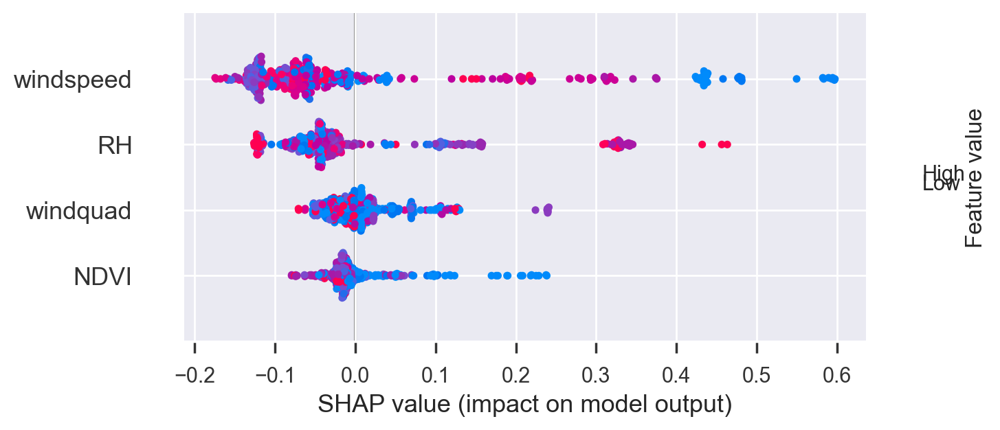

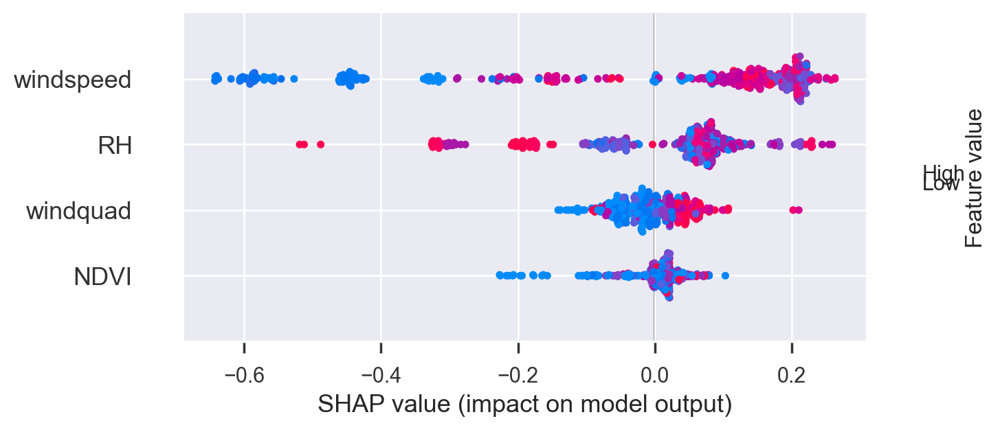

In [331]:
shap.summary_plot(shap_values[2], X)
shap.summary_plot(shap_values[1], X)
shap.summary_plot(shap_values[0], X)

In [332]:
# shap.dependence_plot("RH", shap_values[1], X)

In [333]:
# shap.dependence_plot("RH", shap_values[0], X)

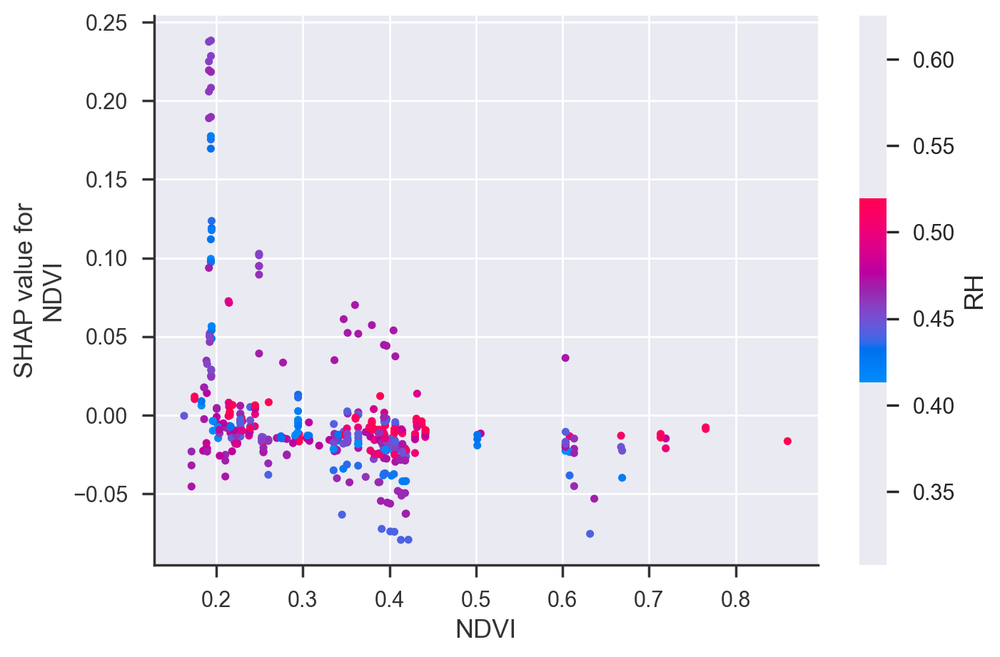

In [334]:
shap.dependence_plot('NDVI', shap_values[1], X, interaction_index="RH")

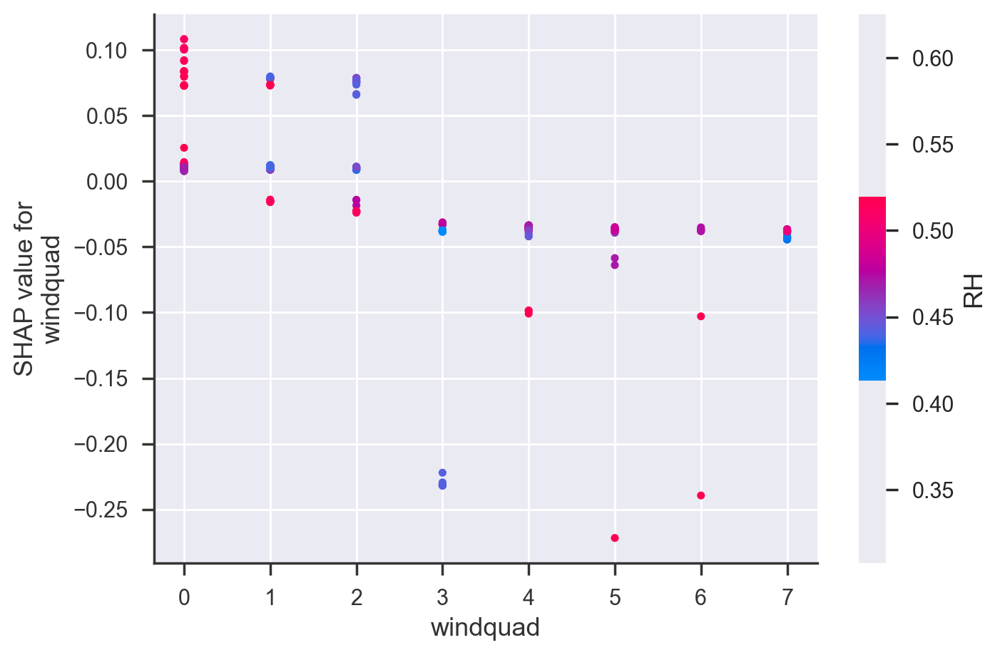

In [335]:
shap.dependence_plot('windquad', shap_values[2], X, interaction_index="RH")

In [336]:
shap.force_plot(explainer.expected_value[1], shap_values[0], X)

In [337]:
columIndex= 2
shap.force_plot(explainer.expected_value[1], shap_values[1][columIndex,:], X.iloc[columIndex,:], link="logit")

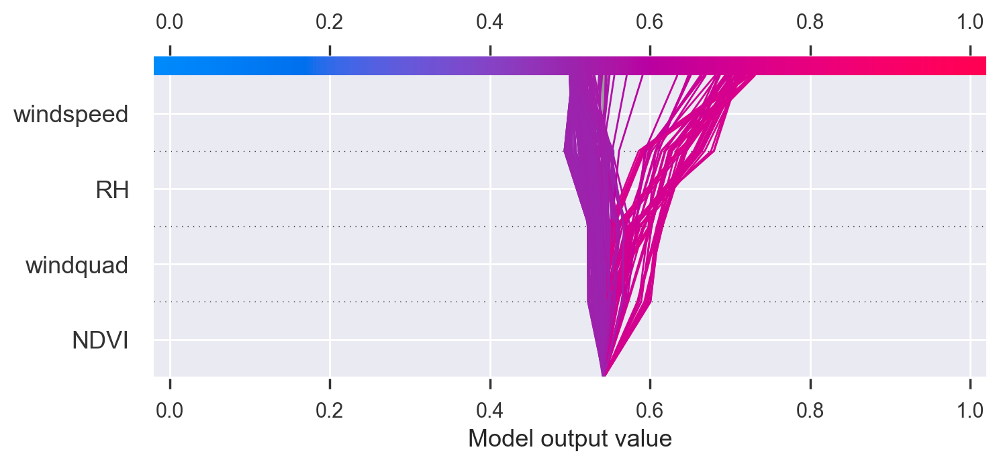

In [338]:
shap.decision_plot(explainer.expected_value[1], shap_values[1], X,link="logit",highlight=1)

In [339]:
import shap
rf_shap_values = shap.KernelExplainer(rf.predict,X_test)

In [340]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor

In [341]:
# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.3)

[0.80738131 0.05248748 0.09284176 0.04728945]


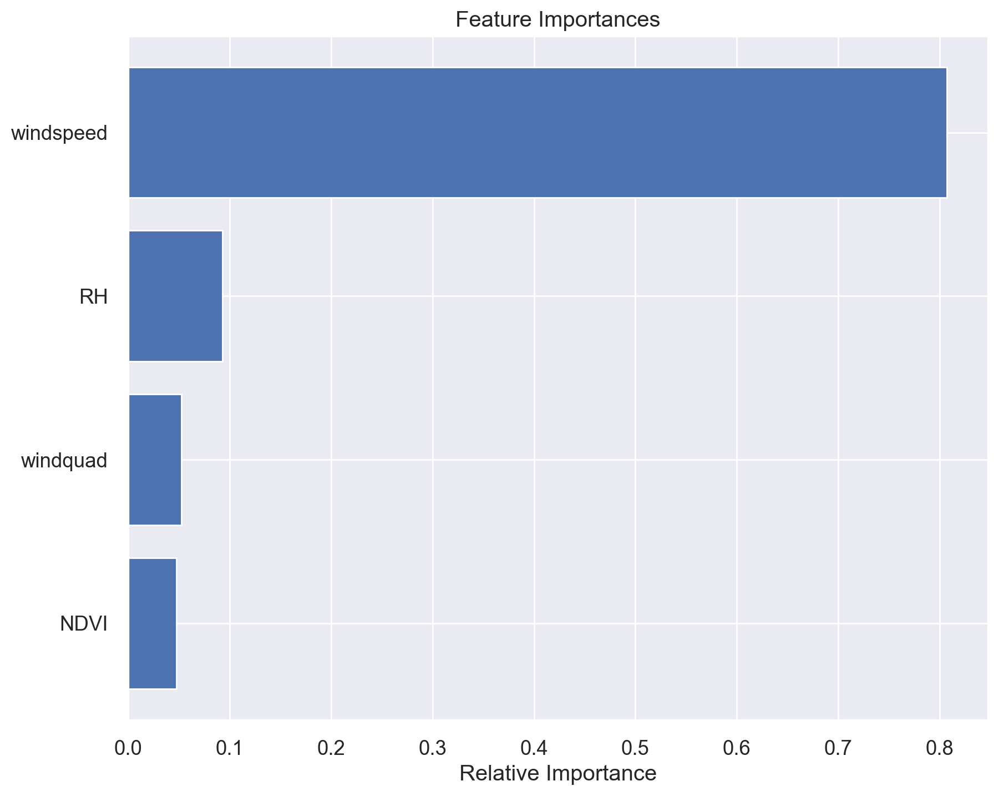

In [342]:
rf = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=300)
rf.fit(X_train, Y_train)  
print(rf.feature_importances_)
importances = rf.feature_importances_
indices = np.argsort(importances)
features = X_train.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

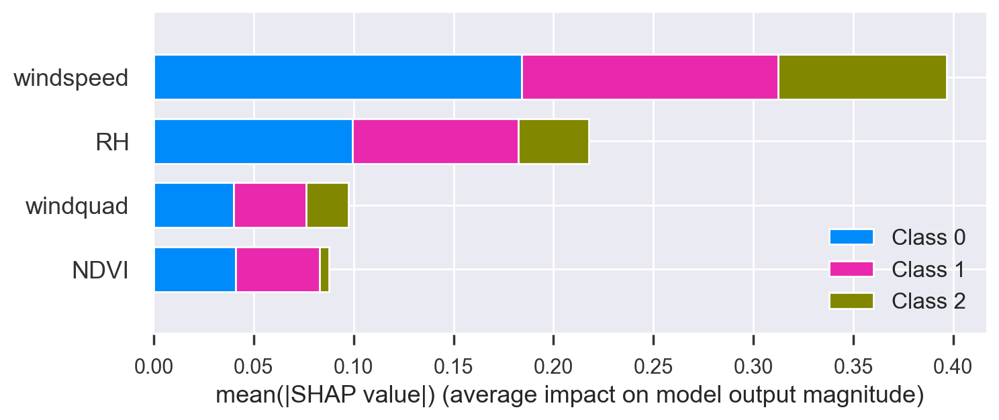

In [343]:
explainer = shap.KernelExplainer(rfc.predict_proba,X[:100])
shap_values = explainer.shap_values(X[:100])
shap.summary_plot(shap_values, X[:100])

In [344]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
print(X_train.shape)

(338, 4)


In [345]:
clf = RandomForestClassifier(n_estimators=500, max_depth=8)
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, n_estimators=500)

In [346]:
explainer = shap.TreeExplainer(clf)
shap_values = np.array(explainer.shap_values(X_train))
print(shap_values.shape)

(3, 338, 4)


In [347]:
shap_values_ = shap_values.transpose((1,0,2))

np.allclose(
    clf.predict_proba(X_train),
    shap_values_.sum(2) + explainer.expected_value
)

True

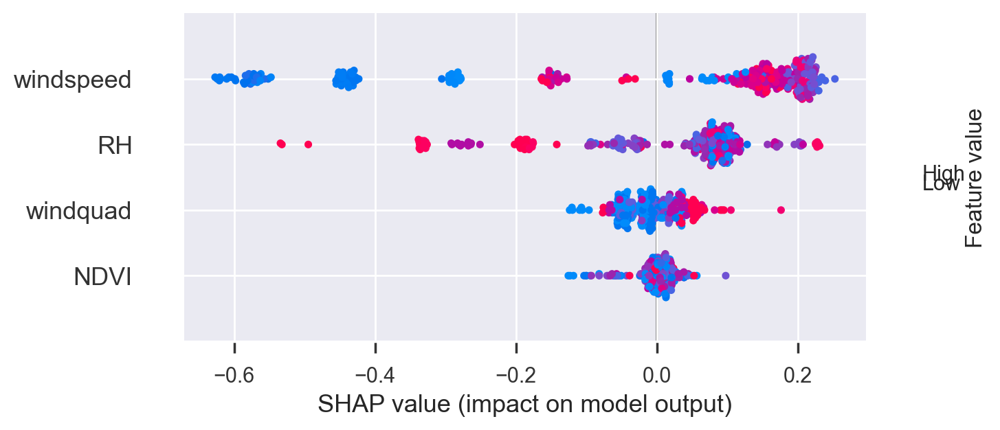

In [348]:
shap.summary_plot(shap_values[0],X_train)

In [349]:
X_train, X_test, y_train, y_test = train_test_split(X,y , stratify=y, test_size = 0.3, random_state=42)

In [350]:
X_train.shape,X_test.shape

((315, 4), (136, 4))

In [351]:
rf = RandomForestClassifier(n_estimators=500, max_depth=8, random_state=42, max_features='sqrt', class_weight='balanced')
rf.fit(X_train, y_train)

# Make predictions for the test set
y_pred_test = rf.predict(X_test)

# Print accuracy for the training and test sets
print("Accuracy on training set: {:.3f}".format(rf.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(rf.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.978


In [352]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred_test)

array([[93,  0,  2],
       [ 1, 22,  0],
       [ 0,  0, 18]])

In [353]:
# Precision
precision_score(y_test, y_pred_test, average=None)[0]

0.9893617021276596

In [354]:
# Precision
recall_score(y_test, y_pred_test, average=None)[0]

0.9789473684210527

In [355]:

print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98        95
           1       1.00      0.96      0.98        23
           2       0.90      1.00      0.95        18

    accuracy                           0.98       136
   macro avg       0.96      0.98      0.97       136
weighted avg       0.98      0.98      0.98       136



In [356]:
df[['windquad','windspeed']]

,windquad,windspeed
53,0,7.387343
60,0,9.133717
109,2,2.281553
110,1,2.049673
135,0,7.084406
...,...,...
5263,1,9.307008
5264,0,9.309723
5272,4,8.214487
5275,4,11.880875
